# **Part A (Analysis of the Given Dataset)**

Dataset Description: Titanic Dataset

![](https://cdn.pixabay.com/photo/2021/03/04/16/32/ship-6068668_1280.png)

Data Dictionary:


1.	'Survival': 0 = No, 1 = Yes
2.	'Pclass': Ticket class 1 = 1st, 2 = 2nd, 3 = 3rd
3.	'Sex': Sex
4.	'Age': Age in years
5.	'SibSp':  siblings/spouses aboard 
6.	'Parch':  parents/children aboard 
7.	'Ticket': Ticket number
8.	'Fare': Passenger fare
9.	'Cabin': Cabin number
10.	'Embarked': Port of Embarkation C = Cherbourg, Q = Queenstown, S = Southampton


The data has been split into two groups:
1.	training set (train.csv)
2.	test set     (test.csv (without output (Survived)))
3.  test set output (Survived) given in this csv file (gender_submission.csv)

\\
The training set should be used to build your machine-learning models. 

The test set should be used to see how well your model performs on unseen data.







## 1. Provide an overview of the given Dataset including the Dataset Characteristics and Exploratory Data Analysis, data preprocessing and performance of different ML models. This section should be written after completing Part A. 

**Titanic Dataset:** 
In this section, we are working with the Titanic dataset, analyzing and preprocessing the data, and evaluating its performance with different Machine Learning models. The dataset consists of three types of data: 'train_data' (891 rows × 12 columns), 'test_data' (418 rows × 11 columns), and 'gender_data' (418 rows × 2 columns). 

These datasets have too many missing values, which creates bias and that is not good for the machine learning model. The results of a machine learning model trained on this dataset may not accurately reflect the real-world phenomena being studied. The highest percentage of missing data in this dataset is in the Cabin and Age columns. We tried to reduce the bias to improve our data analysis. We replaced the missing data for 'Age' with the median and drop the 'Cabin' column. 

We also used the correlation matrix to observe the relationship between the variables. From the correlation matrix, we see that the highest positive correlation is between Survived and Gender (Sex_Number). 

We compare the data using box plots, pie charts, bar charts, etc. to determine who survived or not. We use different categories such as AGE, male vs female, survival for each ticket class, parents vs children, siblings or spouses, etc. Then, we trained machine learning models based on the Titanic dataset.

The 'train_data' dataset includes variables such as PassengerId, Survived, Pclass, Name, Sex, Age, SibSp, Parch, Ticket, Fare, Cabin, and Embarked, which are useful for machine learning models.

Finally, we performed logistic regression with default parameters and with different parameters. We changed the parameters for better performance and evaluated the performance of logistic regression models with different parameters on the Titanic dataset.

**Advertising Dataset:** 
Similarly, we are working on the Advertising dataset, analyzing and preprocessing the data and evaluating its performance with different Machine Learning models. We also perform the same type of analysis as we did for the Titanic dataset. We identify any missing or duplicate values and visualize missing values. However, in this dataset, there are no missing or duplicate values. 

We also identify a correlation matrix and find that TV advertising spending has a strong positive correlation with sales, followed by radio advertising spending and newspaper advertising spending. We compare the data using box plots, pie charts, bar charts etc. 

We use linear regression with default parameters and with two  different parameters. We trained these three models and checked the performance for this dataset.

In part A, we learnt about the basic step-by-step process of training a machine learning model and evaluating their results.

## 2.	Dataset Characteristics and Exploratory Data Analysis

In this section, introduce your dataset. Mention number of rows, columns and other characteristics. Provide the histograms of data distribution and correlations among the variable (hints: heatmap, groupby, etc) with a suitable discussion. Try to stand out and be creative. (Add as many cells as you need). Note, we will be watching for copy-paste here.

### 2.1 Load, view data and show analysis on data. Be creative. Investigate like a detective.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
sns.set(style="darkgrid")
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
from scipy import stats


In [ ]:
train_data = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/train.csv")
test_data = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/test.csv")
gender_data = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/gender_submission.csv")


In [ ]:
display('Train Data:',train_data.head(), 'Test Data:',test_data.head(), 'Gender Data:',gender_data.head())


'Train Data:'

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


'Test Data:'

,PassengerId,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,892,3,"Kelly, Mr. James",male,34.5,0,0,330911,7.8292,NaN,Q
1,893,3,"Wilkes, Mrs. James (Ellen Needs)",female,47.0,1,0,363272,7.0000,NaN,S
2,894,2,"Myles, Mr. Thomas Francis",male,62.0,0,0,240276,9.6875,NaN,Q
3,895,3,"Wirz, Mr. Albert",male,27.0,0,0,315154,8.6625,NaN,S
4,896,3,"Hirvonen, Mrs. Alexander (Helga E Lindqvist)",female,22.0,1,1,3101298,12.2875,NaN,S


'Gender Data:'

,PassengerId,Survived
0,892,0
1,893,1
2,894,0
3,895,0
4,896,1


In [ ]:
# Merging gender table and test table to dataframe 'gender_test'
left = gender_data
right = test_data

gender_test = pd.merge(left, right, on=["PassengerId"])
gender_test


,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,892,0,3,"Kelly, Mr. James",male,34.5,0,0,330911,7.8292,NaN,Q
1,893,1,3,"Wilkes, Mrs. James (Ellen Needs)",female,47.0,1,0,363272,7.0000,NaN,S
2,894,0,2,"Myles, Mr. Thomas Francis",male,62.0,0,0,240276,9.6875,NaN,Q
3,895,0,3,"Wirz, Mr. Albert",male,27.0,0,0,315154,8.6625,NaN,S
4,896,1,3,"Hirvonen, Mrs. Alexander (Helga E Lindqvist)",female,22.0,1,1,3101298,12.2875,NaN,S
...,...,...,...,...,...,...,...,...,...,...,...,...
413,1305,0,3,"Spector, Mr. Woolf",male,NaN,0,0,A.5. 3236,8.0500,NaN,S
414,1306,1,1,"Oliva y Ocana, Dona. Fermina",female,39.0,0,0,PC 17758,108.9000,C105,C
415,1307,0,3,"Saether, Mr. Simon Sivertsen",male,38.5,0,0,SOTON/O.Q. 3101262,7.2500,NaN,S
416,1308,0,3,"Ware, Mr. Frederick",male,NaN,0,0,359309,8.0500,NaN,S


In [ ]:
# Merging the created dataframe 'gender_test' to the existing dataframe 'train_data'
df = pd.concat([train_data, gender_test])
df.head()


,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


In [ ]:
# Show all column names
# Code Here
print(*df.columns, sep = ', ')


PassengerId, Survived, Pclass, Name, Sex, Age, SibSp, Parch, Ticket, Fare, Cabin, Embarked


In [ ]:
# Overview about Columns, Range, Non-Null Value Counts, Memory Usage and Data Types (#df.dtpyes)
# Code Here
df.info()

print('\nOverview about Columns:')
print(df.describe().transpose())


<class 'pandas.core.frame.DataFrame'>
Int64Index: 1309 entries, 0 to 417
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  1309 non-null   int64  
 1   Survived     1309 non-null   int64  
 2   Pclass       1309 non-null   int64  
 3   Name         1309 non-null   object 
 4   Sex          1309 non-null   object 
 5   Age          1046 non-null   float64
 6   SibSp        1309 non-null   int64  
 7   Parch        1309 non-null   int64  
 8   Ticket       1309 non-null   object 
 9   Fare         1308 non-null   float64
 10  Cabin        295 non-null    object 
 11  Embarked     1307 non-null   object 
dtypes: float64(2), int64(5), object(5)
memory usage: 132.9+ KB

Overview about Columns:
              count        mean         std   min       25%       50%  \
PassengerId  1309.0  655.000000  378.020061  1.00  328.0000  655.0000   
Survived     1309.0    0.377387    0.484918  0.00    0.0000    0.0000  

In [ ]:
# Count rows and coulums
# Code Here
rows, cols = df.shape
print(f'Rows: {rows}')
print(f'Columns: {cols}')


Rows: 1309
Columns: 12


In [ ]:
# Total cells in the dataset
# Code Here
print(f'Total cells: {rows * cols}')


Total cells: 15708


### 2.2 Data Cleaning









#### Identifying duplicate values


In [ ]:
# Code Here

"""
We first use the duplicated() method to create a boolean mask that is True for
each row that is a duplicate of a previous row.
We then use boolean indexing to select the rows that correspond to the True
values in the boolean mask, which are the duplicate rows.
Finally, we print the duplicate rows using the print() function.
"""
duplicates = df[df.duplicated()]
print(f'Number of duplicates: {duplicates.shape[0]}')

#The following dataset has no dublicates hence no output.


Number of duplicates: 0


#### Identifying missing values


In [ ]:
# Find the amount of missing values in each column
# Code Here

"""
To find the amount of missing values in each column of a pandas dataframe,
we can use the isna() method to create a boolean mask that is True where the
values are missing, and False otherwise. Then we can use the sum() method on
this boolean mask to count the number of True values in each column.
"""

missing_values = df.isna().sum()

"""
To print only the columns that have missing values in a pandas dataframe,
we can modify the previous example to select only the columns that have
at least one missing value using boolean indexing.

To print both the column names and their corresponding missing value counts
in a pandas dataframe, we can modify the previous example to print the
output as a dataframe using the loc[] method.
"""

print(missing_values.loc[missing_values > 0])


Age          263
Fare           1
Cabin       1014
Embarked       2
dtype: int64


In [ ]:
# Calculating the percentage of missing values:
mis_per = (missing_values / len(df)) * 100

# Making a table
mis_table = pd.concat([missing_values, mis_per.round(2)], axis = 1)

# Renaming the columns
mis_table_ren = mis_table.rename(columns = {0 : 'Missing Values', 1 : 'Percentage of Total Values'})

print(mis_table_ren.loc[mis_per > 0])


          Missing Values  Percentage of Total Values
Age                  263                       20.09
Fare                   1                        0.08
Cabin               1014                       77.46
Embarked               2                        0.15


#### Visualisation of missing data


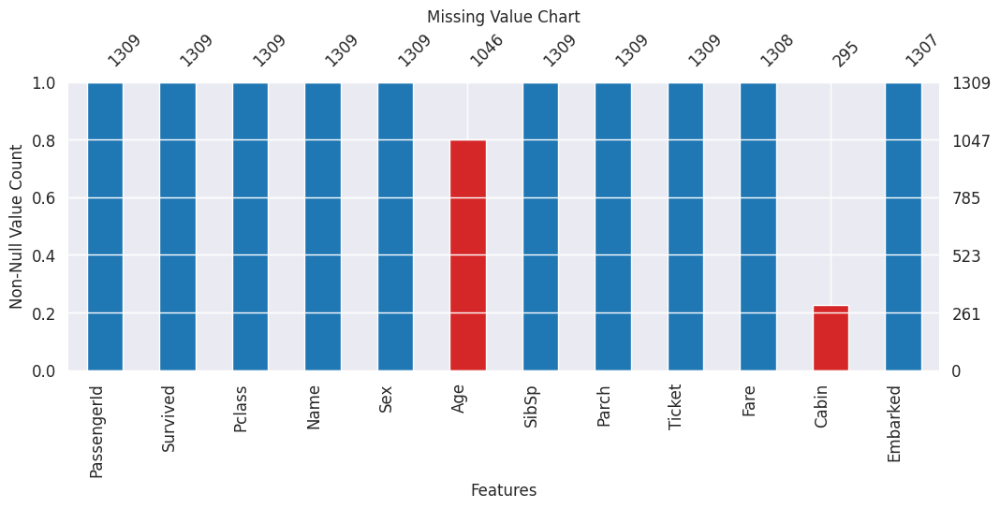

In [ ]:
# Detect missing values
import missingno as msno

mask = df.count() >= len(df) * 0.99
colors = np.where(mask, 'tab:blue', 'tab:red')

fig, ax = plt.subplots(figsize=(12, 4))
msno.bar(df, ax = ax, fontsize = 12, color = colors)
ax.set_xlabel('Features', fontsize=12)
ax.set_ylabel('Non-Null Value Count', fontsize = 12)
ax.set_title('Missing Value Chart', fontsize = 12)
ax.set_xticklabels(df.columns, rotation = 90)
plt.show()


#### Dealing with missing values. Fix the missing value problem.



1.   Do analysis using plots. Fix issues.

2.   Provide an appropriate discussion




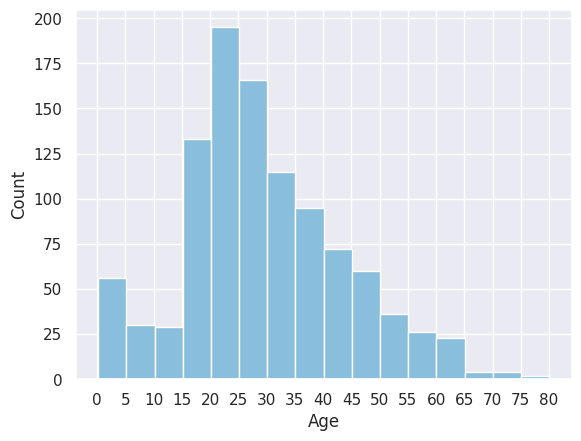

In [ ]:
# Code Here (Add as many cells as you need)
colors = sns.color_palette('Blues')

plt.hist(df['Age'], bins = 16, color = colors[2])
plt.xlabel('Age')
plt.ylabel('Count')
plt.xticks(np.arange(0, 85, 5))
plt.show()


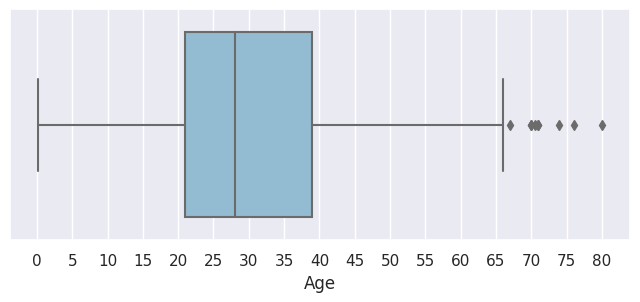

In [ ]:
plt.figure(figsize = (8,3))
sns.boxplot(x = df['Age'], color = colors[2])
plt.xlabel('Age')
plt.xticks(np.arange(0, 85, 5))
plt.show()


In [ ]:
# Calculating median and replacing missing values in 'Age' column with median
age_median = df['Age'].median()
df['Age'].fillna(age_median, inplace = True)

# Checking number of missing values
df['Age'].isna().sum()


0

In [ ]:
# Calculating mean and replacing missing values in 'Fare' column with mean
fare_mean = df['Fare'].mean()
df['Fare'].fillna(fare_mean, inplace = True)

df['Fare'].isna().sum()


0

In [ ]:
df['Embarked'].unique()


array(['S', 'C', 'Q', nan], dtype=object)

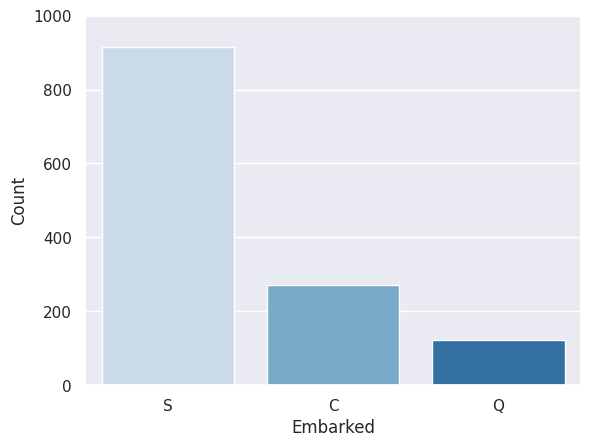

In [ ]:
palette = sns.color_palette('Blues', 3)

# Creating a bar plot of 'Embarked'
sns.countplot(x = 'Embarked', data = df, palette = palette)
plt.xlabel('Embarked')
plt.ylabel('Count')
plt.yticks(np.arange(0, 1200, 200))
plt.show()


In [ ]:
# Replacing missing values in 'Embarked' column with mode as the plot shows there are too many 'S'
embarked_mode = df['Embarked'].mode()[0]
df['Embarked'].fillna(embarked_mode, inplace=True)

df['Embarked'].isna().sum()


0

In [ ]:
# Dropping 'Cabin' column as it has too many missing values
df.drop(columns = ['Cabin'], inplace = True)
df


,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,S
...,...,...,...,...,...,...,...,...,...,...,...
413,1305,0,3,"Spector, Mr. Woolf",male,28.0,0,0,A.5. 3236,8.0500,S
414,1306,1,1,"Oliva y Ocana, Dona. Fermina",female,39.0,0,0,PC 17758,108.9000,C
415,1307,0,3,"Saether, Mr. Simon Sivertsen",male,38.5,0,0,SOTON/O.Q. 3101262,7.2500,S
416,1308,0,3,"Ware, Mr. Frederick",male,28.0,0,0,359309,8.0500,S


 ##### Discuss your findings

- For 'Age' column, there are 263 missing values. First, we visualize the distribution of 'Age' using a histogram. The histogram shows that passenger's age is roughly normally distributed with a peak around 20-25 years. Now we make a boxplot of 'Age' column to understand the five values. They are the min, first quartile, median, third quartile, and the max. The median age is 28.0. Now we fill the missing values using the fillna() method with a value of median age of the passengers as median is not influenced by the outliers of the variable.

- For 'Fare' column, there is only 1 missing value. We can fill this value using the mean fare of the passengers.

- For 'Embarked' column, there are 2 missing values. First, we get the unique values of 'Embarked' column. Now we visualize the 'Embarked' variable, which is a categorical variable using a bar plot to show the frequency of each category. This will help us understand the distribution of passengers who embarked from each port. The plot shows that there are too many 'S' in the dataset. So, we can fill these values using the mode value of the variable.

- For 'Cabin' column, there are 1014 missing values which is almost 80% of the data. It might not be meaningful to fill these empty cells with any estimate. So, a better strategy might be to drop this variable from the analysis.

### 2.3 Analysing Patterns using Visualisations

The data type of 'Sex' is an object, which will not be visible in a correlation. So, if we like to include the values of the column 'Sex' into the correlation matrix by creating a new column 'Sex_Number' and set the value 'female' to '1' and 'male' to '0'. 

In [ ]:
# Creating a new column 'SexNo' with the values '1' for 'female' and '0' for 'male'
df['Sex_Number'] = np.where((df['Sex'] == "female"), 1, 0)
# Checking if the column 'SexNo' has been added
df.head()


,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Embarked,Sex_Number
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,S,0
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C,1
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,S,1
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,S,1
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,S,0


#### 2.3.1 Visualization of column correlation (use groupby). Also, plot Heat Map

In [ ]:
# Correlation table including the new column 'SexNo'
correlation = df.corr()
correlation


<ipython-input-24-8a10b226dc37>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation = df.corr()


,PassengerId,Survived,Pclass,Age,SibSp,Parch,Fare,Sex_Number
PassengerId,1.000000,-0.020370,-0.038354,0.025799,-0.055224,0.008942,0.031416,-0.013406
Survived,-0.020370,1.000000,-0.264710,-0.043286,0.002370,0.108919,0.233568,0.688371
Pclass,-0.038354,-0.264710,1.000000,-0.377908,0.060832,0.018322,-0.558477,-0.124617
Age,0.025799,-0.043286,-0.377908,1.000000,-0.189972,-0.125851,0.178860,-0.053663
SibSp,-0.055224,0.002370,0.060832,-0.189972,1.000000,0.373587,0.160224,0.109609
Parch,0.008942,0.108919,0.018322,-0.125851,0.373587,1.000000,0.221522,0.213125
Fare,0.031416,0.233568,-0.558477,0.178860,0.160224,0.221522,1.000000,0.185484
Sex_Number,-0.013406,0.688371,-0.124617,-0.053663,0.109609,0.213125,0.185484,1.000000


Correlation heatmaps are a type of plot that visualize the strength of relationships between numerical variables. Correlation plots are used to understand which variables are related to each other and the strength of this relationship.

**seaborn.heatmap**

Plot rectangular data as a color-encoded matrix.

This is an Axes-level function and will draw the heatmap into the currently-active Axes if none is provided to the ax argument. Part of this Axes space will be taken and used to plot a colormap, unless cbar is False or a separate Axes is provided to cbar_ax.

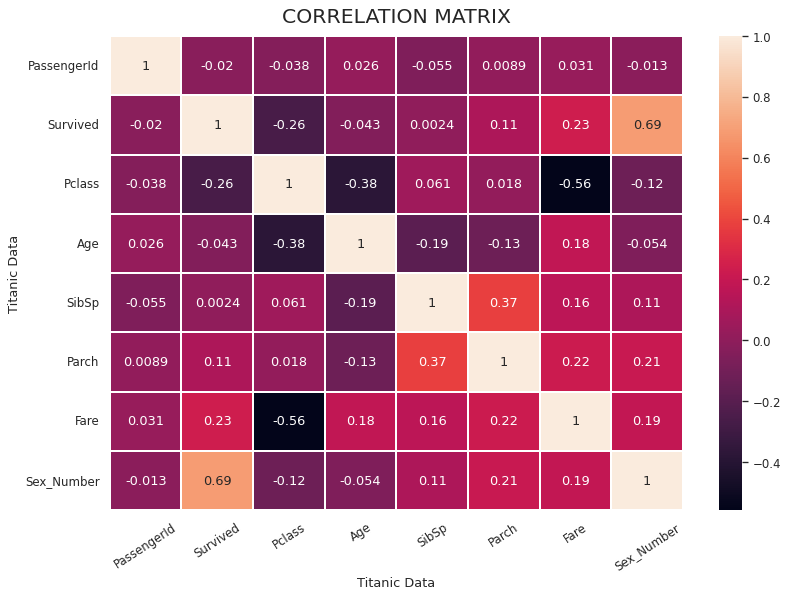

In [ ]:
# Visualisation of the corralation table

plt.figure(figsize=(12,8), dpi=77)
sns.heatmap(correlation, linecolor='white',linewidths=0.1, annot=True)
plt.title('Correlation Matrix'.upper(), size=19, pad=13)
plt.xlabel('Titanic Data')
plt.ylabel('Titanic Data')
plt.xticks(rotation=33)
plt.show()


 What do you undersend/find from the analysis above (section 2.3.1)? Write in your own words in this cell.

Write below:

Some observations from the correlation matrix are:

1. The highest positive correlation is between Survived and Gender (Sex_Number) with a coefficient of 0.69. This suggests that there is a moderate positive relationship between being female and surviving the Titanic disaster.

2. Pclass has a moderate negative correlation with Survived with a coefficient of -0.26. This suggests that passengers in higher class (lower values of Pclass) had a higher chance of survival.

3. There is a moderate negative correlation between Pclass and Fare, with a coefficient of -0.56. This suggests that passengers in higher class paid more for their tickets.

4. There is a small negative correlation between Age and Pclass, with a coefficient of -0.38. This suggests that passengers in higher class tended to be younger.

5. There is a small negative correlation between Age and SibSp, with a coefficient of -0.19. This suggests that passengers with siblings or spouses tended to be younger.

6. There is a small positive correlation between Fare and Survived, with a coefficient of 0.23. This suggests that passengers who paid more for their tickets had a higher chance of survival.

7. There is a small positive correlation between SibSp and Parch, with a coefficient of 0.37. This suggests that passengers with more siblings or spouses tended to have more parents or children on board.

#### 2.3.2 Visualization of column relationships (Categorical Variables)



1.   Comparing two columns using different types of plots
2.   Comparing multiple columns using different types of plots



##### 2.3.2.1 Sex Proportion

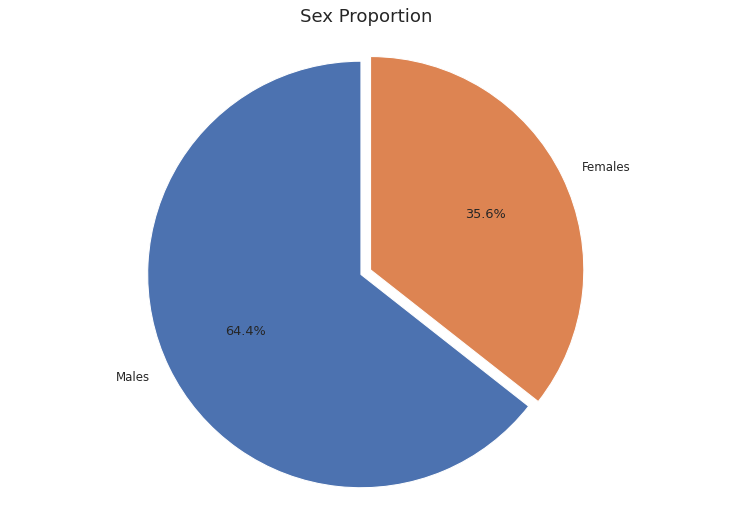

In [ ]:
male = (df['Sex'] == 'male').sum()
female = (df['Sex'] == 'female').sum()
proportions = [male, female]

plt.figure(figsize=(12,8), dpi=77)
plt.pie(proportions, data=df, labels = ['Males', 'Females'], explode = (0.05,0), startangle=90, autopct='%1.1f%%', shadow=False)
plt.axis('equal')
plt.title("Sex Proportion", size=17, pad=13)
plt.show()


 What do you undersend/find from the analysis above (section 2.3.2.1)? Write in your own words in this cell.

Write below:

The pie chart visualizes the sex proportion of the Titanic dataset. It shows that there were about 64.4% of males and about 35.6% of females on the ship.

We can see that the number of females were lower than the number of males on the ship. 

##### 2.3.2.2 Age comparision of the people who survived and those who died

In [ ]:
# How many people survived ('Survived' == 0)???
survived_data=df.Survived.value_counts().to_frame()
survived_data


,Survived
0,815
1,494


In [ ]:
pd.pivot_table(df, index="Survived", values=['Pclass','SibSp', 'Parch', 'Fare'])


,Fare,Parch,Pclass,SibSp
Survived,,,,
0,23.890678,0.311656,2.467485,0.496933
1,48.811497,0.506073,2.010121,0.502024


In [ ]:
# Amount and average age of people who survived compared to those who died.
df.groupby(['Survived']).Age.agg([len,min, max,'mean', 'median'])


,len,min,max,mean,median
Survived,,,,,
0,815,0.33,74.0,29.937926,28.0
1,494,0.17,80.0,28.785951,28.0


In [ ]:
fem_p1_s0 =df.loc[(df.Sex == 'female') & (df.Pclass == 1) & (df.SibSp == 0)].Age.median()
fem_p1_s1 =df.loc[(df.Sex == 'female') & (df.Pclass == 1) & (df.SibSp == 1)].Age.median()
fem_p1_s2 =df.loc[(df.Sex == 'female') & (df.Pclass == 1) & (df.SibSp == 2)].Age.median()
fem_p1_s3 =df.loc[(df.Sex == 'female') & (df.Pclass == 1) & (df.SibSp == 3)].Age.median()
fem_p2_s0 =df.loc[(df.Sex == 'female') & (df.Pclass == 2) & (df.SibSp == 0)].Age.median()
fem_p2_s1 =df.loc[(df.Sex == 'female') & (df.Pclass == 2) & (df.SibSp == 1)].Age.median()
fem_p2_s2 =df.loc[(df.Sex == 'female') & (df.Pclass == 2) & (df.SibSp == 2)].Age.median()
fem_p2_s3 =df.loc[(df.Sex == 'female') & (df.Pclass == 2) & (df.SibSp == 3)].Age.median()
fem_p3_s0 =df.loc[(df.Sex == 'female') & (df.Pclass == 3) & (df.SibSp == 0)].Age.median()
fem_p3_s1 =df.loc[(df.Sex == 'female') & (df.Pclass == 3) & (df.SibSp == 1)].Age.median()
fem_p3_s2 =df.loc[(df.Sex == 'female') & (df.Pclass == 3) & (df.SibSp == 2)].Age.median()
fem_p3_s3 =df.loc[(df.Sex == 'female') & (df.Pclass == 3) & (df.SibSp == 3)].Age.median()
fem_p3_s4 =df.loc[(df.Sex == 'female') & (df.Pclass == 3) & (df.SibSp == 4)].Age.median()
fem_p3_s5 =df.loc[(df.Sex == 'female') & (df.Pclass == 3) & (df.SibSp == 5)].Age.median()
fem_p3_s8 =df.loc[(df.Sex == 'female') & (df.Pclass == 3) & (df.SibSp == 8)].Age.median()
male_p1_s0 =df.loc[(df.Sex == 'male') & (df.Pclass == 1) & (df.SibSp == 0)].Age.median()
male_p1_s1 =df.loc[(df.Sex == 'male') & (df.Pclass == 1) & (df.SibSp == 1)].Age.median()
male_p1_s2 =df.loc[(df.Sex == 'male') & (df.Pclass == 1) & (df.SibSp == 2)].Age.median()
male_p1_s3 =df.loc[(df.Sex == 'male') & (df.Pclass == 1) & (df.SibSp == 3)].Age.median()
male_p2_s0 =df.loc[(df.Sex == 'male') & (df.Pclass == 2) & (df.SibSp == 0)].Age.median()
male_p2_s1 =df.loc[(df.Sex == 'male') & (df.Pclass == 2) & (df.SibSp == 1)].Age.median()
male_p2_s2 =df.loc[(df.Sex == 'male') & (df.Pclass == 2) & (df.SibSp == 2)].Age.median()
male_p3_s0 =df.loc[(df.Sex == 'male') & (df.Pclass == 3) & (df.SibSp == 0)].Age.median()
male_p3_s1 =df.loc[(df.Sex == 'male') & (df.Pclass == 3) & (df.SibSp == 1)].Age.median()
male_p3_s2 =df.loc[(df.Sex == 'male') & (df.Pclass == 3) & (df.SibSp == 2)].Age.median()
male_p3_s3 =df.loc[(df.Sex == 'male') & (df.Pclass == 3) & (df.SibSp == 3)].Age.median()
male_p3_s4 =df.loc[(df.Sex == 'male') & (df.Pclass == 3) & (df.SibSp == 4)].Age.median()
male_p3_s5 =df.loc[(df.Sex == 'male') & (df.Pclass == 3) & (df.SibSp == 5)].Age.median()
male_p3_s6 =df.loc[(df.Sex == 'male') & (df.Pclass == 3) & (df.SibSp == 6)].Age.median()
male_p3_s8 =df.loc[(df.Sex == 'male') & (df.Pclass == 3) & (df.SibSp == 8)].Age.median()

# Filling missing values with average age of women and men in each class
def myfunc(age, pclass, sex, SibSp):
    if pd.isnull(age) and pclass==1 and sex == 'female' and SibSp == 0:
        age=fem_p1_s0
    elif pd.isnull(age) and pclass==1 and sex == 'female' and SibSp == 1:
        age=fem_p1_s1
    elif pd.isnull(age) and pclass==1 and sex == 'female' and SibSp == 2:
        age=fem_p1_s2
    elif pd.isnull(age) and pclass==1 and sex == 'female' and SibSp == 3:
        age=fem_p1_s3
    elif pd.isnull(age) and pclass==2 and sex == 'female' and SibSp == 0:
        age=fem_p2_s0
    elif pd.isnull(age) and pclass==2 and sex == 'female' and SibSp == 1:
        age=fem_p2_s1
    elif pd.isnull(age) and pclass==2 and sex == 'female' and SibSp == 2:
        age=fem_p2_s2
    elif pd.isnull(age) and pclass==2 and sex == 'female' and SibSp == 3:
        age=fem_p2_s3
    elif pd.isnull(age) and pclass==3 and sex == 'female' and SibSp == 0:
        age=fem_p3_s0
    elif pd.isnull(age) and pclass==3 and sex == 'female' and SibSp == 1:
        age=fem_p3_s1
    elif pd.isnull(age) and pclass==3 and sex == 'female' and SibSp == 2:
        age=fem_p3_s2
    elif pd.isnull(age) and pclass==3 and sex == 'female' and SibSp == 3:
        age=fem_p3_s3
    elif pd.isnull(age) and pclass==3 and sex == 'female' and SibSp == 4:
        age=fem_p3_s4
    elif pd.isnull(age) and pclass==3 and sex == 'female' and SibSp == 5:
        age=fem_p3_s5
    elif pd.isnull(age) and pclass==3 and sex == 'female' and SibSp == 8:
        age=df.Age.median()
    elif pd.isnull(age) and pclass==1 and sex == 'male' and SibSp == 0:
        age=male_p1_s0
    elif pd.isnull(age) and pclass==1 and sex == 'male' and SibSp == 1:
        age=male_p1_s1
    elif pd.isnull(age) and pclass==1 and sex == 'male' and SibSp == 2:
        age=male_p1_s2
    elif pd.isnull(age) and pclass==1 and sex == 'male' and SibSp == 3:
        age=male_p1_s3
    elif pd.isnull(age) and pclass==2 and sex == 'male' and SibSp == 0:
        age=male_p2_s0
    elif pd.isnull(age) and pclass==2 and sex == 'male' and SibSp == 1:
        age=male_p2_s1
    elif pd.isnull(age) and pclass==2 and sex == 'male' and SibSp == 2:
        age=male_p2_s2
    elif pd.isnull(age) and pclass==3 and sex == 'male' and SibSp == 0:
        age=male_p3_s0
    elif pd.isnull(age) and pclass==3 and sex == 'male' and SibSp == 1:
        age=male_p3_s1
    elif pd.isnull(age) and pclass==3 and sex == 'male' and SibSp == 2:
        age=male_p3_s2
    elif pd.isnull(age) and pclass==3 and sex == 'male' and SibSp == 3:
        age=male_p3_s3
    elif pd.isnull(age) and pclass==3 and sex == 'male' and SibSp == 4:
        age=male_p3_s4
    elif pd.isnull(age) and pclass==3 and sex == 'male' and SibSp == 5:
        age=male_p3_s5
    elif pd.isnull(age) and pclass==3 and sex == 'male' and SibSp == 6:
        age=male_p3_s6
    elif pd.isnull(age) and pclass==3 and sex == 'male' and SibSp == 8:
        age=male_p3_s8
    else:
        age=age
    return age


In [ ]:
# Creating a new columns 'Age_Filled_Na' with the new average age values
df['Age_Filled'] = df.apply(lambda x: myfunc(x['Age'], x['Pclass'], x['Sex'], x['SibSp']), axis=1)


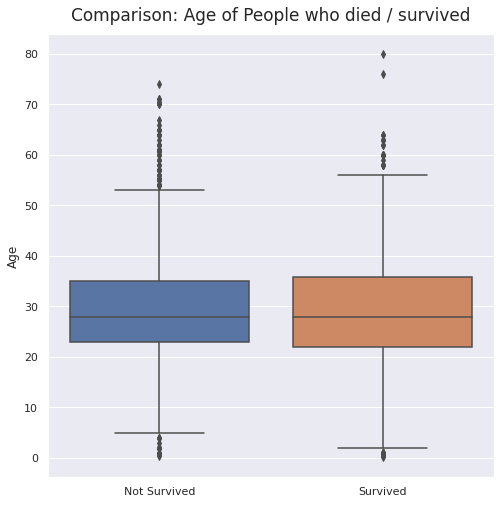

In [ ]:
# Age comparision of the people who survived and those who died using a boxplot.
plt.figure(figsize=(8,8), dpi=72)
sns.boxplot(x="Survived", y="Age_Filled", data=df)
plt.title("Comparison: Age of People who died / survived", size=17, pad=13)
plt.ylabel('Age')
plt.xlabel(' ')
plt.xticks([0, 1], ['Not Survived', 'Survived'])
plt.show()


 What do you undersend/find from the analysis above (section 2.3.2.2)? Write in your own words in this cell.

Write below:

- From the first table we can see that about 815 passengers did not survive and about 494 passengers survived in the Titanic disaster. 

- The second table with 'Fare', 'Parch', 'Pclass', 'Sibsp' shows the mean values of corresponding variable of survived and not survived.

- The third table shows the minimum, maximum, the mean and median age for survived and not survived. 

- This plot shows the comparison of the two groups and discover any differences or similarities in age between passengers who survived and those who did not. The median age of both the passenger's who survived and did not survived is 28. In the category of 'survived' travelers, there are extreme values (older passengers) but 'not survived' category has more outliers than 'survived' category.

Overall, the comparison shows that age may have had a significant impact on the Titanic disaster's survival rates. Older passengers were more likely to pass away, while younger passengers had a better chance of surviving.

##### 2.3.2.3 The barplot compares the survival 

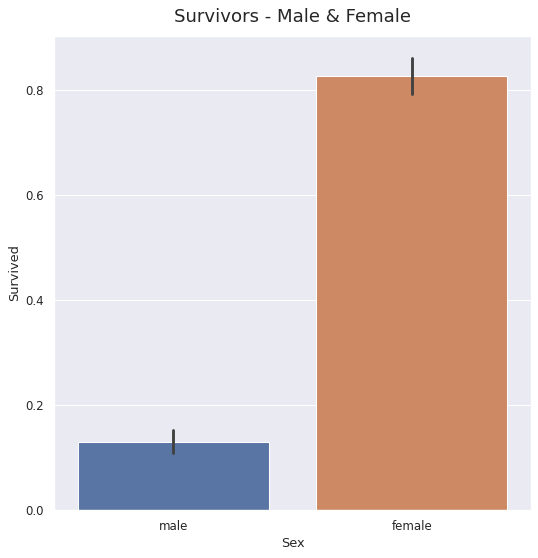

In [ ]:
plt.figure(figsize=(8,8), dpi=77)
sns.barplot(x="Sex", y="Survived", data=df)
plt.title("Survivors - Male & Female", size=17, pad=13 )
plt.show()


 What do you undersend/find from the analysis above (section 2.3.2.3)? Write in your own words in this cell.

Write below:

This bar plot shows comparison of the survival rates between male and female passengers on the Titanic dataset and identify any differences or similarities in survival rates on the basis of sex. According to the dataset, a lower percentage of male passengers survived the Titanic disaster compared to female passengers. About 82.62% of female passengers survived, on the other hand, only about 12.93% of male passengers survived. 

It shows that sex may have been an important factor in determining survival during the Titanic disaster.

##### 2.3.2.4 Comparison: Survivors - Male & Female

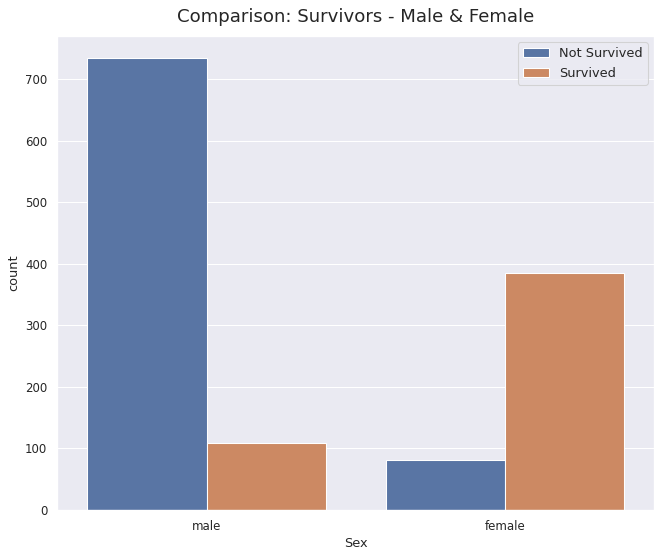

In [ ]:
plt.figure(figsize=(10,8), dpi=77)
sns.countplot(x=df['Sex'],hue=df['Survived'])
plt.title("Comparison: Survivors - Male & Female", size=17, pad= 13)
plt.legend(['Not Survived', 'Survived'], loc='upper right', prop={'size': 12})
plt.show()


 What do you undersend/find from the analysis above (section 2.3.2.4)? Write in your own words in this cell.

Write below:

In this Titanic dataset, there were 843 male passengers and 466 female passengers. Among the male passengers, 109 survived while among the female passengers, 385 survived. Percentage of women who survived is 82.62% which is more than the percentage of men who survived that is 12.93%

We can see from the plot that the majority of male passengers did not survive, while the majority of female passengers did survive. This reinforces the previous observation that sex was an important factor in determining survival during the Titanic disaster.

In [ ]:
# Find percentage of women who survived

women = df[df['Sex'] == 'female']
survived_women = women[women['Survived'] == 1]
percentage = len(survived_women) / len(women)
print(f'Percentage of women who survived: {percentage:.2%}')


Percentage of women who survived: 82.62%


In [ ]:
# Find percentage of men who survived

men = df[df['Sex'] == 'male']
survived_men = men[men['Survived'] == 1]
percentage = len(survived_men) / len(men)
print(f'Percentage of men who survived: {percentage:.2%}')


Percentage of men who survived: 12.93%


##### 2.3.2.5 Compares the chance of survival for each ticket class

In [ ]:
df['Pclass'].value_counts()


3    709
1    323
2    277
Name: Pclass, dtype: int64

In [ ]:
df.groupby(['Pclass', 'Survived']).Age.agg([len])


len
Pclass Survived     
1      0         137
       1         186
2      0         160
       1         117
3      0         518
       1         191

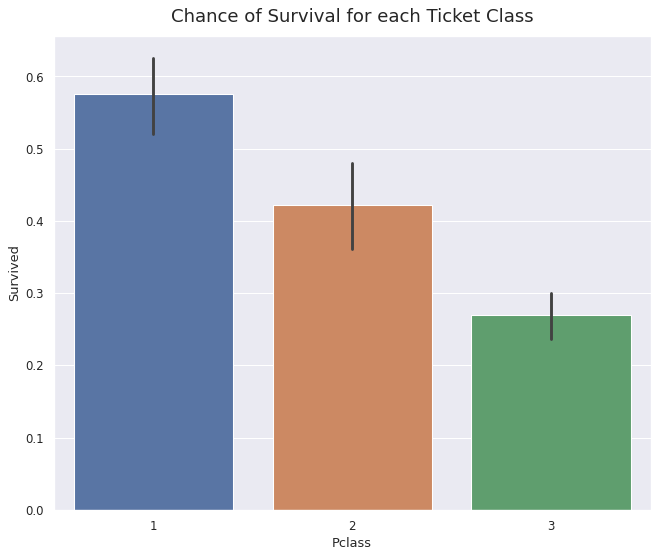

In [ ]:
plt.figure(figsize=(10,8), dpi=77)
sns.barplot(x="Pclass", y="Survived", data=df)
plt.title("Chance of Survival for each Ticket Class", size=17, pad=13)
plt.show()


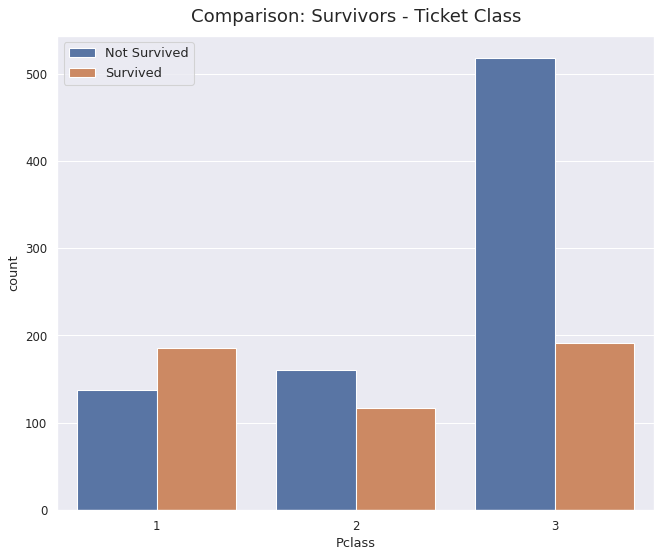

In [ ]:
# Survived and not survived compared for each ticket class
plt.figure(figsize=(10,8), dpi=77)
sns.countplot(x=df['Pclass'],hue=df['Survived'])
plt.title("Comparison: Survivors - Ticket Class", size=17, pad=13)
plt.legend(['Not Survived', 'Survived'], loc='upper left', prop={'size': 12})
plt.show()


 What do you undersend/find from the analysis above (section 2.3.2.5)? Write in your own words in this cell.

Write below:

The analysis compares the chance of survival for each ticket class. 

- From the first table, we can observe that the majority of the passengers were in third class (709), followed by first class (323) and then second class (277).

- From the second table, we can say that the first class passengers had a higher chance of survival compared to second and third class passengers.

- The first bar chart showed the percentage of survival based on their class which shows the previous analysis.

- The second bar chart represents the number of passengers who survived and did not survive on the Titanic based on their passenger class. Among the 323 first-class passengers, 186 survived, while 137 did not. Among the second-class passengers, 117 passengers survived and 160 passengers did not survived. Again, among the 709 third-class passengers, only 191 passengers survived, while 518 did not. 

We can conclude that first-class passengers had the highest survival rate, while third-class passengers had the lowest survival rate and second-class passengers fell in between.

##### 2.3.2.6 Chance of Survival for Passengers with Parents or Children

In [ ]:
# Amount and average age of women and man of each class who survived compared to those who died.
df.groupby(['Sex','Survived', 'Pclass']).Age.agg([len,min, max,'mean'])


len    min   max       mean
Sex    Survived Pclass                             
female 0        1         3   2.00  50.0  25.666667
                2         6  24.00  57.0  36.000000
                3        72   2.00  48.0  24.805556
       1        1       141  14.00  76.0  36.574468
                2       100   0.92  60.0  27.004200
                3       144   0.17  63.0  23.459514
male   0        1       134   6.00  71.0  40.220149
                2       154   2.00  70.0  32.055195
                3       446   0.33  74.0  26.893296
       1        1        45   0.92  80.0  35.331556
                2        17   0.67  62.0  17.431176
                3        47   0.42  45.0  23.370638

In [ ]:
df['Parch'].value_counts().to_frame()


,Parch
0,1002
1,170
2,113
3,8
5,6
4,6
6,2
9,2


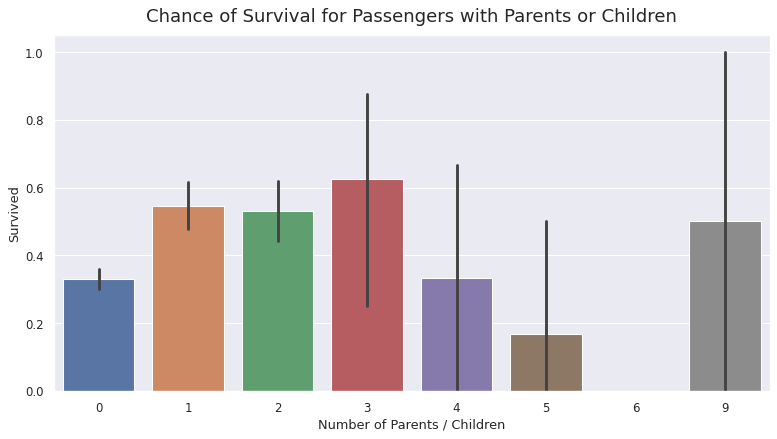

In [ ]:
plt.figure(figsize=(12,6), dpi=77)
sns.barplot(x="Parch", y="Survived", data=df)
plt.title("Chance of Survival for Passengers with Parents or Children", size=17, pad=13)
plt.xlabel('Number of Parents / Children')
plt.show()


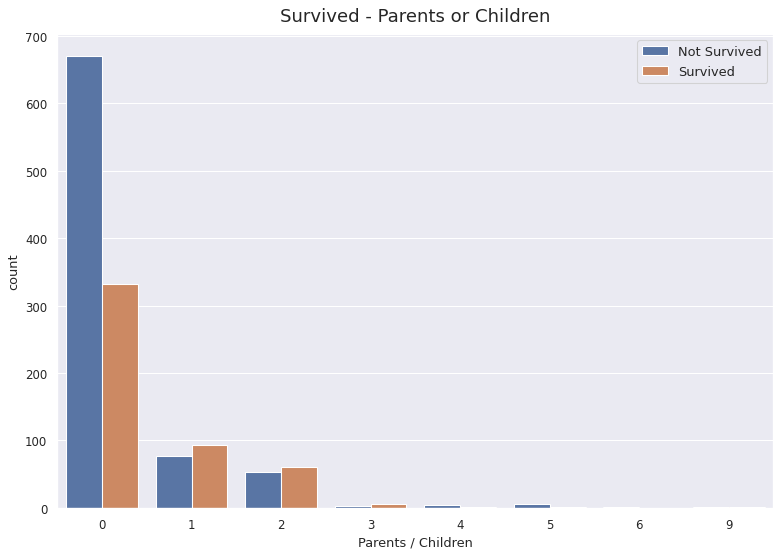

In [ ]:
plt.figure(figsize=(12,8), dpi=77)
sns.countplot(x=df['Parch'],hue=df['Survived'])
plt.title("Survived - Parents or Children", size=17, pad=12)
plt.legend(['Not Survived', 'Survived'], loc='upper right', prop={'size': 12})
plt.xlabel('Parents / Children')
plt.show()


In [ ]:
# Age of people with parents or children
df.groupby(['Parch','Survived']).Age.agg([len, min, max])


len    min   max
Parch Survived                  
0     0         670  11.00  74.0
      1         332   5.00  80.0
1     0          77   0.75  70.0
      1          93   0.42  64.0
2     0          53   0.33  58.0
      1          60   0.17  64.0
3     0           3  16.00  61.0
      1           5  24.00  54.0
4     0           4  29.00  64.0
      1           2  28.00  60.0
5     0           5  39.00  41.0
      1           1  38.00  38.0
6     0           2  40.00  43.0
9     0           1  28.00  28.0
      1           1  28.00  28.0

 What do you undersend/find from the analysis above (section 2.3.2.6)? Write in your own words in this cell.

Write below:

- The first table shows the amount and average age of women and man of each class who survived compared to those who died. For example, there were 3 female passengers who did not survive and belonged to the first passenger class with maximum age of 50, minimum age of 2 and mean age of 25.67.

- The second table shows the count of passengers by number of parents/children aboard and survival status. For example, there were 1002 passengers with no parents/children.

- From the bar plot, we can see that passengers with a small number of parents or children (0, 1, 2, 3) had a higher chance of survival than those with higher numbers (4, 5, 6).

- The third table data is describing the survival rates of passengers based on the number of parents or children (Parch) they were traveling with. We can see that individuals with no parents or children on board had the highest number of fatalities, with 670 not surviving out of a total of 1002 individuals in the dataset. Again, from passengers with parents or children with a number of 1 to 3 had a higher number of survived passengers than not surviving passengers. From passengers with parents or children with a number of 4 to 5 had a lower number of survived passengers than not survived passengers. The number is equal for Parch = 9.

##### 2.3.2.7 This barplot compares the chance of survival within a category

In [ ]:
df.SibSp.value_counts()


0    891
1    319
2     42
4     22
3     20
8      9
5      6
Name: SibSp, dtype: int64

In [ ]:
df.groupby(['SibSp','Survived']).Age.agg([len, 'mean'])


len       mean
SibSp Survived                
0     0         593  30.679865
      1         298  29.383389
1     0         153  32.789216
      1         166  28.744036
2     0          23  24.478261
      1          19  23.868421
3     0          15  15.666667
      1           5  27.600000
4     0          18   7.222222
      1           4  15.750000
5     0           5  10.200000
      1           1  10.000000
8     0           8  26.312500
      1           1  28.000000

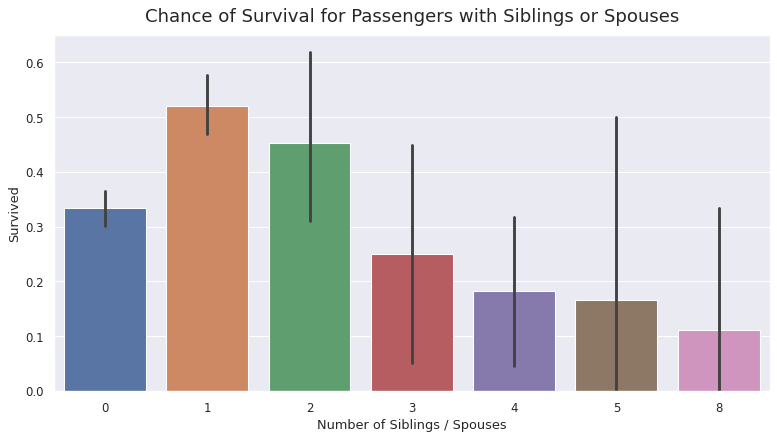

In [ ]:
# This barplot compares the chance of survival within a category
plt.figure(figsize=(12,6), dpi=77)
sns.barplot(x="SibSp", y="Survived", data=df)
plt.title("Chance of Survival for Passengers with Siblings or Spouses", size=17, pad=13)
plt.xlabel('Number of Siblings / Spouses')
plt.show()


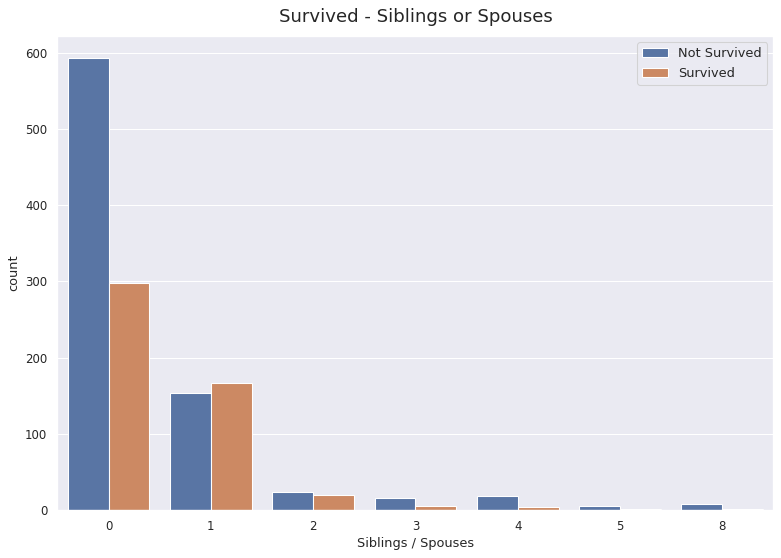

In [ ]:
plt.figure(figsize=(12,8), dpi=77)
sns.countplot(x=df['SibSp'],hue=df['Survived'])
plt.title("Survived - Siblings or Spouses", size=17, pad=13)
plt.xlabel('Siblings / Spouses')
plt.legend(['Not Survived', 'Survived'], loc='upper right', prop={'size': 12})
plt.show()


In [ ]:
df.groupby(['SibSp','Survived']).Age.agg([len, min, max, 'mean'])


len    min   max       mean
SibSp Survived                             
0     0         593   0.33  74.0  30.679865
      1         298   0.42  80.0  29.383389
1     0         153   0.75  70.0  32.789216
      1         166   0.17  76.0  28.744036
2     0          23   9.00  44.0  24.478261
      1          19   0.75  59.0  23.868421
3     0          15   2.00  31.0  15.666667
      1           5  23.00  33.0  27.600000
4     0          18   1.00  16.0   7.222222
      1           4   3.00  38.0  15.750000
5     0           5   1.00  16.0  10.200000
      1           1  10.00  10.0  10.000000
8     0           8  14.50  28.0  26.312500
      1           1  28.00  28.0  28.000000

 What do you undersend/find from the analysis above (section 2.3.2.7)? Write in your own words in this cell.

Write below:

The analysis shows the survival rate distribution of passengers on the basis of siblings or spouses they had onboard (SibSp).

- From the first table, the data shows the number of passengers by the number of siblings or spouses (SibSp) they had on board. Most passengers had no siblings/spouses with them.

- The second table shows the data of count, mean age of SibSp and survival category. For example, the number of passengers with no siblings or spouses who did not survived is 593 and had an average age of 30.679865.

- The first bar plot shows that passengers with one siblings or spouses had the highest survival rates. The passengers with two siblings or spouses is in the second. The passengers with more siblings or spouses (3, 4, 5, 8) had lower survival rates. The passengers with no siblings or spouses is in between them.

- From the next plot, we can say that the number of passengers who did not survived is higher for all siblings or spouses category except SibSp = 1. The number is much higher for the passengers with no siblings or spouses.

- Similarly, the last table shows the data of count, minimum, maximum and mean age for each category of SibSp and Survived.

From the analysis above, it appears that passengers with fewer siblings or spouses on board had a higher chance of survival than those who are traveling alone. However, the size of the groups and the varying age ranges and mean ages make it difficult to draw definitive conclusions about the relationship between SibSp and survival.

##### 2.3.2.8 Chance of Survival by Port of Embarkation

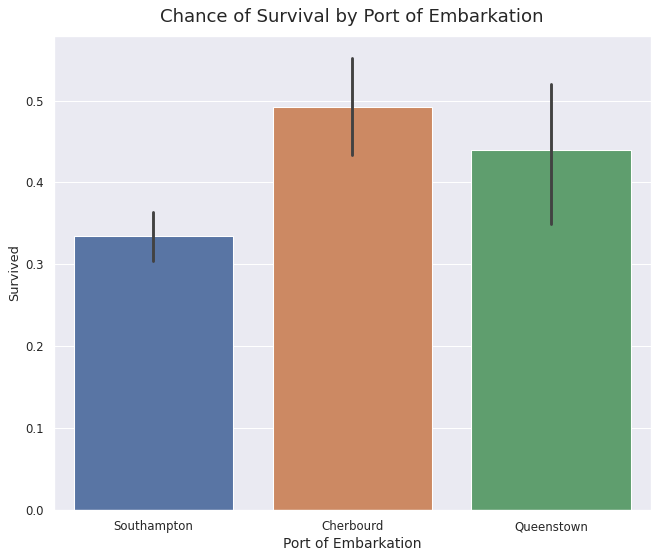

In [ ]:
plt.figure(figsize=(10,8), dpi=77)
sns.barplot(x="Embarked", y="Survived", data=df)
plt.title('Chance of Survival by Port of Embarkation', size=17, pad=13)
plt.xlabel('Port of Embarkation', size=13)
plt.xticks([0, 1, 2],['Southampton', 'Cherbourd', 'Queenstown'])
plt.show()


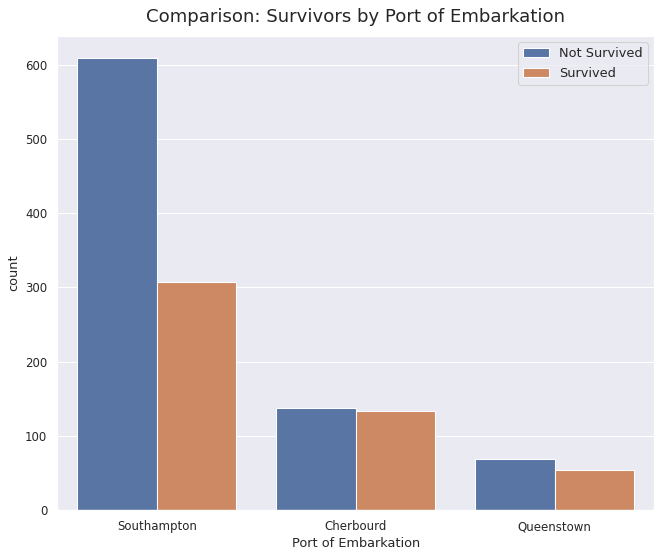

In [ ]:
plt.figure(figsize=(10,8), dpi=77)
sns.countplot(x=df['Embarked'],hue=df['Survived'])
plt.title("Comparison: Survivors by Port of Embarkation", size=17, pad=13)
plt.xlabel('Port of Embarkation')
plt.legend(['Not Survived', 'Survived'], loc='upper right', prop={'size': 12})
plt.xticks([0, 1, 2],['Southampton', 'Cherbourd', 'Queenstown'])
plt.show()


 What do you undersend/find from the analysis above (section 2.3.2.8)? Write in your own words in this cell.

Write below:

These plots suggest that the port of embarkation may have had some impact on the chance of survival. Passengers who embarked from Cherbourd having a higher chance of survival compared to those who embarked from Southampton or Queenstown. The embarkation from Southampton had the lowest survival rates despite the fact that the most passengers embarked from the Southampton. However, it is important to note that other factors such as ticket class, age, and gender also have played a role in determining survival rates.

##### 2.3.2.9 Average Age of Passengers with Siblings and  Parents or Children

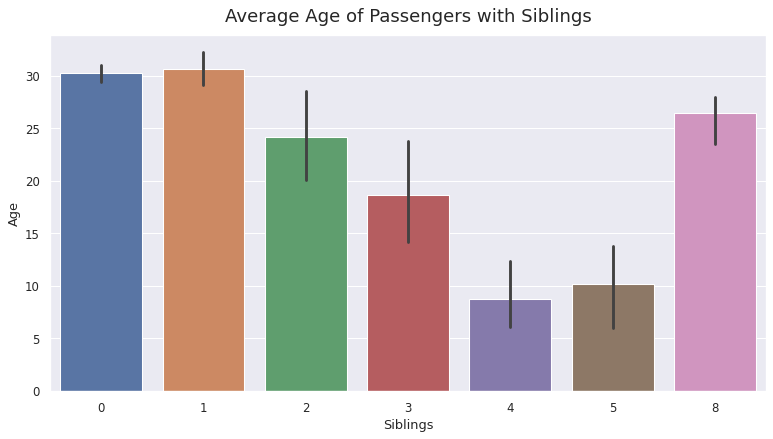

In [ ]:
plt.figure(figsize=(12,6), dpi=77)
sns.barplot(x="SibSp", y="Age", data=df)
plt.title('Average Age of Passengers with Siblings', size=17, pad=13)
plt.xlabel('Siblings')
plt.show()


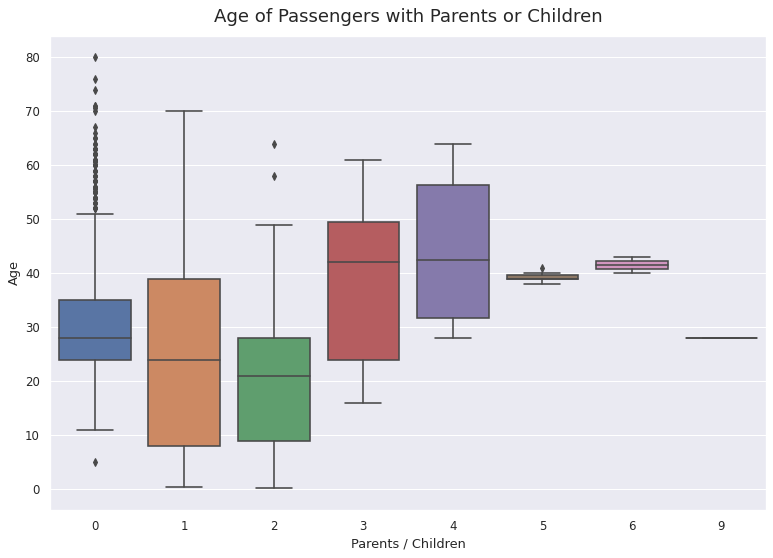

In [ ]:
plt.figure(figsize=(12,8), dpi=77)
sns.boxplot(x="Parch", y="Age", data=df)
plt.title('Age of Passengers with Parents or Children', size=17, pad=13)
plt.xlabel('Parents / Children')
plt.show()


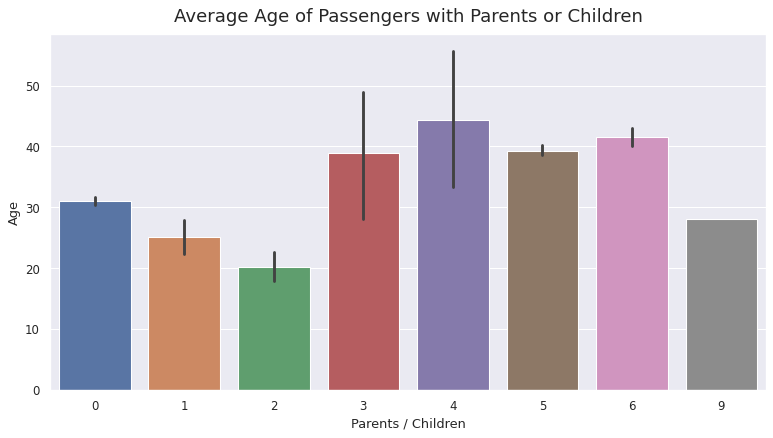

In [ ]:
plt.figure(figsize=(12,6), dpi=77)
sns.barplot(x="Parch", y="Age", data=df)
plt.title('Average Age of Passengers with Parents or Children', size=17, pad=12)
plt.xlabel('Parents / Children')
plt.show()


 What do you undersend/find from the analysis above (section 2.3.2.9)? Write in your own words in this cell.

Write below:

The analysis shows the average age of passengers with siblings and parents or children. 

- For the average age of passengers with a number of siblings, siblings of a number of 0 and 1 had higher average age which is equal to 30 and greater than 30 respectively. On the other hand, siblings of a number of 4 had the lowest average age which is below 10 and the family of 5 siblings had an average age of 10. Siblings with a number of 2, 3, 8 fell in between.

- The boxplots of each category of parents or children shows that passengers with 0 parents or children had more extreme values. The median age is higher for the category of passengers with 3 and 4 parents and children. It shows the relationship between the number of parents or children onboard and the age of the passengers.

- For the average age of passengers with a number of parents or children, the average is higher for parents or children with a number of 4 which is near 45 and the lowest for parents or children with a number of 2 which is 20. 

##### 2.3.2.10 Age of Passengers for each Ticket Class

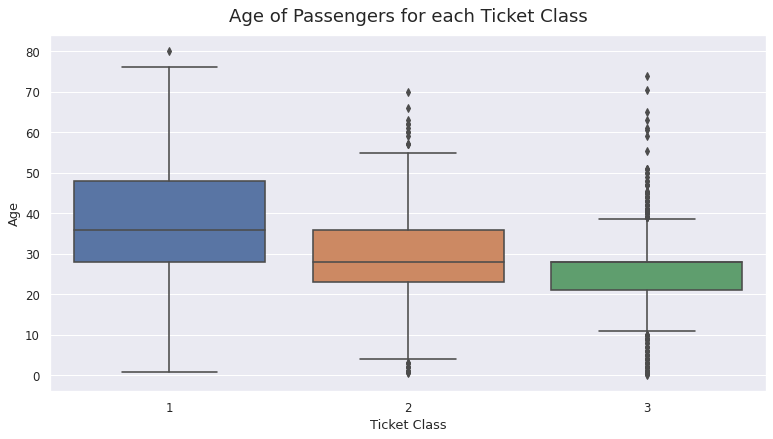

In [ ]:
plt.figure(figsize=(12,6), dpi=77)
sns.boxplot(x="Pclass", y="Age", data=df)
plt.title('Age of Passengers for each Ticket Class', size=17, pad=13)
plt.xlabel('Ticket Class')
plt.show()


 What do you undersend/find from the analysis above (section 2.3.2.10)? Write in your own words in this cell.

Write below:

We can observe from the plot that there is some variation in the age distribution across different ticket classes. Passengers in first class tend to be older, while passengers in second and third class tend to be younger. Additionally, there are some outliers in each ticket class especially 2nd and 3d class indicating that there were some passengers who were much older or younger. 3rd class passengers had the most outliers and they are mostly the younger passengers among the other classes.

##### 2.3.2.11 Comparing multiple columns

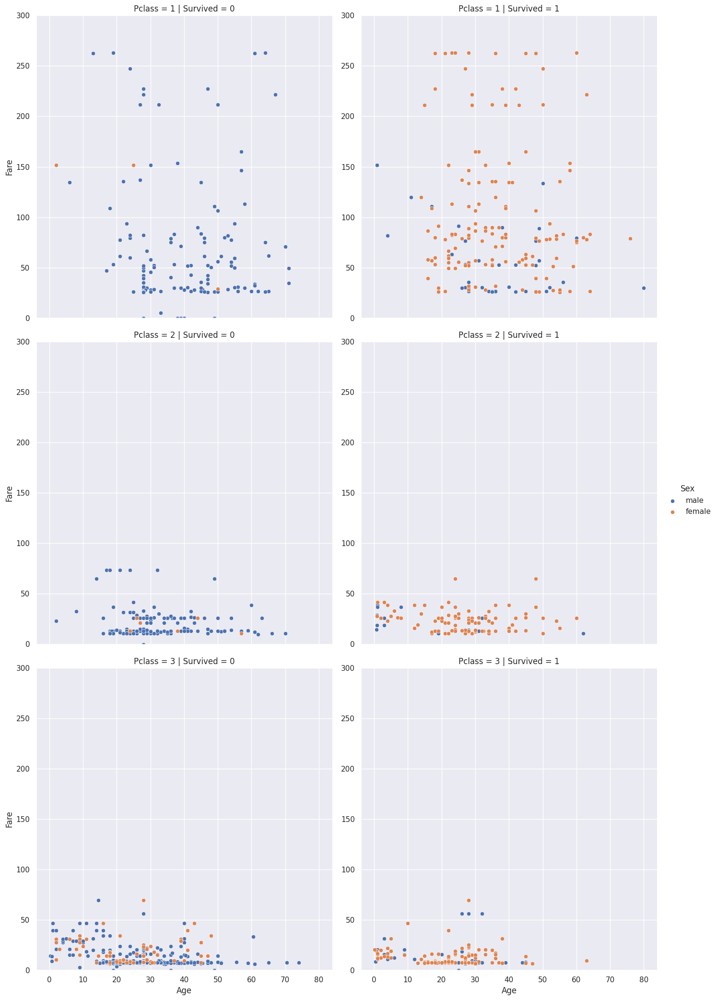

In [ ]:
# Comparison of Pclass, Age, Sex and Survivors
g = sns.FacetGrid(df, col='Survived', row='Pclass', sharey=False, ylim=(0,300), hue='Sex', height=7)
g.map_dataframe(sns.scatterplot, x='Age', y='Fare')
g.set_axis_labels('Age', 'Fare')
g.add_legend()
# g.set_titles(col_template='', row_template='')
plt.show()


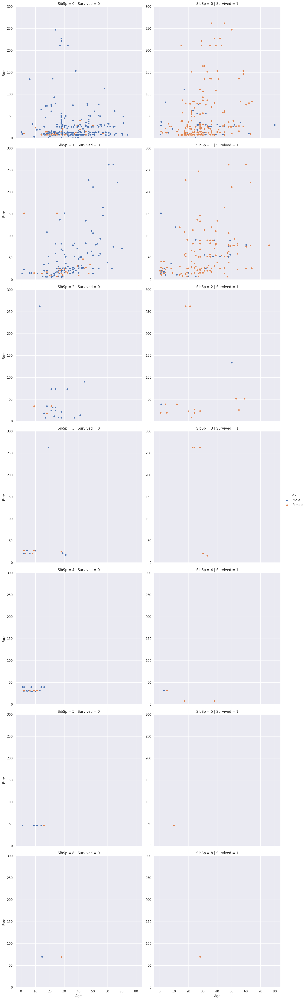

In [ ]:
# Comparison of Parch, Age, Sex and Survivors
g = sns.FacetGrid(df, col='Survived', row='SibSp', sharey=False, ylim=(0,300), hue='Sex', height=7)
g.map_dataframe(sns.scatterplot, x='Age', y='Fare')
g.set_axis_labels('Age', 'Fare')
g.add_legend()
# g.set_titles(col_template='', row_template='')
plt.show()


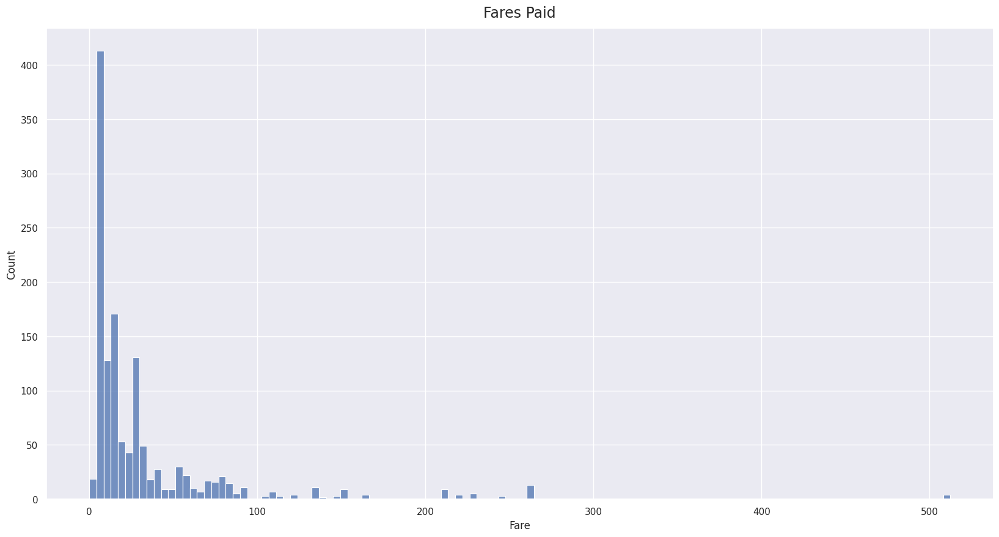

In [ ]:
plt.figure(figsize=(20,10))
sns.histplot(df.Fare)
plt.title('Fares Paid', size=17, pad=13)
plt.show()


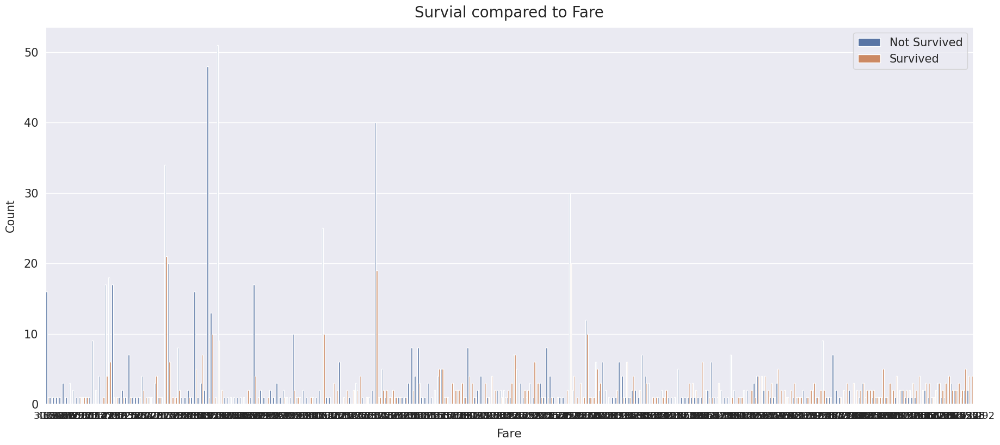

In [ ]:
fig, axs = plt.subplots(figsize=(22, 9))
sns.countplot(x='Fare', hue='Survived', data=df)
plt.xlabel('Fare', size=16, labelpad=10)
plt.ylabel('Count', size=15, labelpad=10)
plt.tick_params(axis='x', labelsize=13)
plt.tick_params(axis='y', labelsize=15)
plt.legend(['Not Survived', 'Survived'], loc='upper right', prop={'size': 15})
plt.title('Survial compared to Fare', size=20, y=1, pad=13)
plt.show()


 What do you undersend/find from the analysis above (section 2.3.2.11)? Write in your own words in this cell.

Write below:

- The scatter plots visualizes the relationship between age and fare paid for passenger class and survival outcome differentiated by gender. In the scatter plot of age against fare, the survival rate was higher for women than for men and the number of men is greater than women who did not survived in each class. Also female survivors tended to pay higher fares than male survivors, especially in the first class and older passengers tended to pay higher fares. Most passengers paid low fares in the third passenger class. The scatter plot shows that there were more male passengers than female passengers in the third class. The survival rate was higher in passenger class 1 and lower in passenger class 3.

- The next scatter plot compares the age and fare of passengers for sibling or spouse and survival outcome differentiated by gender. From the plot, we can say that passengers with a larger number of sibling or spouse count tended to pay lower fares than either zero or lower number of sibling or spouse. In the non-survivors category, male with either no or one sibling or spouse tended to pay higher fare. 

- The plot shows a histogram of the fares paid by passengers. The plot is right skewed and the majority of passengers paid a lower fare. This shows a significant difference in social class among the passengers on the Titanic.

- The last plot shows the count of survival category based on the fare paid. We can say that a higher number of passengers who paid a higher fare survived compared to those who paid a lower fare.

## 3. Data Preprocessing

Explain your data preprocessing steps including filling null values, dropping duplicates, encoding, dimensionality reduction etc. whichever is applicable. Appropriate data preprocessing can hugely impact your model’s performance.

For encoding categorical variables you can use pandas (get_dummies).

Convert categorical variable into dummy/indicator variables.

Learn More:


https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.get_dummies.html

**Examples**


In [ ]:
train_data


,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S
...,...,...,...,...,...,...,...,...,...,...,...,...
886,887,0,2,"Montvila, Rev. Juozas",male,27.0,0,0,211536,13.0000,NaN,S
887,888,1,1,"Graham, Miss. Margaret Edith",female,19.0,0,0,112053,30.0000,B42,S
888,889,0,3,"Johnston, Miss. Catherine Helen ""Carrie""",female,NaN,1,2,W./C. 6607,23.4500,NaN,S
889,890,1,1,"Behr, Mr. Karl Howell",male,26.0,0,0,111369,30.0000,C148,C


In [ ]:
train1 = train_data.copy()

train1.drop(columns=['PassengerId','Name','Ticket','Cabin'],inplace=True)

train1.head()


,Survived,Pclass,Sex,Age,SibSp,Parch,Fare,Embarked
0,0,3,male,22.0,1,0,7.2500,S
1,1,1,female,38.0,1,0,71.2833,C
2,1,3,female,26.0,0,0,7.9250,S
3,1,1,female,35.0,1,0,53.1000,S
4,0,3,male,35.0,0,0,8.0500,S


In [ ]:
data1 = train1.copy()

data1 = pd.get_dummies(data1)

data1.head()


,Survived,Pclass,Age,SibSp,Parch,Fare,Sex_female,Sex_male,Embarked_C,Embarked_Q,Embarked_S
0,0,3,22.0,1,0,7.2500,0,1,0,0,1
1,1,1,38.0,1,0,71.2833,1,0,1,0,0
2,1,3,26.0,0,0,7.9250,1,0,0,0,1
3,1,1,35.0,1,0,53.1000,1,0,0,0,1
4,0,3,35.0,0,0,8.0500,0,1,0,0,1


**Now use the given dataset and perform the data preprocessing steps:**

In [ ]:
# Code Here (Add as many cells as you need)
print(*data1.columns, sep = ', ')


Survived, Pclass, Age, SibSp, Parch, Fare, Sex_female, Sex_male, Embarked_C, Embarked_Q, Embarked_S


In [ ]:
data1.info()

print('\nOverview about Columns:')
print(data1.describe().transpose())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 11 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Survived    891 non-null    int64  
 1   Pclass      891 non-null    int64  
 2   Age         714 non-null    float64
 3   SibSp       891 non-null    int64  
 4   Parch       891 non-null    int64  
 5   Fare        891 non-null    float64
 6   Sex_female  891 non-null    uint8  
 7   Sex_male    891 non-null    uint8  
 8   Embarked_C  891 non-null    uint8  
 9   Embarked_Q  891 non-null    uint8  
 10  Embarked_S  891 non-null    uint8  
dtypes: float64(2), int64(4), uint8(5)
memory usage: 46.2 KB

Overview about Columns:
            count       mean        std   min      25%      50%   75%  \
Survived    891.0   0.383838   0.486592  0.00   0.0000   0.0000   1.0   
Pclass      891.0   2.308642   0.836071  1.00   2.0000   3.0000   3.0   
Age         714.0  29.699118  14.526497  0.42  20.1250  2

In [ ]:
r, c = data1.shape
print(f'Rows: {r}')
print(f'Columns: {c}')


Rows: 891
Columns: 11


In [ ]:
print(f'Total cells: {r * c}')


Total cells: 9801


In [ ]:
dup = data1[data1.duplicated()]
print(f'Number of duplicates: {dup.shape[0]}')


Number of duplicates: 111


In [ ]:
data1.drop_duplicates(inplace = True)
data1


,Survived,Pclass,Age,SibSp,Parch,Fare,Sex_female,Sex_male,Embarked_C,Embarked_Q,Embarked_S
0,0,3,22.0,1,0,7.2500,0,1,0,0,1
1,1,1,38.0,1,0,71.2833,1,0,1,0,0
2,1,3,26.0,0,0,7.9250,1,0,0,0,1
3,1,1,35.0,1,0,53.1000,1,0,0,0,1
4,0,3,35.0,0,0,8.0500,0,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...
885,0,3,39.0,0,5,29.1250,1,0,0,1,0
887,1,1,19.0,0,0,30.0000,1,0,0,0,1
888,0,3,NaN,1,2,23.4500,1,0,0,0,1
889,1,1,26.0,0,0,30.0000,0,1,1,0,0


In [ ]:
missing_vals = data1.isna().sum()
print(missing_vals.loc[missing_vals > 0])


Age    104
dtype: int64


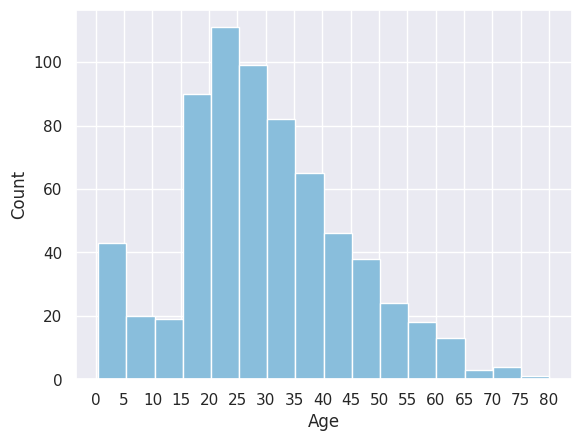

In [ ]:
plt.hist(data1['Age'], bins = 16, color = colors[2])
plt.xlabel('Age')
plt.ylabel('Count')
plt.xticks(np.arange(0, 85, 5))
plt.show()


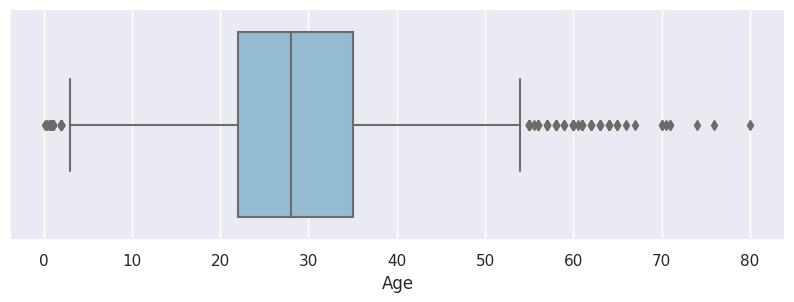

In [ ]:
plt.figure(figsize = (10, 3))
sns.boxplot(x = df['Age'], color = colors[2])
plt.xlabel('Age')
plt.show()


In [ ]:
age_med = data1['Age'].median()
data1['Age'].fillna(age_med, inplace = True)

data1['Age'].isna().sum()


0

In [ ]:
# Creating a new column 'Family_size' by adding 'SibSp' and 'Parch' columns
data1['Family_size'] = data1['SibSp'] + data1['Parch'] + 1
data1.head()


,Survived,Pclass,Age,SibSp,Parch,Fare,Sex_female,Sex_male,Embarked_C,Embarked_Q,Embarked_S,Family_size
0,0,3,22.0,1,0,7.2500,0,1,0,0,1,2
1,1,1,38.0,1,0,71.2833,1,0,1,0,0,2
2,1,3,26.0,0,0,7.9250,1,0,0,0,1,1
3,1,1,35.0,1,0,53.1000,1,0,0,0,1,2
4,0,3,35.0,0,0,8.0500,0,1,0,0,1,1


In [ ]:
# Creating a new column 'Alone' indicating whether the passenger is alone or not
data1['Alone'] = 0
data1.loc[data1['Family_size'] == 1, 'Alone'] = 1
data1.head()


,Survived,Pclass,Age,SibSp,Parch,Fare,Sex_female,Sex_male,Embarked_C,Embarked_Q,Embarked_S,Family_size,Alone
0,0,3,22.0,1,0,7.2500,0,1,0,0,1,2,0
1,1,1,38.0,1,0,71.2833,1,0,1,0,0,2,0
2,1,3,26.0,0,0,7.9250,1,0,0,0,1,1,1
3,1,1,35.0,1,0,53.1000,1,0,0,0,1,2,0
4,0,3,35.0,0,0,8.0500,0,1,0,0,1,1,1


In [ ]:
# Dropping 'SibSp' and 'Parch' columns
data1 = data1.drop(['SibSp', 'Parch'], axis = 1)
data1.head()


,Survived,Pclass,Age,Fare,Sex_female,Sex_male,Embarked_C,Embarked_Q,Embarked_S,Family_size,Alone
0,0,3,22.0,7.2500,0,1,0,0,1,2,0
1,1,1,38.0,71.2833,1,0,1,0,0,2,0
2,1,3,26.0,7.9250,1,0,0,0,1,1,1
3,1,1,35.0,53.1000,1,0,0,0,1,2,0
4,0,3,35.0,8.0500,0,1,0,0,1,1,1


In [ ]:
data1['Age'] = data1['Age'].astype('int')


In [ ]:
# Scaling the 'Age' and 'Fare' columns using StandardScaler
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
data1[['Age', 'Fare']] = scaler.fit_transform(data1[['Age', 'Fare']])
data1


,Survived,Pclass,Age,Fare,Sex_female,Sex_male,Embarked_C,Embarked_Q,Embarked_S,Family_size,Alone
0,0,3,-0.550518,-0.528033,0,1,0,0,1,2,0
1,1,1,0.615549,0.697956,1,0,1,0,0,2,0
2,1,3,-0.259001,-0.515109,1,0,0,0,1,1,1
3,1,1,0.396911,0.349817,1,0,0,0,1,2,0
4,0,3,0.396911,-0.512716,0,1,0,0,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...
885,0,3,0.688428,-0.109211,1,0,0,1,0,6,0
887,1,1,-0.769155,-0.092459,1,0,0,0,1,1,1
888,0,3,-0.113243,-0.217866,1,0,0,0,1,4,0
889,1,1,-0.259001,-0.092459,0,1,1,0,0,1,1


In [ ]:
"""
This code computes the correlation matrix of a DataFrame data1.
The cmap parameter specifies the color map to use
axis=None means that the gradient will be applied to the entire DataFrame.
The set_precision method sets the number to 2 decimal places to use for displaying the correlation values in the output.
"""

corr_matrix = data1.corr()
corr_matrix.style.background_gradient(cmap = 'coolwarm', axis = None).set_precision(2)


<ipython-input-79-4b70ac93e4bd>:9: FutureWarning: this method is deprecated in favour of `Styler.format(precision=..)`
  corr_matrix.style.background_gradient(cmap = 'coolwarm', axis = None).set_precision(2)


,Survived,Pclass,Age,Fare,Sex_female,Sex_male,Embarked_C,Embarked_Q,Embarked_S,Family_size,Alone
Survived,1.00,-0.34,-0.08,0.25,0.51,-0.51,0.17,-0.04,-0.14,0.01,-0.18
Pclass,-0.34,1.00,-0.34,-0.55,-0.12,0.12,-0.25,0.21,0.11,0.08,0.11
Age,-0.08,-0.34,1.00,0.09,-0.09,0.09,0.04,-0.03,-0.02,-0.28,0.19
Fare,0.25,-0.55,0.09,1.00,0.17,-0.17,0.28,-0.11,-0.19,0.19,-0.25
Sex_female,0.51,-0.12,-0.09,0.17,1.00,-1.00,0.09,0.04,-0.11,0.19,-0.28
Sex_male,-0.51,0.12,0.09,-0.17,-1.00,1.00,-0.09,-0.04,0.11,-0.19,0.28
Embarked_C,0.17,-0.25,0.04,0.28,0.09,-0.09,1.00,-0.14,-0.81,-0.05,-0.09
Embarked_Q,-0.04,0.21,-0.03,-0.11,0.04,-0.04,-0.14,1.00,-0.46,-0.04,0.08
Embarked_S,-0.14,0.11,-0.02,-0.19,-0.11,0.11,-0.81,-0.46,1.00,0.07,0.03
Family_size,0.01,0.08,-0.28,0.19,0.19,-0.19,-0.05,-0.04,0.07,1.00,-0.71


### **Write Here**

 What do you undersend/find from the analysis above (section 3)? Write in your own words in this cell.


In this section, we see necessary dataset info for data preprocessing. There are 111 total duplicates and 104 missing values in 'AGE' column. First, we drop the duplicates and replace the missing values in the 'Age' column with median. 

For the purpose of preparing the dataset for machine learning, we add two new columns 'Family_size' and 'Alone' to extract more information and improve the performance. One is added with 'SibSp' and 'Parch' which is the total number of family members and another column represents if a passenger is alone or not. Now we drop the 'SibSp' and 'Parch'.

We scale the Age and Fare columns using StandardScaler. Scaling is used for standardize the range of features or variables in the dataset to a common scale, which makes it easier for certain machine learning algorithms to operate on the data. 

Then we find the correlation between the colmuns. The higest positive correlation is in between Survived and Sex_female with a number of 0.51. This suggests that there is a moderate positive relationship between female and survival outcome in the Titanic disaster.

## 4.	Machine Learning Models



1.   Develop machine learning models. 
2.   You may try changing different parameters to obtain better training 
accuracy.
3. At least two models (with different parameters)



Provide a brief description of the machine learning models you used. (Provide a detailed description of their parameter)

Don’t copy-paste directly from the Internet! Write in your own words.

### 4.1 Use Logistic regression to build your ML model for the Titanic dataset.

At least two models (with different parameters). Hints: use the default parameters for one model and tuned-up (intuitively) parameter for improving accuracy.


### Logistic regression

In [ ]:
# Code Here (Add as many cells as you need)
# Splitting the data into features (X) and target (y)
X_tnc = data1.drop('Survived', axis = 1)
y_tnc = data1['Survived']


In [ ]:
from sklearn.model_selection import train_test_split

X_train_tnc, X_test_tnc, y_train_tnc, y_test_tnc = train_test_split(X_tnc, y_tnc, test_size = 0.25, random_state = 1)


In [ ]:
# Fitting the dataset into Logistic Regression Model
from sklearn.linear_model import LogisticRegression

model1_tnc = LogisticRegression()
model1_tnc.fit(X_train_tnc, y_train_tnc)


LogisticRegression()

In [ ]:
# Showing coefficient and intercept
print(model1_tnc.coef_)
print(model1_tnc.intercept_)


[[-0.9261243  -0.41859681  0.00347588  1.15155728 -1.15132836  0.16993517
  -0.04535715 -0.3232008  -0.31906666 -0.52064698]]
[2.99316848]


In [ ]:
# Showing model predicted probabilities
y_prob1_tnc = model1_tnc.predict_proba(X_test_tnc)
y_prob1_tnc


array([[0.61817321, 0.38182679],
       [0.54986292, 0.45013708],
       [0.09064266, 0.90935734],
       [0.81185123, 0.18814877],
       [0.53546877, 0.46453123],
       [0.68752442, 0.31247558],
       [0.07332625, 0.92667375],
       [0.8314821 , 0.1685179 ],
       [0.18608701, 0.81391299],
       [0.29636443, 0.70363557],
       [0.11409502, 0.88590498],
       [0.90614401, 0.09385599],
       [0.06229781, 0.93770219],
       [0.46069986, 0.53930014],
       [0.48978083, 0.51021917],
       [0.2358599 , 0.7641401 ],
       [0.32253625, 0.67746375],
       [0.84392703, 0.15607297],
       [0.36812014, 0.63187986],
       [0.93298746, 0.06701254],
       [0.44521665, 0.55478335],
       [0.92874042, 0.07125958],
       [0.88322484, 0.11677516],
       [0.8923382 , 0.1076618 ],
       [0.64351772, 0.35648228],
       [0.90197391, 0.09802609],
       [0.9402262 , 0.0597738 ],
       [0.08491769, 0.91508231],
       [0.76971325, 0.23028675],
       [0.52213386, 0.47786614],
       [0.

In [ ]:
# Showing model predicted value
y_pred1_tnc = model1_tnc.predict(X_test_tnc)
y_pred1_tnc


array([0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1,
       0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0,
       0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0,
       1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0,
       0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0,
       1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0,
       0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1,
       1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0])

### Logistic regression with different parameters

In [ ]:
# Fitting the dataset into Logistic Regression Model with different parameters
model2_tnc = LogisticRegression(C = 0.1)
model2_tnc.fit(X_train_tnc, y_train_tnc)


LogisticRegression(C=0.1)

In [ ]:
# Showing coefficient and intercept
print(model2_tnc.coef_)
print(model2_tnc.intercept_)


[[-0.72789983 -0.32216388  0.07766201  0.94450495 -0.94436151  0.18671028
   0.00702865 -0.21875355 -0.23522299 -0.34467907]]
[2.1783115]


In [ ]:
# Showing model predicted probabilities
y_prob2_tnc = model2_tnc.predict_proba(X_test_tnc)
y_prob2_tnc


array([[0.63337475, 0.36662525],
       [0.56544811, 0.43455189],
       [0.14582464, 0.85417536],
       [0.77823669, 0.22176331],
       [0.53831458, 0.46168542],
       [0.66685369, 0.33314631],
       [0.1166946 , 0.8833054 ],
       [0.78821937, 0.21178063],
       [0.21396488, 0.78603512],
       [0.35534292, 0.64465708],
       [0.17826907, 0.82173093],
       [0.87185598, 0.12814402],
       [0.10030233, 0.89969767],
       [0.48340675, 0.51659325],
       [0.51013086, 0.48986914],
       [0.29475813, 0.70524187],
       [0.36787063, 0.63212937],
       [0.81305624, 0.18694376],
       [0.40922333, 0.59077667],
       [0.90016255, 0.09983745],
       [0.49003647, 0.50996353],
       [0.89786524, 0.10213476],
       [0.84921931, 0.15078069],
       [0.85801841, 0.14198159],
       [0.63803485, 0.36196515],
       [0.86470333, 0.13529667],
       [0.90831557, 0.09168443],
       [0.13742135, 0.86257865],
       [0.7378184 , 0.2621816 ],
       [0.54774702, 0.45225298],
       [0.

In [ ]:
# Showing model predicted value
y_pred2_tnc = model2_tnc.predict(X_test_tnc)
y_pred2_tnc


array([0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1,
       0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0,
       0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0,
       0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0,
       1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 0,
       0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1,
       1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0])

### **Write Here**

What do you undersend this above (section 4.1)? Write in your own words in this cell.

In the Titanic dataset, logistic regression is used to predict whether a passenger survived or not based on the other variables.

Overall, this section train and evaluate two logistic regression models with different hyperparameter settings and compute their predicted class probabilities and labels for a test set.

### 4.2 First analyse the 'Advertising dataset' as like you have observed in Titanic dataset. Then, use Linear Regression to build your ML model for the Advertising dataset. 

At least two models (with different parameters). Hints: use the default parameters for one model and tuned-up (intuitively) parameter for improving accuracy. 


### Data Preprocessing

In [ ]:
# Code Here (Add as many cells as you need)
# Loading data
adv = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/advertising.csv")
adv.head()


,TV,Radio,Newspaper,Sales
0,230.1,37.8,69.2,22.1
1,44.5,39.3,45.1,10.4
2,17.2,45.9,69.3,12.0
3,151.5,41.3,58.5,16.5
4,180.8,10.8,58.4,17.9


In [ ]:
# All column names
print(*adv.columns, sep = ', ')


TV, Radio, Newspaper, Sales


In [ ]:
#  Overview about Columns, Range, Non-Null Value Counts, Memory Usage and Data Types (#df.dtpyes)
adv.info()

print('\nOverview about Columns:')
print(adv.describe().transpose())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200 entries, 0 to 199
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   TV         200 non-null    float64
 1   Radio      200 non-null    float64
 2   Newspaper  200 non-null    float64
 3   Sales      200 non-null    float64
dtypes: float64(4)
memory usage: 6.4 KB

Overview about Columns:
           count      mean        std  min     25%     50%      75%    max
TV         200.0  147.0425  85.854236  0.7  74.375  149.75  218.825  296.4
Radio      200.0   23.2640  14.846809  0.0   9.975   22.90   36.525   49.6
Newspaper  200.0   30.5540  21.778621  0.3  12.750   25.75   45.100  114.0
Sales      200.0   15.1305   5.283892  1.6  11.000   16.00   19.050   27.0


In [ ]:
# Total rows, columns and cells in the dataset
rows, cols = adv.shape
print(f'Rows: {rows}')
print(f'Columns: {cols}')
print(f'Total cells: {rows * cols}')


Rows: 200
Columns: 4
Total cells: 800


In [ ]:
# Looking for duplicates
duplicates = adv[adv.duplicated()]
print(f'Number of duplicates: {duplicates.shape[0]}')


Number of duplicates: 0


In [ ]:
# Showing the number of missing values
missing_values = adv.isna().sum()
missing_values


TV           0
Radio        0
Newspaper    0
Sales        0
dtype: int64

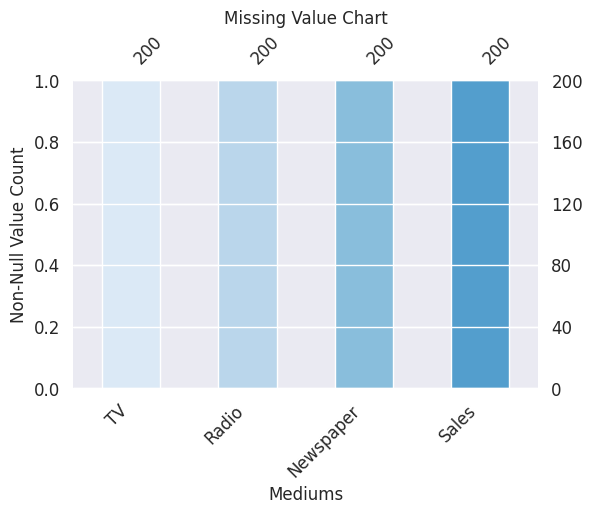

In [ ]:
# Creating a bar plot for visualizing missing values
fig, ax = plt.subplots(figsize=(6, 4))
msno.bar(adv, ax = ax, fontsize = 12, color = colors)
ax.set_xlabel('Mediums', fontsize = 12)
ax.set_ylabel('Non-Null Value Count', fontsize = 12)
ax.set_title('Missing Value Chart', fontsize = 12)
ax.set_xticklabels(adv.columns)
plt.show()


### Data Analysis

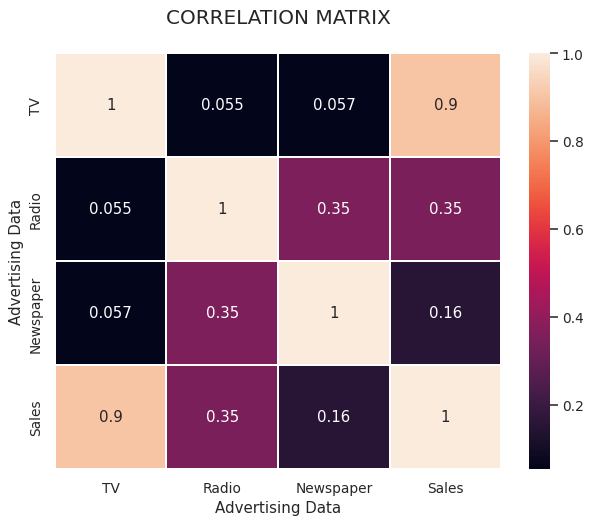

In [ ]:
# Dataset correlation
plt.figure(figsize = (8,6), dpi = 90)
sns.heatmap(adv.corr(), linecolor = 'white', linewidths = 0.1, annot = True)
plt.title('Correlation Matrix'.upper(), size = 16, pad = 24)
plt.xlabel('Advertising Data')
plt.ylabel('Advertising Data')
plt.show()


From the correlation matrix, we can see that TV advertising spending has the strongest positive relationship with sales followed by radio advertising spending and newspaper advertising spending. The correlations between the different types of advertising spending are relatively weak indicating that they have independent effects on sales. The correlation between TV marketing and sales is 0.9 means that as TV advertising spending increases, we would expect an increase in sales because of the strong positive linear relationship.

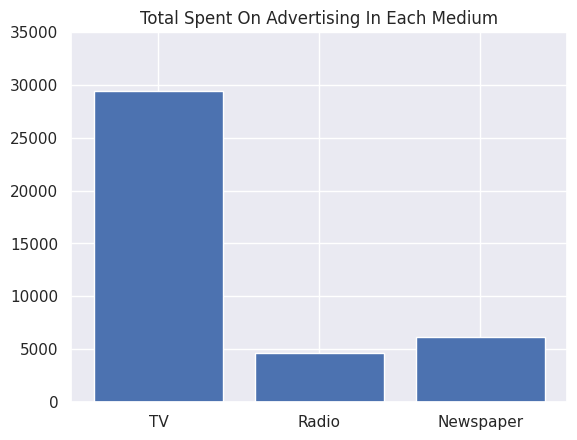

In [ ]:
col_names = list(adv.columns)[:-1]
totals = [adv[col].sum() for col in col_names]

fig, ax = plt.subplots()
ax.bar(col_names, totals)
ax.set_title('Total spent on advertising in each medium'.title())
ax.set_yticks(np.arange(0, 40000, 5000))
plt.show()


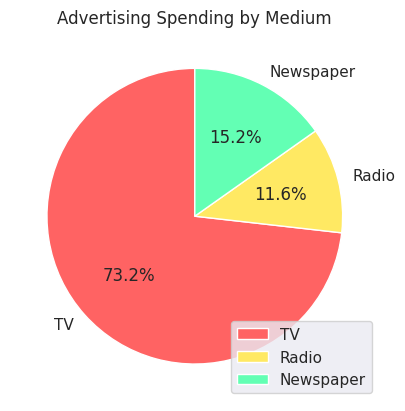

In [ ]:
percentages = [total / sum(totals) * 100 for total in totals]

colors = ['#FF6363', '#FFE963', '#63FFB4']
labels = col_names

fig, ax = plt.subplots()
ax.pie(percentages, labels = labels, autopct = '%1.1f%%', colors = colors, startangle = 90)
ax.set_title('Advertising Spending by Medium')
ax.legend(labels, loc='lower right')
plt.show()


From the pie chart, we can see that the largest portion of the advertising budget is spent on TV advertising, which accounts for 73.2% of the total spending. Radio advertising accounts for 11.6% of the spending, and newspaper advertising accounts for 15.6% of the spending. This suggests that the company empathises more on TV advertising compared to radio and newspaper advertising.

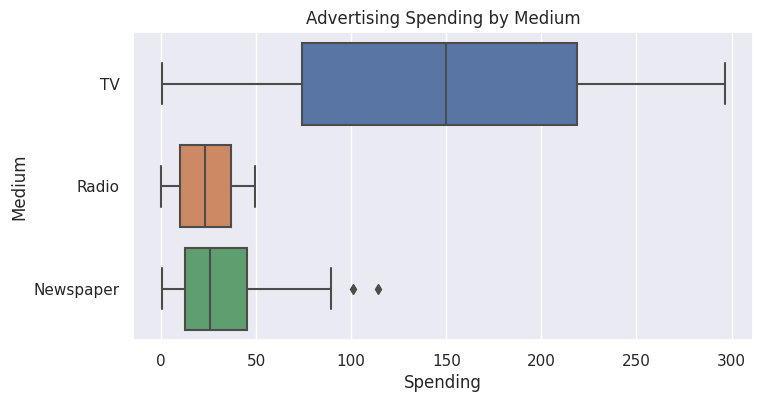

In [ ]:
fig, ax = plt.subplots(figsize=(8, 4))
sns.boxplot(data = adv.iloc[:, :3], orient = 'h', ax = ax)
ax.set_title('Advertising Spending by Medium')
ax.set_xlabel('Spending')
ax.set_ylabel('Medium')
plt.show()


In [ ]:
# Products for which money spent for advertising was beyond limits (only for newspaper as seen on box plot above)
Q1 = adv['Newspaper'].quantile(0.25)
Q3 = adv['Newspaper'].quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

outliers = adv[(adv['Newspaper'] < lower_bound) | (adv['Newspaper'] > upper_bound)]
outliers


,TV,Radio,Newspaper,Sales
16,67.8,36.6,114.0,12.5
101,296.4,36.3,100.9,23.8


In [ ]:
# The amount of money spent on a particular prodcut advertising which made maximum sales
max_sales = adv.loc[adv['Sales'].idxmax()].to_frame().T
total_spent = adv.loc[0, adv.columns[:-1]].sum()
unit_sold = adv.iloc[0, -1]

print(f'Money spent: {total_spent:.2f}K')
print(f'Units sold: {unit_sold:.2f}K')


Money spent: 337.10K
Units sold: 22.10K


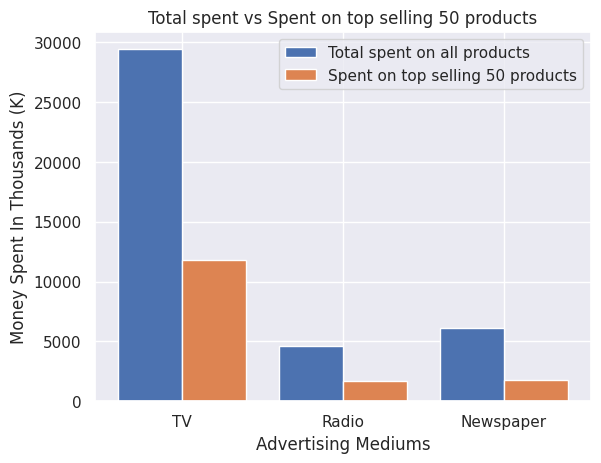

In [ ]:
sorted_adv = adv.copy().sort_values('Sales', ascending=False)
col_names = list(sorted_adv.columns)[:-1]

tops = [sorted_adv[col].head(50).sum() for col in col_names]
totals = [sorted_adv[col].sum() for col in col_names]
labels = col_names

width = 0.4
fig, ax = plt.subplots()
x_positions = np.arange(len(labels))
ax.bar(x_positions - width/2, totals, width, label='Total spent on all products')
ax.bar(x_positions + width/2, tops, width, label='Spent on top selling 50 products')

ax.legend()
ax.set_xlabel('Advertising Mediums')
ax.set_ylabel('Money Spent In Thousands (K)')
ax.set_title('Total spent vs Spent on top selling 50 products')

ax.set_xticks(x_positions)
ax.set_xticklabels(labels)

plt.show()


**Someone write some things about it**

From the bar chart we can see that,the huge money spent on all product in tv advertising and then newspaper and Radio mediums.Along with the increase in total spent, the amount spent on top selling 50 products is also increasing. From the bar chart it can be seen that the highest number of products were sold through TV advertising and the highest amount of money was invested in this TV advertising.

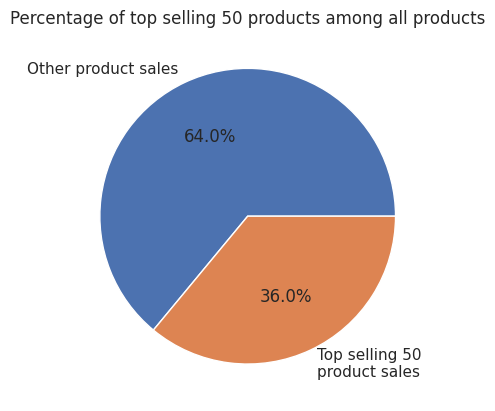

In [ ]:
total = sorted_adv['Sales'].sum()
top = (sorted_adv['Sales'].head(50).sum() / total) * 100

values = [100 - top, top]
labels = ['Other product sales', 'Top selling 50\nproduct sales']

fig, ax = plt.subplots()
ax.pie(values, labels = labels, autopct = '%1.1f%%')
ax.set_title('Percentage of top selling 50 products among all products')
plt.show()


From the chart above, we can see that top selling 50 products are accountable for around 36% of the overall product sells. Also, we can say that 25% (total 200 products) of the products are accountable for 36% of the overall sales.

**Someone write some more about it**

In [ ]:
# Number of products for which more than 250k was spent on advertising
prods = adv[adv[['TV', 'Radio', 'Newspaper']].sum(axis = 1) > 250]
len(prods)


67

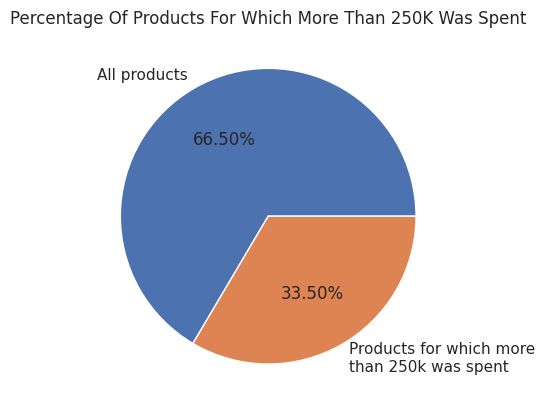

In [ ]:
values = [len(adv) - len(prods), len(prods)]
labels = ['All products', 'Products for which more\nthan 250k was spent']

fig, ax = plt.subplots()
ax.pie(values, labels=labels, autopct = '%1.2f%%')
ax.set_title('Percentage of Products for which more than 250k was spent'.title())
plt.show()


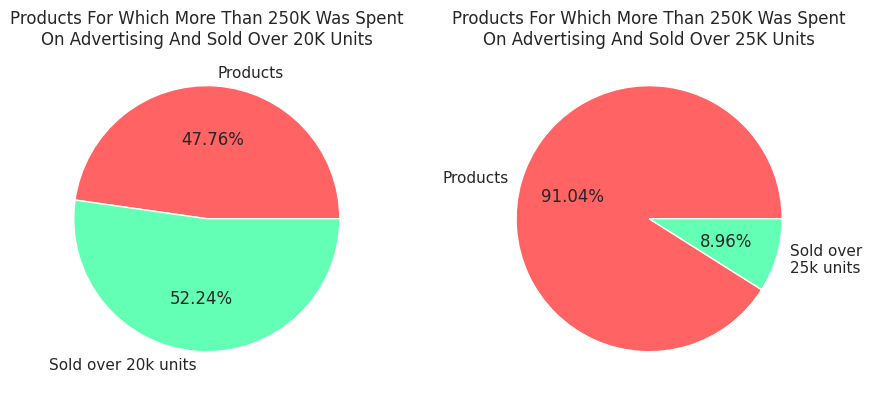

In [ ]:
sales20 = prods[prods['Sales'] > 20]
sales25 = prods[prods['Sales'] > 25]

values1 = [len(prods) - len(sales20), len(sales20)]
values2 = [len(prods) - len(sales25), len(sales25)]

colors = ['#FF6363', '#63FFB4']

fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (10, 5), gridspec_kw = {'wspace': 0.33})

ax1.pie(values1, labels = ['Products', 'Sold over 20k units'], colors = colors, autopct = '%1.2f%%')
ax1.set_title('products for which more than 250k was spent\non advertising and sold over 20k units'.title())

ax2.pie(values2, labels = ['Products', 'Sold over \n25k units'], colors = colors, autopct = '%1.2f%%')
ax2.set_title('products for which more than 250k was spent\non advertising and sold over 25k units'.title())

plt.show()


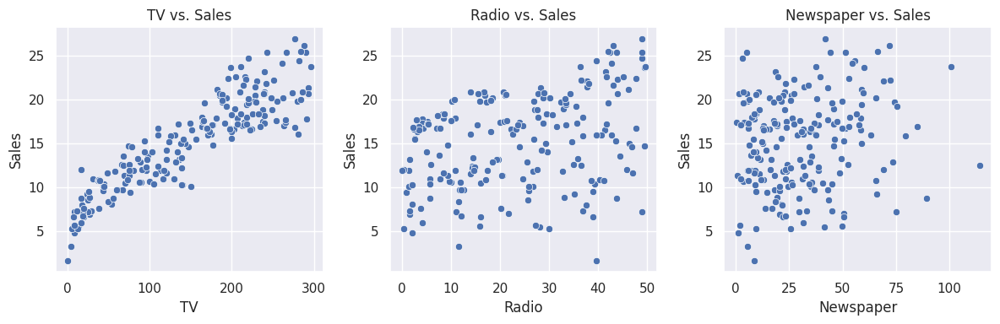

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

sns.scatterplot(ax = axes[0], x = 'TV', y = 'Sales', data = adv)
axes[0].set_title('TV vs. Sales')

sns.scatterplot(ax = axes[1], x = 'Radio', y = 'Sales', data = adv)
axes[1].set_title('Radio vs. Sales')

sns.scatterplot(ax = axes[2], x = 'Newspaper', y = 'Sales', data = adv)
axes[2].set_title('Newspaper vs. Sales')

fig.tight_layout()
plt.show()


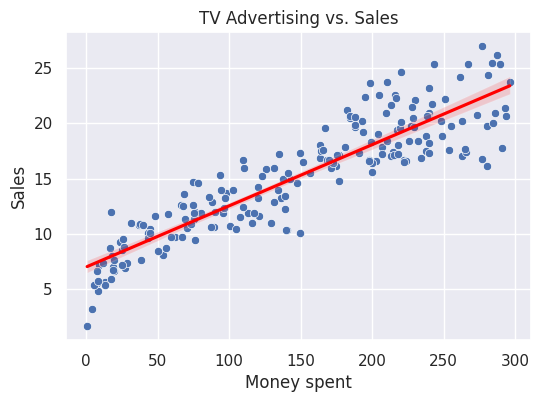

In [ ]:
fig, ax = plt.subplots(figsize=(6,4))

sns.scatterplot(x = 'TV', y = 'Sales', data = adv, ax = ax)
sns.regplot(x = 'TV', y = 'Sales', data = adv, ax = ax, scatter = False, color = 'red')

ax.set_title('TV Advertising vs. Sales')
ax.set_xlabel('Money spent')
ax.set_ylabel('Sales')

plt.show()


The scatter plot suggests that there is a clear association between the two TV advertising and Sales (correlation coefficient of 0.9 as seen earlier). As the TV advertising spending increases, the sales also tend to increase. This is further highlighted by the red regression line in the plot which shows a clear upward trend.

### Linear Regression with default parameters

In [ ]:
# Preparing dataset for training
X_adv = adv.drop(['Sales'], axis = 1)
y_adv = adv['Sales']
X_train_adv, X_test_adv, y_train_adv, y_test_adv = train_test_split(X_adv, y_adv, test_size = 0.2, random_state = 0)


In [ ]:
from sklearn.linear_model import LinearRegression

model1_adv = LinearRegression()
model1_adv.fit(X_train_adv, y_train_adv)


LinearRegression()

In [ ]:
# Showing coefficients and intercept
print(*model1_adv.coef_, sep=', ')
print(model1_adv.intercept_)


0.05368005507002433, 0.11152623638588736, -0.0035116615731400624
4.773205203269841


In [ ]:
y_pred1_adv = model1_adv.predict(X_test_adv)
y_pred1_adv


array([10.70988945,  8.68629773,  9.5778695 , 24.86207988, 14.65584473,
        8.3214275 , 10.43048002, 18.4453765 ,  9.73394291, 17.9290798 ,
       23.369886  , 10.67916356, 13.44032325, 17.17416235, 11.77380187,
       13.37072678, 21.26009906,  9.19666875, 14.13201846, 18.9260716 ,
       24.75507991, 12.48481182, 16.57130583, 13.77344772,  7.79299106,
       15.19648316, 14.71607944, 20.73862119, 17.01041859,  8.83474391,
       12.09424377, 20.74886454, 21.26147987, 21.90420095,  7.08087067,
        7.04431681,  9.15949871, 15.47796148, 13.28282334,  7.23769883])

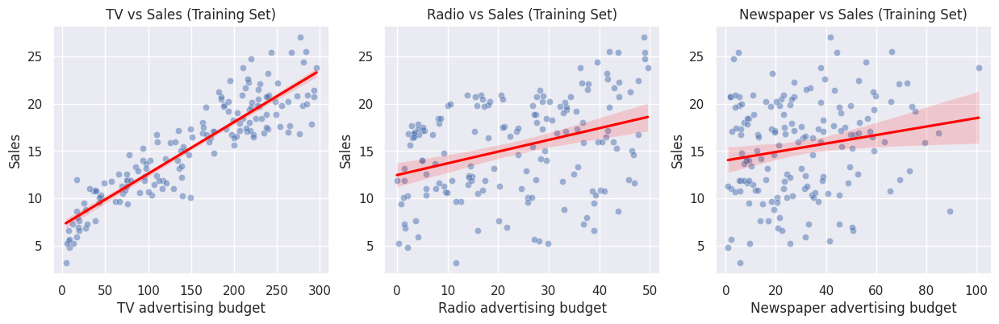

In [ ]:
# Creating dataframe with true and predicted values
y_pred1_train = model1_adv.predict(X_train_adv)
temp = pd.DataFrame({'TV': X_train_adv['TV'], 'Radio': X_train_adv['Radio'], 'Newspaper': X_train_adv['Newspaper'], 'True Sales': y_train_adv, 'Predicted Sales': y_pred1_train})

fig, axes = plt.subplots(1, 3, figsize = (15, 4))

sns.scatterplot(x = 'TV', y = 'True Sales', data = temp, ax = axes[0], alpha = 0.5)
sns.regplot(x = 'TV', y = 'Predicted Sales', data = temp, ax = axes[0], scatter = False, color = 'red')
axes[0].set_title('TV vs Sales (Training Set)')
axes[0].set_xlabel('TV advertising budget')
axes[0].set_ylabel('Sales')

sns.scatterplot(x = 'Radio', y = 'True Sales', data = temp, ax = axes[1], alpha = 0.5)
sns.regplot(x = 'Radio', y = 'Predicted Sales', data = temp, ax = axes[1], scatter = False, color = 'red')
axes[1].set_title('Radio vs Sales (Training Set)')
axes[1].set_xlabel('Radio advertising budget')
axes[1].set_ylabel('Sales')

sns.scatterplot(x = 'Newspaper', y = 'True Sales', data = temp, ax = axes[2], alpha = 0.5)
sns.regplot(x = 'Newspaper', y = 'Predicted Sales', data = temp, ax = axes[2], scatter = False, color = 'red')
axes[2].set_title('Newspaper vs Sales (Training Set)')
axes[2].set_xlabel('Newspaper advertising budget')
axes[2].set_ylabel('Sales')

plt.show()


### Linear Regression with different parameters

In [ ]:
model2_adv = LinearRegression(fit_intercept = False)
model2_adv.fit(X_train_adv, y_train_adv)


LinearRegression(fit_intercept=False)

In [ ]:
# Showing coefficients and intercept
print(*model2_adv.coef_, sep = ', ')
print(model2_adv.intercept_)


0.06670600007020686, 0.1692692814844498, 0.02256894127072033
0.0


In [ ]:
y_pred2_adv = model2_adv.predict(X_test_adv)
y_pred2_adv


array([ 8.4990871 ,  5.71409219,  6.60460263, 27.64034862, 13.46808834,
        5.38400966, 10.55028066, 17.44812616,  9.01624781, 17.44555884,
       25.89259723,  8.39867631, 11.07358196, 16.31337359, 10.11911561,
       11.59753884, 21.10926993,  6.94610754, 14.37624133, 18.69473787,
       28.08367471,  9.88358392, 16.1997011 , 12.68062036,  4.39028491,
       14.34808062, 13.13641979, 21.75112586, 15.70046578,  7.00177629,
       13.29078181, 22.9838624 , 21.91226806, 23.07867235,  4.69132026,
        3.82367373,  6.97963035, 15.20657922, 12.89862774,  4.19990965])

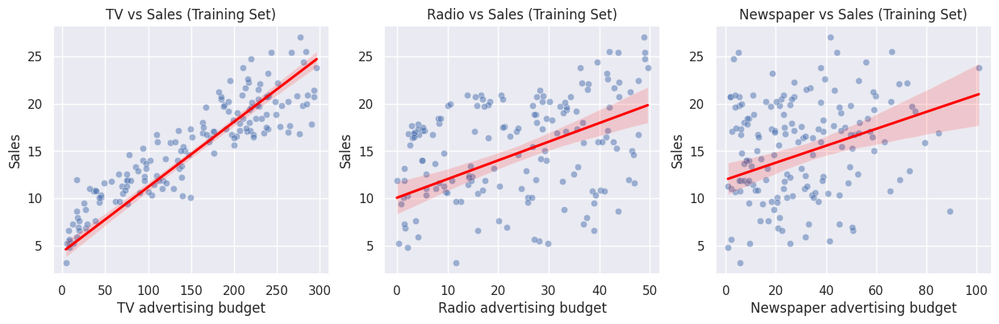

In [ ]:
# Creating dataframe with true and predicted values
y_pred2_train = model2_adv.predict(X_train_adv)
temp = pd.DataFrame({'TV': X_train_adv['TV'], 'Radio': X_train_adv['Radio'], 'Newspaper': X_train_adv['Newspaper'], 'True Sales': y_train_adv, 'Predicted Sales': y_pred2_train})

fig, axes = plt.subplots(1, 3, figsize = (15, 4))

sns.scatterplot(x = 'TV', y = 'True Sales', data = temp, ax = axes[0], alpha = 0.5)
sns.regplot(x = 'TV', y = 'Predicted Sales', data = temp, ax = axes[0], scatter = False, color = 'red')
axes[0].set_title('TV vs Sales (Training Set)')
axes[0].set_xlabel('TV advertising budget')
axes[0].set_ylabel('Sales')

sns.scatterplot(x = 'Radio', y = 'True Sales', data = temp, ax = axes[1], alpha = 0.5)
sns.regplot(x = 'Radio', y = 'Predicted Sales', data = temp, ax = axes[1], scatter = False, color = 'red')
axes[1].set_title('Radio vs Sales (Training Set)')
axes[1].set_xlabel('Radio advertising budget')
axes[1].set_ylabel('Sales')

sns.scatterplot(x = 'Newspaper', y = 'True Sales', data = temp, ax = axes[2], alpha = 0.5)
sns.regplot(x = 'Newspaper', y = 'Predicted Sales', data = temp, ax = axes[2], scatter = False, color = 'red')
axes[2].set_title('Newspaper vs Sales (Training Set)')
axes[2].set_xlabel('Newspaper advertising budget')
axes[2].set_ylabel('Sales')

plt.show()


In [ ]:
model3_adv = LinearRegression(fit_intercept = True, positive = True)
model3_adv.fit(X_train_adv, y_train_adv)


LinearRegression(positive=True)

In [ ]:
# Showing coefficients and intercept
print(*model3_adv.coef_, sep = ', ')
print(model3_adv.intercept_)


0.0535946734341735, 0.10989805812677411, 0.0
4.718345723974636


In [ ]:
y_pred3_adv = model3_adv.predict(X_test_adv)
y_pred3_adv


array([10.68000732,  8.67289687,  9.59627362, 24.89341048, 14.697364  ,
        8.3567853 , 10.55863443, 18.38868264,  9.85132079, 17.86927795,
       23.41528097, 10.68859833, 13.39700653, 17.10227442, 11.74725693,
       13.31442741, 21.15105215,  9.1078251 , 14.1508319 , 18.85894126,
       24.8577903 , 12.44648472, 16.57547935, 13.79888848,  7.80545687,
       15.11832283, 14.69260423, 20.6616562 , 16.98730791,  8.88795212,
       12.37433351, 20.80729034, 21.28995356, 21.8483045 ,  7.17317454,
        7.05033262,  9.23136496, 15.59516171, 13.27468497,  7.2670912 ])

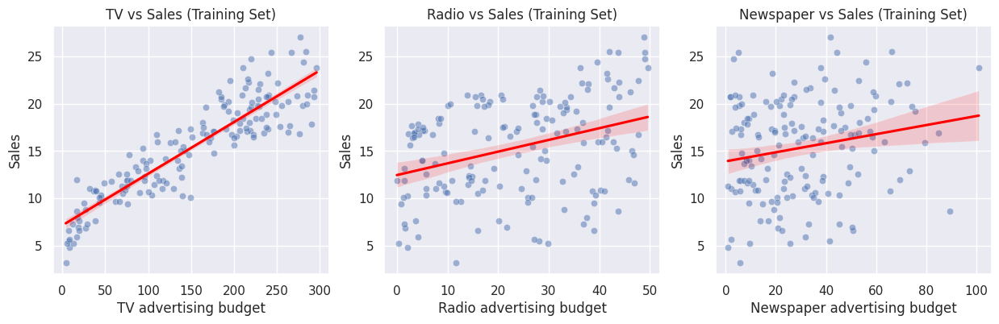

In [ ]:
# Creating dataframe with true and predicted values
y_pred3_train = model3_adv.predict(X_train_adv)
temp = pd.DataFrame({'TV': X_train_adv['TV'], 'Radio': X_train_adv['Radio'], 'Newspaper': X_train_adv['Newspaper'], 'True Sales': y_train_adv, 'Predicted Sales': y_pred3_train})

fig, axes = plt.subplots(1, 3, figsize = (15, 4))

sns.scatterplot(x = 'TV', y = 'True Sales', data = temp, ax = axes[0], alpha = 0.5)
sns.regplot(x = 'TV', y = 'Predicted Sales', data = temp, ax = axes[0], scatter = False, color = 'red')
axes[0].set_title('TV vs Sales (Training Set)')
axes[0].set_xlabel('TV advertising budget')
axes[0].set_ylabel('Sales')

sns.scatterplot(x = 'Radio', y = 'True Sales', data = temp, ax = axes[1], alpha = 0.5)
sns.regplot(x = 'Radio', y = 'Predicted Sales', data = temp, ax = axes[1], scatter = False, color = 'red')
axes[1].set_title('Radio vs Sales (Training Set)')
axes[1].set_xlabel('Radio advertising budget')
axes[1].set_ylabel('Sales')

sns.scatterplot(x = 'Newspaper', y = 'True Sales', data = temp, ax = axes[2], alpha = 0.5)
sns.regplot(x = 'Newspaper', y = 'Predicted Sales', data = temp, ax = axes[2], scatter = False, color = 'red')
axes[2].set_title('Newspaper vs Sales (Training Set)')
axes[2].set_xlabel('Newspaper advertising budget')
axes[2].set_ylabel('Sales')

plt.show()


### Statistics for different models

In [ ]:
from sklearn import metrics

reg_score1 = model1_adv.score(X_train_adv, y_train_adv)
r2_score1 = metrics.r2_score(y_test_adv, y_pred1_adv)
mse1 = np.sqrt(metrics.mean_squared_error(y_test_adv, y_pred1_adv))
mae1 = metrics.mean_absolute_error(y_test_adv, y_pred1_adv)
print('Model 1:')
print(f'LinearRegression score: {reg_score1}')
print(f'R-squared Error: {r2_score1}')
print(f'Mean Squared Error: {mse1}')
print(f'Mean Absolute Error: {mae1}')

reg_score2 = model2_adv.score(X_train_adv, y_train_adv)
r2_score2 = metrics.r2_score(y_test_adv, y_pred2_adv)
mse2 = np.sqrt(metrics.mean_squared_error(y_test_adv, y_pred2_adv))
mae2 = metrics.mean_absolute_error(y_test_adv, y_pred2_adv)
print('\nModel 2:')
print(f'LinearRegression score: {reg_score2}')
print(f'R-squared Error: {r2_score2}')
print(f'Mean Squared Error: {mse2}')
print(f'Mean Absolute Error: {mae2}')

reg_score3 = model3_adv.score(X_train_adv, y_train_adv)
r2_score3 = metrics.r2_score(y_test_adv, y_pred3_adv)
mse3 = np.sqrt(metrics.mean_squared_error(y_test_adv, y_pred3_adv))
mae3 = metrics.mean_absolute_error(y_test_adv, y_pred3_adv)
print('\nModel 3:')
print(f'LinearRegression score: {reg_score3}')
print(f'R-squared Error: {r2_score3}')
print(f'Mean Squared Error: {mse3}')
print(f'Mean Absolute Error: {mae3}')


Model 1:
LinearRegression score: 0.9132130769530317
R-squared Error: 0.8645053923967724
Mean Squared Error: 2.1266293899128947
Mean Absolute Error: 1.417031303060067

Model 2:
LinearRegression score: 0.7896455444295166
R-squared Error: 0.7817997456772798
Mean Squared Error: 2.698723755557279
Mean Absolute Error: 2.203881407319654

Model 3:
LinearRegression score: 0.9130218535776821
R-squared Error: 0.8658755781123508
Mean Squared Error: 2.1158493250248567
Mean Absolute Error: 1.40328671368941


**Write Here**

What do you undersend this above (section 4.2)? Write in your own words in this cell.

First, we load the dataset and show necessary dataset statistics. We see that the dataset contains no missing and duplicate values. Then we analyze the dataset based on our understanding. We prepare three linear regression models and calculate the statistics for each model.

- Model 1 has a high LinearRegression score of 0.9132 indicating that it fits the data well. The R-squared score of 0.8645 means that the model explains about 86.45% of the variance in the target variable. The MSE and MAE values are relatively low, indicating that the model's predictions are reasonably accurate.

- Model 2 has a lower LinearRegression score of 0.7896, indicating that it fits the data less well compared to Model 1. The R-squared score of 0.7818 means that the model explains about 78.18% of the variance in the target variable which is lower than Model 1. The MSE and MAE values are higher indicating that this model's predictions are less accurate than Model 1.

- Model 3 has a similar LinearRegression score to Model 1 indicating that it fits the data well. The R-squared score of 0.8659 means that the model explains about 86.59% of the variance in the target variable which is slightly higher than Model 1. The MSE and MAE values are also similar to Model 1, indicating that this model's predictions are similarly accurate.

Overall, Model 1 and Model 3 seem to perform similarly well with high LinearRegression scores and relatively low MSE and MAE values.

## 5.	Performance Evaluation and Discussion

Use charts and figures appropriately to visualize and compare the performance of different models (for both the dataset, provide seperate comparison). Add as many cells as you need.

\

Analyze the performance of the models and provide your hypothesis behind their performance, e.g. Why are some models performing better than others? Provide appropriate reasoning for your hypothesis. 

### Logistic Regression Models Comparison

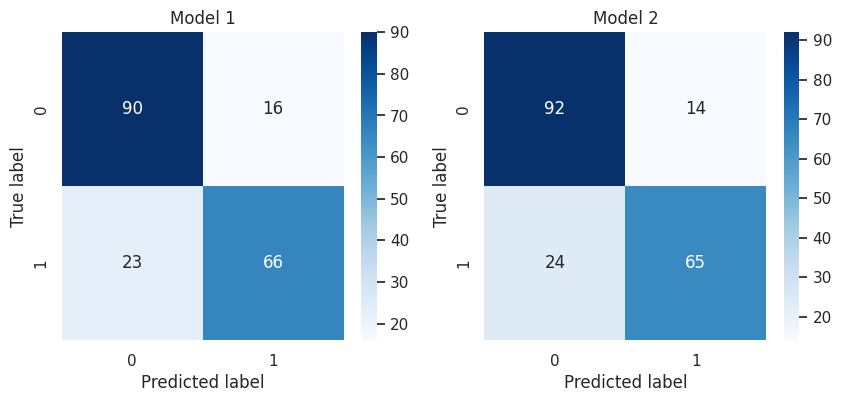

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score, classification_report, \
 roc_auc_score, roc_curve, auc, precision_recall_curve

conf_matrix_model1 = confusion_matrix(y_test_tnc, y_pred1_tnc)
conf_matrix_model2 = confusion_matrix(y_test_tnc, y_pred2_tnc)

fig, axs = plt.subplots(1, 2, figsize=(10, 4))

sns.heatmap(conf_matrix_model1, annot = True, cmap = 'Blues', ax = axs[0])
axs[0].set_title('Model 1')

sns.heatmap(conf_matrix_model2, annot = True, cmap = 'Blues', ax = axs[1])
axs[1].set_title('Model 2')

axs[0].set_xlabel('Predicted label')
axs[0].set_ylabel('True label')
axs[1].set_xlabel('Predicted label')
axs[1].set_ylabel('True label')
plt.show()


In [ ]:
# Evaluating the model using a Classification Report

print('Classification Report for Model 1:')
print(classification_report(y_test_tnc, y_pred1_tnc))

print('\nClassification Report for Model 2: ')
print(classification_report(y_test_tnc, y_pred2_tnc))


Classification Report for Model 1:
              precision    recall  f1-score   support

           0       0.80      0.85      0.82       106
           1       0.80      0.74      0.77        89

    accuracy                           0.80       195
   macro avg       0.80      0.80      0.80       195
weighted avg       0.80      0.80      0.80       195


Classification Report for Model 2: 
              precision    recall  f1-score   support

           0       0.79      0.87      0.83       106
           1       0.82      0.73      0.77        89

    accuracy                           0.81       195
   macro avg       0.81      0.80      0.80       195
weighted avg       0.81      0.81      0.80       195



In [ ]:
# Accuracy score on the test set

print(f'Accuracy Score for Model 1: {accuracy_score(y_pred1_tnc, y_test_tnc):.2f}')
print(f'Accuracy Score for Model 2: {accuracy_score(y_pred2_tnc, y_test_tnc):.2f}')


Accuracy Score for Model 1: 0.80
Accuracy Score for Model 2: 0.81


In [ ]:
# Accuracy score on the training set

print(f'Training Set Accuracy Score for Model 1: {model1_tnc.score(X_train_tnc, y_train_tnc):.2f}')
print(f'Training Set Accuracy Score for Model 2: {model2_tnc.score(X_train_tnc, y_train_tnc):.2f}')


Training Set Accuracy Score for Model 1: 0.78
Training Set Accuracy Score for Model 2: 0.78


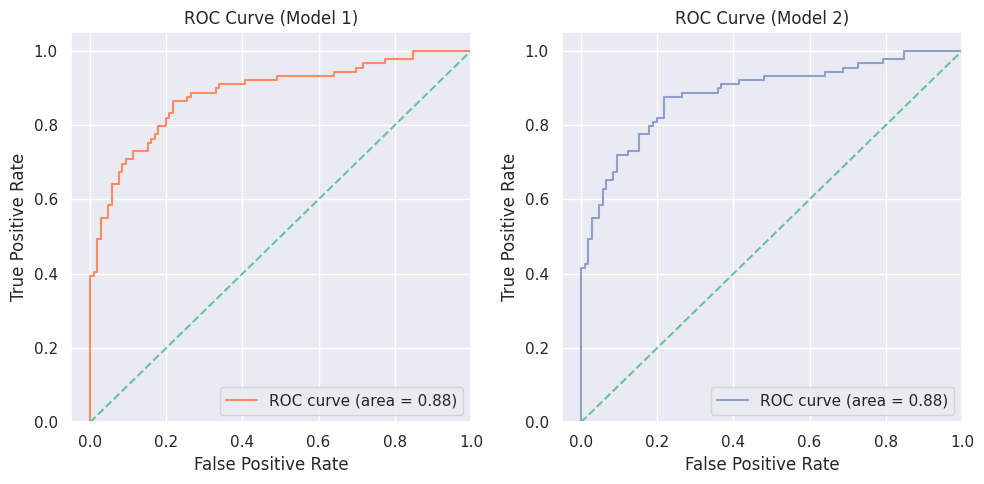

In [ ]:
"""
A Receiver Operating Characteristic (ROC) curve

The ROC curve is a graph that shows how well a binary classifier (a model that predicts one of two outcomes) can distinguish between positive and negative cases.

It plots the True Positive Rate (TPR) against the False Positive Rate (FPR) at different classification thresholds.

The TPR is the proportion of actual positive cases that are correctly identified as positive,
while the FPR is the proportion of actual negative cases that are incorrectly identified as positive.

A good classifier has a curve that is close to the top-left corner, which represents high TPR and low FPR,
indicating that it can accurately distinguish between the positive and negative classes.

The area under the ROC curve (AUC) is a measure of how well the classifier can separate the positive and negative cases,
with an AUC of 1 indicating perfect separation and an AUC of 0.5 indicating random classifier.

The probabilities are then used to calculate the false positive rate, true positive rate, and thresholds.

The area under the ROC curve (AUC-ROC) is also calculated using the auc function.
"""

colors = sns.color_palette('Set2', n_colors = 3)

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))

y_prob1_tnc = model1_tnc.predict_proba(X_test_tnc)[:,1]
y_prob2_tnc = model2_tnc.predict_proba(X_test_tnc)[:,1]

fpr, tpr, thresholds = roc_curve(y_test_tnc, y_prob1_tnc)
roc_auc = auc(fpr, tpr)

axes[0].plot(fpr, tpr, label = 'ROC curve (area = %0.2f)' %roc_auc, color = colors[1])
axes[0].plot([0, 1], [0, 1], color = colors[0], linestyle = '--')
axes[0].set_xlim([-0.05, 1.0])
axes[0].set_ylim([0.0, 1.05])
axes[0].set_xlabel('False Positive Rate')
axes[0].set_ylabel('True Positive Rate')
axes[0].set_title('ROC Curve (Model 1)')
axes[0].legend(loc = "lower right")

fpr, tpr, thresholds = roc_curve(y_test_tnc, y_prob2_tnc)
roc_auc = auc(fpr, tpr)

axes[1].plot(fpr, tpr, label = 'ROC curve (area = %0.2f)' %roc_auc, color = colors[2])
axes[1].plot([0, 1], [0, 1], color=colors[0], linestyle='--')
axes[1].set_xlim([-0.05, 1.0])
axes[1].set_ylim([0.0, 1.05])
axes[1].set_xlabel('False Positive Rate')
axes[1].set_ylabel('True Positive Rate')
axes[1].set_title('ROC Curve (Model 2)')
axes[1].legend(loc = "lower right")

plt.tight_layout()
plt.show()


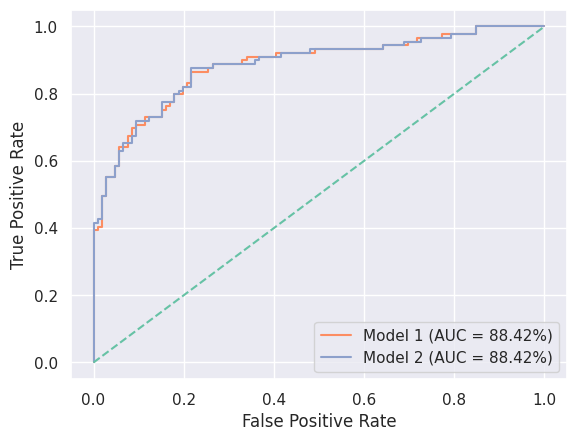

In [ ]:
# Calculating the false positive rate, true positive rate, and threshold for both models
fpr_model1, tpr_model1, threshold_model1 = roc_curve(y_test_tnc, y_prob1_tnc)
fpr_model2, tpr_model2, threshold_model2 = roc_curve(y_test_tnc, y_prob2_tnc)

# Calculating the AUC for both models
auc_model1 = auc(fpr_model1, tpr_model1)
auc_model2 = auc(fpr_model2, tpr_model2)

# Creating a ROC curve for both models
plt.plot(fpr_model1, tpr_model1, color = colors[1], label = f'Model 1 (AUC = {auc_model1:.2%})')
plt.plot(fpr_model2, tpr_model2, color = colors[2], label = f'Model 2 (AUC = {auc_model2:.2%})')

# Adding a reference line
plt.plot([0, 1], [0, 1], linestyle='--', color = colors[0])

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.show()


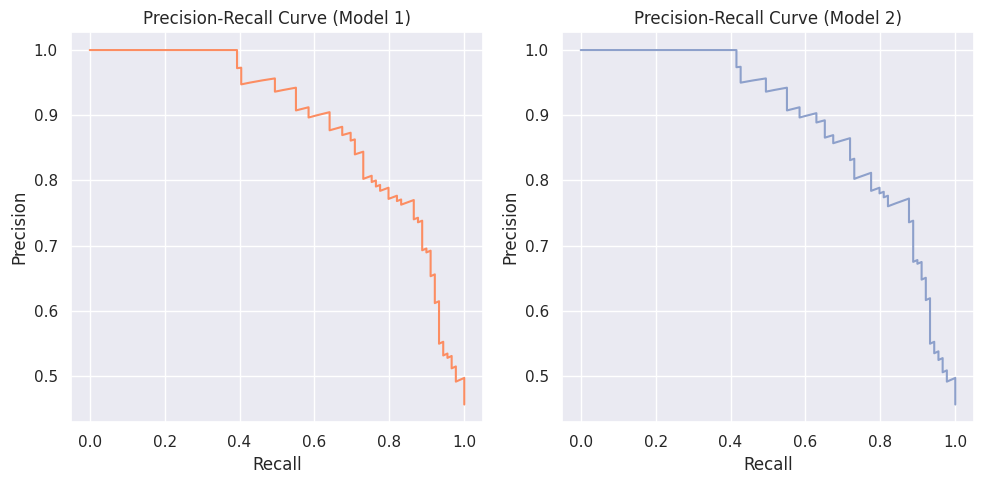

In [ ]:
precision1, recall1, threshold1 = precision_recall_curve(y_test_tnc, y_prob1_tnc)
precision2, recall2, threshold2 = precision_recall_curve(y_test_tnc, y_prob2_tnc)

fig, axs = plt.subplots(1, 2, figsize=(10, 5))

# Plot Precision-Recall Curve for Model 1
axs[0].plot(recall1, precision1, color = colors[1], label='Model 1')
axs[0].set_xlabel('Recall')
axs[0].set_ylabel('Precision')
axs[0].set_title('Precision-Recall Curve (Model 1)')

# Plot Precision-Recall Curve for Model 2
axs[1].plot(recall2, precision2, color = colors[2], label='Model 2')
axs[1].set_xlabel('Recall')
axs[1].set_ylabel('Precision')
axs[1].set_title('Precision-Recall Curve (Model 2)')

plt.tight_layout()
plt.show()


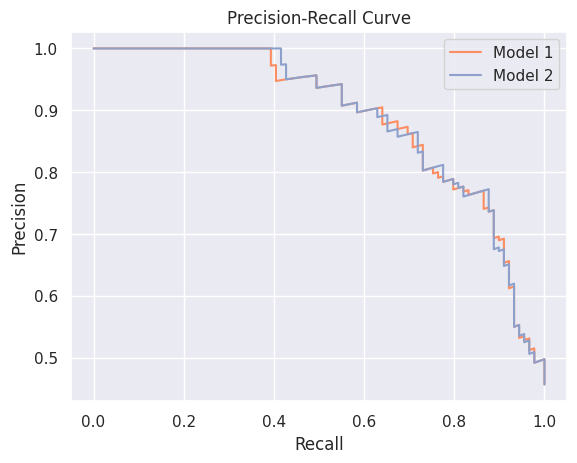

In [ ]:
"""
Precision is the proportion of true positives (correctly predicted positive cases) out of all predicted positive cases.

Recall is the proportion of true positives out of all actual positive cases.

The graph shows how precision and recall change as the threshold for classifying something as positive is varied.

A high precision value means that the model makes few false positive predictions,
while a high recall value means that the model makes few false negative predictions.

A good model will have high precision and high recall values,
which means that it correctly predicts both positive and negative cases.
"""

precision1, recall1, threshold1 = precision_recall_curve(y_test_tnc, y_prob1_tnc)
precision2, recall2, threshold2 = precision_recall_curve(y_test_tnc, y_prob2_tnc)

# Plot Precision-Recall Curve for both models
plt.plot(recall1, precision1, color = colors[1], label='Model 1')
plt.plot(recall2, precision2, color = colors[2], label='Model 2')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend()
plt.show()


### Performance of the Logistic Regression Models:

Logistic regression is a statistical model used to analyze and predict the relationship between a binary dependent variable and one or more independent variables. 

In this section, we evalutate two logistic regression models. The classification report contains precision (indicates low false positive rate), recall (indicates low false negative rate), F1-score, Support and accuracy. 

We also analyze the ROC curve which plot true positive rate (TPR) against the false positive rate (FPR) at various classification thresholds for two models. We can identify the optimal trade-off between TPR and FPR from the plot. AUC measures the entire two-dimensional area underneath the entire ROC curve from (0, 0) to (1, 1). AUC ranges in value from 0 to 1. A model whose predictions are 100% wrong has an AUC of 0.0 and one whose predictions are 100% correct has an AUC of 1.0. 

The precision-recall curve shows the tradeoff between precision and recall for different threshold. A high area under the curve represents both high recall and high precision, where high precision relates to a low false positive rate and high recall relates to a low false negative rate. From these plots, we can say that both models perform in a similar way.

Both models have similar overall performance with an accuracy of around 80%, and their precision, recall and f1-score are also quite similar. However, Model 2 shows slightly better results than Model 1.

### Linear Regression Models Comparison

In [ ]:
"""
LinearRegression score: the coefficient of determination (R^2) of the linear regression model.

R-squared Error: the proportion of the variance in the dependent variable that is predictable from the independent variables.
A high R-squared score indicates that the model fits the data well and is able to explain a large portion of the variation in the dependent variable.

Mean Squared Error: the mean of the squared differences between the predicted and actual values.

Mean Absolute Error: the mean of the absolute differences between the predicted and actual values.

A lower MSE and MAE indicate that the model is making more accurate predictions.
"""

print('Model 1:')
print(f'LinearRegression score: {reg_score1}')
print(f'R-squared Error: {r2_score1}')
print(f'Mean Squared Error: {mse1}')
print(f'Mean Absolute Error: {mae1}')

print('\nModel 2:')
print(f'LinearRegression score: {reg_score2}')
print(f'R-squared Error: {r2_score2}')
print(f'Mean Squared Error: {mse2}')
print(f'Mean Absolute Error: {mae2}')

print('\nModel 3:')
print(f'LinearRegression score: {reg_score3}')
print(f'R-squared Error: {r2_score3}')
print(f'Mean Squared Error: {mse3}')
print(f'Mean Absolute Error: {mae3}')


Model 1:
LinearRegression score: 0.9132130769530317
R-squared Error: 0.8645053923967724
Mean Squared Error: 2.1266293899128947
Mean Absolute Error: 1.417031303060067

Model 2:
LinearRegression score: 0.7896455444295166
R-squared Error: 0.7817997456772798
Mean Squared Error: 2.698723755557279
Mean Absolute Error: 2.203881407319654

Model 3:
LinearRegression score: 0.9130218535776821
R-squared Error: 0.8658755781123508
Mean Squared Error: 2.1158493250248567
Mean Absolute Error: 1.40328671368941


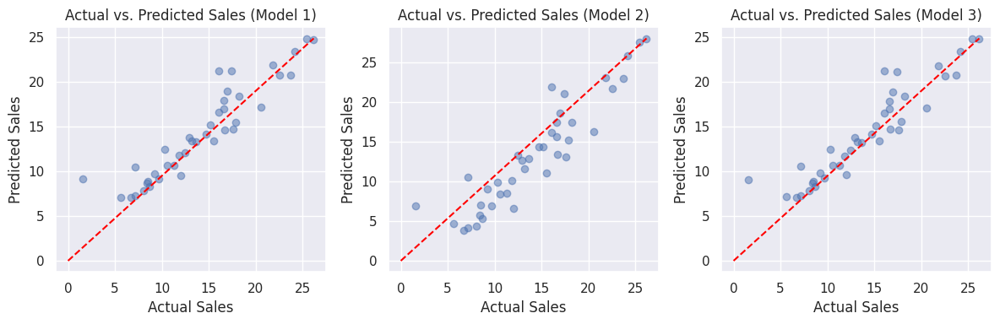

In [ ]:
"""
This code shows the actual values to the predicted values of three different regression models.

By looking at these scatter plots, we can visually assess how well each model's predictions match up with the actual sales values.

If the points fall close to the reference line (i.e., the diagonal line), it indicates that the model's predictions are accurate.

The reference line represents the case where the actual and predicted values are equal.

If the points are scattered widely around the reference line, it indicates that the model's predictions are not as accurate.
"""

fig, axs = plt.subplots(1, 3, figsize = (12, 4))

axs[0].scatter(y_test_adv, y_pred1_adv, alpha = 0.5)
axs[0].plot([0, max(y_test_adv)], [0, max(y_pred1_adv)], linestyle = '--', color = 'red')
axs[0].set_xlabel('Actual Sales')
axs[0].set_ylabel('Predicted Sales')
axs[0].set_title('Actual vs. Predicted Sales (Model 1)')

axs[1].scatter(y_test_adv, y_pred2_adv, alpha = 0.5)
axs[1].plot([0, max(y_test_adv)], [0, max(y_pred2_adv)], linestyle = '--', color = 'red')
axs[1].set_xlabel('Actual Sales')
axs[1].set_ylabel('Predicted Sales')
axs[1].set_title('Actual vs. Predicted Sales (Model 2)')

axs[2].scatter(y_test_adv, y_pred3_adv, alpha = 0.5)
axs[2].plot([0, max(y_test_adv)], [0, max(y_pred3_adv)], linestyle = '--', color = 'red')
axs[2].set_xlabel('Actual Sales')
axs[2].set_ylabel('Predicted Sales')
axs[2].set_title('Actual vs. Predicted Sales (Model 3)')

plt.tight_layout()
plt.show()


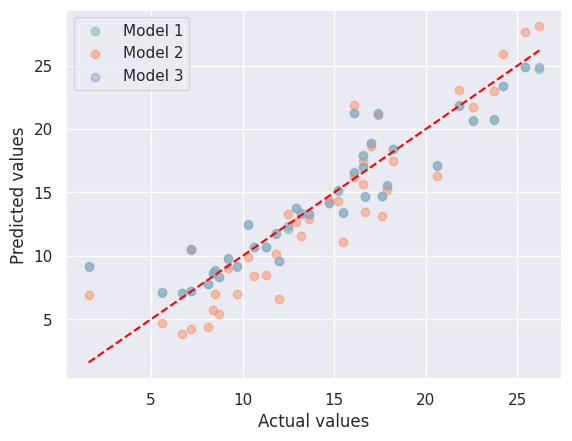

In [ ]:
"""
The reference line goes from the minimum actual value to the maximum actual value and from the minimum predicted value to the maximum predicted value.

The resulting plot will help to compare the performance of the three regression models and determine which one provides the best fit for the data.
"""

colors = sns.color_palette('Set2', n_colors = 3)

# Creating scatter plots for the models
plt.scatter(y_test_adv, y_pred1_adv, color = colors[0], label = 'Model 1', alpha = 0.5)
plt.scatter(y_test_adv, y_pred2_adv, color = colors[1], label = 'Model 2', alpha = 0.5)
plt.scatter(y_test_adv, y_pred3_adv, color = colors[2], label = 'Model 3', alpha = 0.5)

# Adding a reference line
plt.plot([min(y_test_adv), max(y_test_adv)], [min(y_test_adv), max(y_test_adv)], linestyle = '--', color = 'red')

plt.xlabel('Actual values')
plt.ylabel('Predicted values')
plt.legend()
plt.show()


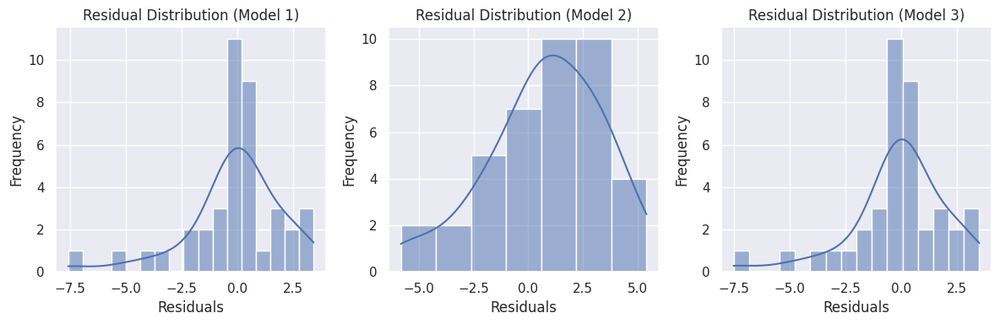

In [ ]:
"""
The residuals are the differences between the actual values and the predicted values.

This code analyzes the distribution of the residuals for each model.

It identifies any patterns or trends that may be present.

In general, a good regression model should have residuals that are normally distributed and centered around zero.
"""

fig, axs = plt.subplots(1, 3, figsize = (12,4))

sns.histplot(y_test_adv - y_pred1_adv, kde = True, ax = axs[0])
axs[0].set_xlabel('Residuals')
axs[0].set_ylabel('Frequency')
axs[0].set_title('Residual Distribution (Model 1)')

sns.histplot(y_test_adv - y_pred2_adv, kde = True, ax = axs[1])
axs[1].set_xlabel('Residuals')
axs[1].set_ylabel('Frequency')
axs[1].set_title('Residual Distribution (Model 2)')

sns.histplot(y_test_adv - y_pred3_adv, kde = True, ax = axs[2])
axs[2].set_xlabel('Residuals')
axs[2].set_ylabel('Frequency')
axs[2].set_title('Residual Distribution (Model 3)')

plt.tight_layout()
plt.show()


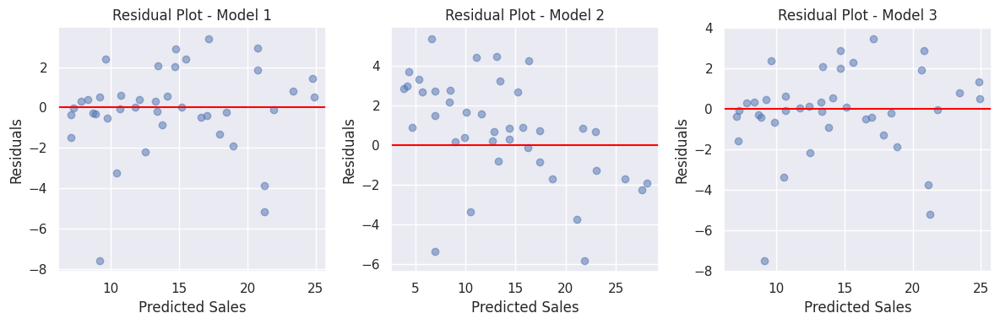

In [ ]:
"""
The residual plot is plotted against the predicted values.

The horizontal line at y = 0 to help visualize when the residuals are evenly distributed around zero,
which is a good indication that the model is a good fit for the data.

The resulting figure determines which one provides the best fit for the data, based on the distribution of the residuals around zero.
"""

fig, axs = plt.subplots(1, 3, figsize = (12, 4))

axs[0].scatter(y_pred1_adv, y_test_adv - y_pred1_adv, alpha = 0.5)
axs[0].axhline(y = 0, color = 'red')
axs[0].set_xlabel('Predicted Sales')
axs[0].set_ylabel('Residuals')
axs[0].set_title('Residual Plot - Model 1')

axs[1].scatter(y_pred2_adv, y_test_adv - y_pred2_adv, alpha = 0.5)
axs[1].axhline(y = 0, color = 'red')
axs[1].set_xlabel('Predicted Sales')
axs[1].set_ylabel('Residuals')
axs[1].set_title('Residual Plot - Model 2')

axs[2].scatter(y_pred3_adv, y_test_adv - y_pred3_adv, alpha = 0.5)
axs[2].axhline(y = 0, color = 'red')
axs[2].set_xlabel('Predicted Sales')
axs[2].set_ylabel('Residuals')
axs[2].set_title('Residual Plot - Model 3')

plt.tight_layout()
plt.show()


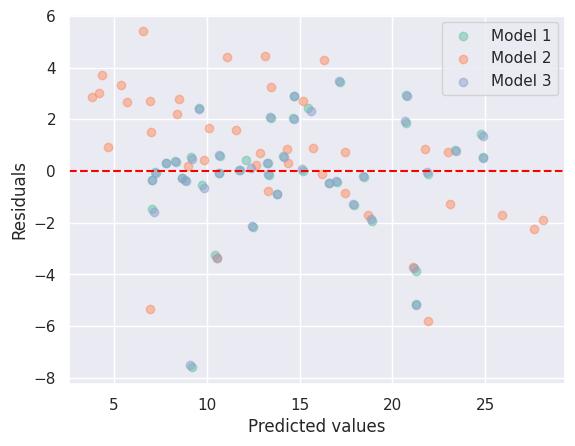

In [ ]:
colors = sns.color_palette('Set2', n_colors = 3)

# Creating residual plots for the models
plt.scatter(y_pred1_adv, y_test_adv - y_pred1_adv, color = colors[0], label = 'Model 1', alpha = 0.5)
plt.scatter(y_pred2_adv, y_test_adv - y_pred2_adv, color = colors[1], label = 'Model 2', alpha = 0.5)
plt.scatter(y_pred3_adv, y_test_adv - y_pred3_adv, color = colors[2], label = 'Model 3', alpha = 0.5)

# Adding a horizontal line at y = 0
plt.axhline(y = 0, linestyle = '--', color = 'red')

plt.xlabel('Predicted values')
plt.ylabel('Residuals')
plt.legend()
plt.show()


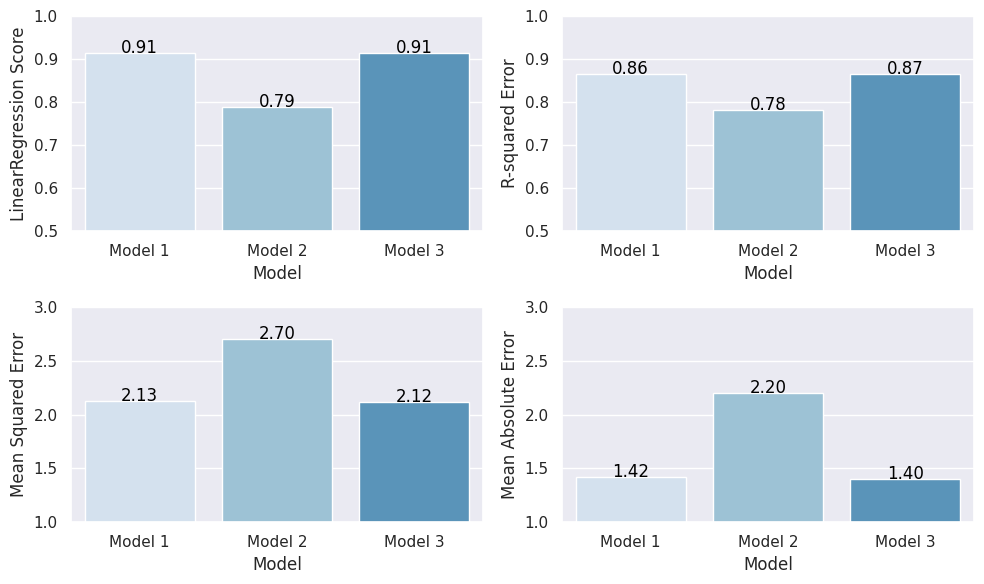

In [ ]:
# Defining the data
scores = [reg_score1, reg_score2, reg_score3]
r_squared_errors = [r2_score1, r2_score2, r2_score3]
mean_squared_errors = [mse1, mse2, mse3]
mean_absolute_errors = [mae1, mae2, mae3]

colors = sns.color_palette('Blues', n_colors = 4)

plt.figure(figsize = (10, 6))

# Creating the bar plot for scores
plt.subplot(2, 2, 1)
sns.barplot(x = ['Model 1', 'Model 2', 'Model 3'], y = scores, palette = colors)
plt.ylim(0.5, 1)
plt.xlabel('Model')
plt.ylabel('LinearRegression Score')
for i, v in enumerate(scores):
    plt.text(i, v, f'{v:.2f}', color='black', ha="center")

# Creating the bar plot for r-squared errors
plt.subplot(2, 2, 2)
sns.barplot(x = ['Model 1', 'Model 2', 'Model 3'], y = r_squared_errors, palette = colors)
plt.ylim(0.5, 1)
plt.xlabel('Model')
plt.ylabel('R-squared Error')
for i, v in enumerate(r_squared_errors):
    plt.text(i, v, f'{v:.2f}', color='black', ha="center")

# Creating the bar plot for mean squared errors
plt.subplot(2, 2, 3)
sns.barplot(x = ['Model 1', 'Model 2', 'Model 3'], y = mean_squared_errors, palette = colors)
plt.ylim(1, 3)
plt.xlabel('Model')
plt.ylabel('Mean Squared Error')
for i, v in enumerate(mean_squared_errors):
    plt.text(i, v, f'{v:.2f}', color='black', ha="center")

# Creating the bar plot for mean absolute errors
plt.subplot(2, 2, 4)
sns.barplot(x = ['Model 1', 'Model 2', 'Model 3'], y = mean_absolute_errors, palette = colors)
plt.ylim(1, 3)
plt.xlabel('Model')
plt.ylabel('Mean Absolute Error')
for i, v in enumerate(mean_absolute_errors):
    plt.text(i, v, f'{v:.2f}', color='black', ha="center")

# Adjust the spacing between subplots
plt.tight_layout()

plt.show()


### Performance of the Linaer Regression Models: 



Linear regression is a statistical method used to find the best model of the  relationship between a dependent variable and one or more independent variables.

We use scatter plot to see the Actual sales and Predicted Sales for all of the three models. The scatter plot displays the actual values along the X-axis and displays the predicted values along the Y-axis. It also displays a line that illustrates the perfect prediction, where the predicted value exactly matches the actual value. A good model will have predicted values close to the actual values, which will result in a scatter plot with points that are clustered tightly around the diagonal line. Here, model 1 and model 3 is better than model 2.

To see any patterns or trends that may be present in those model we use Residual distribution. The Histogram of the Residual can be used to check whether the variance is normally distributed. A symmetric bell-shaped histogram which is evenly distributed around zero indicates that the normality assumption is likely to be true. From Model 2, we can say that the distribution of the residuals is not normally distributed.

A residual plot shows the difference between the measured values and the predicted values against the true values. For model 1 and model 3, the residuals are randomly scattered around zero. It is an indication that the models are performing well.

Based on the performance metrics, it seems that Model 1 and Model 3 are better than Model 2. This is because both Model 1 and Model 3 have higher R-squared scores and lower mean squared error (MSE) and mean absolute error (MAE) values than Model 2. In particular, Model 3 has the highest R-squared score and the lowest MSE and MAE values, suggesting that it is the best performing model among them.

## 1. Provide an overview of the Dataset including the Dataset Characteristics and Exploratory Data Analysis, Data Preprocessing, and performance of different models. 

**Write Here**

- Dataset Characteristics: In this section, we are working with the CIC-IDS2017 dataset, which contains network traffic data for the development and evaluation of intrusion detection systems. The dataset is designed to be representative of modern network traffic and includes more than 2.8 million network packets captured over a period of seven days in a real network environment. The dataset includes normal traffic and seven different attack scenarios: Brute-force, Heartbleed, Botnet, DoS, DDoS, Web attacks and inside infiltration. The dataset is highly imbalanced. The majority of records belongs to the 'Normal' class and relatively few records belongs to the other classes. The dataset consists of 2830743 rows and 79 columns. In these columns, 78 of them are features that are numerical and the label is categorical.

- Exploratory Data Analysis: This dataset have too many duplicate values (308381), which creates bias that is not good for the machine learning model. The missing values are very few comparing the size of the dataset which is only 0.06%. However, we handled them using appropriate methods. 

- Data Preprocessing: We dropped the duplicates and filled the missing values with median and mean. Since we have a very large dataset, the initial memory usage is quite high leading to session crashes. We later worked our way through this by down casting data types based on the min and max values available. We try to reduce the memory usages that is helpful for our model.

- Data Analysis: We took a sample from the population. Later we did some data analysis which consist of plotting various kinds of charts, correlation matrices, etc. to see the relationships between features, types of attacks present in the dataset etc. In our analysis, we noticed there are a good number of features that are strongly, even directly correlated with other features (both positive and negative). This is an issue it introduces multi-collinearity which can highly impact the machine learning models that we will develop later. Also, as the dataset is quite huge and has more than 70 features, it would be extremely difficult to train models using limited resources. In order to overcome this issue, we used PCA (Principal Component Analysis) to reduece dimensions. We played with the number of components to see how much information we can preserve. we monitored the '*explained_variance_ratio_*' to make sure we retain most informations. However, it was a bit challenging to reduce dimensions while preserving the information to train the models.

- ML Models: It is worth mentioning the fact that the following dataset is highly imbalanced. So, we created a balanced dataset out of this with our domain knowledge to train various ML models. Since our dataset is quite large and has a reasonable amount of samples to train and test different ML models using various classification algorithms (Logistic Regression, Support Vector Machine for Binary Classification. Random Forest Classifier, Decision Tree, K Nearest Neighbours, etc). For binary classifications, we trained the models to distinguish between normal traffic and anomalous traffic. This means it will only predict whether an intrusion is taking place or not. Alternatively, using the multi-class classification algorithms, we further extended our prediction capabilities to identify which type of attack or intrusion is taking place. We tried both binary classifications and multi-class classifications to see how the data holds up. Later we cross-validated, evaluated, and compared those models to see which one works better or worse.

- Performance Evaluation: After training multiple machine learning models, we proceeded to evaluate their respective performances. Our evaluation process involved comparing the accuracy, recall, f1-score, and confusion matrix of each model. Through analysis of the results, we were able to see which model performed the best and which performed worse. 

## 2.	Dataset Characteristics and Exploratory Data Analysis

In this section, introduce your dataset. Mention number of rows, columns and other characteristics. Provide the histograms of data distribution and correlations among the variable with a suitable discussion. Try to stand out and be creative. (Add as many cells as you need)

### 2.1 Load, View Data and Show Analysis on Rows and Columns 

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
# Code Here (Add as many cells as you need)
import numpy as np
import pandas as pd
import seaborn as sns
import missingno as msno
sns.set(style='darkgrid')
import matplotlib.pyplot as plt


In [ ]:
# Loading the dataset
data1 = pd.read_csv('/content/drive/MyDrive/MachineLearningCVE/Monday-WorkingHours.pcap_ISCX.csv')
data2 = pd.read_csv('/content/drive/MyDrive/MachineLearningCVE/Tuesday-WorkingHours.pcap_ISCX.csv')
data3 = pd.read_csv('/content/drive/MyDrive/MachineLearningCVE/Wednesday-workingHours.pcap_ISCX.csv')
data4 = pd.read_csv('/content/drive/MyDrive/MachineLearningCVE/Thursday-WorkingHours-Morning-WebAttacks.pcap_ISCX.csv')
data5 = pd.read_csv('/content/drive/MyDrive/MachineLearningCVE/Thursday-WorkingHours-Afternoon-Infilteration.pcap_ISCX.csv')
data6 = pd.read_csv('/content/drive/MyDrive/MachineLearningCVE/Friday-WorkingHours-Morning.pcap_ISCX.csv')
data7 = pd.read_csv('/content/drive/MyDrive/MachineLearningCVE/Friday-WorkingHours-Afternoon-PortScan.pcap_ISCX.csv')
data8 = pd.read_csv('/content/drive/MyDrive/MachineLearningCVE/Friday-WorkingHours-Afternoon-DDos.pcap_ISCX.csv')


In [ ]:
data_list = [data1, data2, data3, data4, data5, data6, data7, data8]

print('Data dimensions: ')
for i, data in enumerate(data_list, start=1):
  rows, cols = data.shape
  print(f'Data{i} -> {rows} rows, {cols} columns')


Data dimensions: 
Data1 -> 529918 rows, 79 columns
Data2 -> 445909 rows, 79 columns
Data3 -> 692703 rows, 79 columns
Data4 -> 170366 rows, 79 columns
Data5 -> 288602 rows, 79 columns
Data6 -> 191033 rows, 79 columns
Data7 -> 286467 rows, 79 columns
Data8 -> 225745 rows, 79 columns


In [ ]:
data = pd.concat(data_list)
rows, cols = data.shape

print('New dimension:')
print(f'Number of rows: {rows}')
print(f'Number of columns: {cols}')
print(f'Total cells: {rows * cols}')


New dimension:
Number of rows: 2830743
Number of columns: 79
Total cells: 223628697


In [ ]:
# Deleting dataframes after concating to save memory
for d in data_list: del d


In [ ]:
# Renaming the columns by removing leading/trailing whitespace
col_names = {col: col.strip() for col in data.columns}
data.rename(columns = col_names, inplace = True)


In [ ]:
data.columns


Index(['Destination Port', 'Flow Duration', 'Total Fwd Packets',
       'Total Backward Packets', 'Total Length of Fwd Packets',
       'Total Length of Bwd Packets', 'Fwd Packet Length Max',
       'Fwd Packet Length Min', 'Fwd Packet Length Mean',
       'Fwd Packet Length Std', 'Bwd Packet Length Max',
       'Bwd Packet Length Min', 'Bwd Packet Length Mean',
       'Bwd Packet Length Std', 'Flow Bytes/s', 'Flow Packets/s',
       'Flow IAT Mean', 'Flow IAT Std', 'Flow IAT Max', 'Flow IAT Min',
       'Fwd IAT Total', 'Fwd IAT Mean', 'Fwd IAT Std', 'Fwd IAT Max',
       'Fwd IAT Min', 'Bwd IAT Total', 'Bwd IAT Mean', 'Bwd IAT Std',
       'Bwd IAT Max', 'Bwd IAT Min', 'Fwd PSH Flags', 'Bwd PSH Flags',
       'Fwd URG Flags', 'Bwd URG Flags', 'Fwd Header Length',
       'Bwd Header Length', 'Fwd Packets/s', 'Bwd Packets/s',
       'Min Packet Length', 'Max Packet Length', 'Packet Length Mean',
       'Packet Length Std', 'Packet Length Variance', 'FIN Flag Count',
       'SYN Flag Co

In [ ]:
data.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 2830743 entries, 0 to 225744
Data columns (total 79 columns):
 #   Column                       Dtype  
---  ------                       -----  
 0   Destination Port             int64  
 1   Flow Duration                int64  
 2   Total Fwd Packets            int64  
 3   Total Backward Packets       int64  
 4   Total Length of Fwd Packets  int64  
 5   Total Length of Bwd Packets  int64  
 6   Fwd Packet Length Max        int64  
 7   Fwd Packet Length Min        int64  
 8   Fwd Packet Length Mean       float64
 9   Fwd Packet Length Std        float64
 10  Bwd Packet Length Max        int64  
 11  Bwd Packet Length Min        int64  
 12  Bwd Packet Length Mean       float64
 13  Bwd Packet Length Std        float64
 14  Flow Bytes/s                 float64
 15  Flow Packets/s               float64
 16  Flow IAT Mean                float64
 17  Flow IAT Std                 float64
 18  Flow IAT Max                 int64  
 19  F

In [ ]:
pd.options.display.max_rows = 80

print('Overview about Columns:')
data.describe().transpose()


Overview about Columns:


,count,mean,std,min,25%,50%,75%,max
Destination Port,2830743.0,8.071483e+03,1.828363e+04,0.000000e+00,53.000000,80.000000,4.430000e+02,6.553500e+04
Flow Duration,2830743.0,1.478566e+07,3.365374e+07,-1.300000e+01,155.000000,31316.000000,3.204828e+06,1.200000e+08
Total Fwd Packets,2830743.0,9.361160e+00,7.496728e+02,1.000000e+00,2.000000,2.000000,5.000000e+00,2.197590e+05
Total Backward Packets,2830743.0,1.039377e+01,9.973883e+02,0.000000e+00,1.000000,2.000000,4.000000e+00,2.919220e+05
Total Length of Fwd Packets,2830743.0,5.493024e+02,9.993589e+03,0.000000e+00,12.000000,62.000000,1.870000e+02,1.290000e+07
Total Length of Bwd Packets,2830743.0,1.616264e+04,2.263088e+06,0.000000e+00,0.000000,123.000000,4.820000e+02,6.554530e+08
Fwd Packet Length Max,2830743.0,2.075999e+02,7.171848e+02,0.000000e+00,6.000000,37.000000,8.100000e+01,2.482000e+04
Fwd Packet Length Min,2830743.0,1.871366e+01,6.033935e+01,0.000000e+00,0.000000,2.000000,3.600000e+01,2.325000e+03
Fwd Packet Length Mean,2830743.0,5.820194e+01,1.860912e+02,0.000000e+00,6.000000,34.000000,5.000000e+01,5.940857e+03
Fwd Packet Length Std,2830743.0,6.891013e+01,2.811871e+02,0.000000e+00,0.000000,0.000000,2.616295e+01,7.125597e+03


In [ ]:
pd.options.display.max_columns = 80
data


,Destination Port,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Max,Bwd Packet Length Min,Bwd Packet Length Mean,Bwd Packet Length Std,Flow Bytes/s,Flow Packets/s,Flow IAT Mean,Flow IAT Std,Flow IAT Max,Flow IAT Min,Fwd IAT Total,Fwd IAT Mean,Fwd IAT Std,Fwd IAT Max,Fwd IAT Min,Bwd IAT Total,Bwd IAT Mean,Bwd IAT Std,Bwd IAT Max,Bwd IAT Min,Fwd PSH Flags,Bwd PSH Flags,Fwd URG Flags,Bwd URG Flags,Fwd Header Length,Bwd Header Length,Fwd Packets/s,Bwd Packets/s,Min Packet Length,Max Packet Length,Packet Length Mean,Packet Length Std,Packet Length Variance,FIN Flag Count,SYN Flag Count,RST Flag Count,PSH Flag Count,ACK Flag Count,URG Flag Count,CWE Flag Count,ECE Flag Count,Down/Up Ratio,Average Packet Size,Avg Fwd Segment Size,Avg Bwd Segment Size,Fwd Header Length.1,Fwd Avg Bytes/Bulk,Fwd Avg Packets/Bulk,Fwd Avg Bulk Rate,Bwd Avg Bytes/Bulk,Bwd Avg Packets/Bulk,Bwd Avg Bulk Rate,Subflow Fwd Packets,Subflow Fwd Bytes,Subflow Bwd Packets,Subflow Bwd Bytes,Init_Win_bytes_forward,Init_Win_bytes_backward,act_data_pkt_fwd,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label
0,49188,4,2,0,12,0,6,6,6.0,0.0,0,0,0.0,0.0,3.000000e+06,5.000000e+05,4.0,0.0,4,4,4,4.0,0.0,4,4,0,0.0,0.0,0,0,0,0,0,0,40,0,5.000000e+05,0.00000,6,6,6.0,0.0,0.0,0,0,0,0,1,1,0,0,0,9.0,6.0,0.0,40,0,0,0,0,0,0,2,12,0,0,329,-1,1,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
1,49188,1,2,0,12,0,6,6,6.0,0.0,0,0,0.0,0.0,1.200000e+07,2.000000e+06,1.0,0.0,1,1,1,1.0,0.0,1,1,0,0.0,0.0,0,0,0,0,0,0,40,0,2.000000e+06,0.00000,6,6,6.0,0.0,0.0,0,0,0,0,1,1,0,0,0,9.0,6.0,0.0,40,0,0,0,0,0,0,2,12,0,0,329,-1,1,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
2,49188,1,2,0,12,0,6,6,6.0,0.0,0,0,0.0,0.0,1.200000e+07,2.000000e+06,1.0,0.0,1,1,1,1.0,0.0,1,1,0,0.0,0.0,0,0,0,0,0,0,40,0,2.000000e+06,0.00000,6,6,6.0,0.0,0.0,0,0,0,0,1,1,0,0,0,9.0,6.0,0.0,40,0,0,0,0,0,0,2,12,0,0,329,-1,1,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
3,49188,1,2,0,12,0,6,6,6.0,0.0,0,0,0.0,0.0,1.200000e+07,2.000000e+06,1.0,0.0,1,1,1,1.0,0.0,1,1,0,0.0,0.0,0,0,0,0,0,0,40,0,2.000000e+06,0.00000,6,6,6.0,0.0,0.0,0,0,0,0,1,1,0,0,0,9.0,6.0,0.0,40,0,0,0,0,0,0,2,12,0,0,329,-1,1,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
4,49486,3,2,0,12,0,6,6,6.0,0.0,0,0,0.0,0.0,4.000000e+06,6.666667e+05,3.0,0.0,3,3,3,3.0,0.0,3,3,0,0.0,0.0,0,0,0,0,0,0,40,0,6.666667e+05,0.00000,6,6,6.0,0.0,0.0,0,0,0,0,1,1,0,0,0,9.0,6.0,0.0,40,0,0,0,0,0,0,2,12,0,0,245,-1,1,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
225740,61374,61,1,1,6,6,6,6,6.0,0.0,6,6,6.0,0.0,1.967213e+05,3.278689e+04,61.0,0.0,61,61,0,0.0,0.0,0,0,0,0.0,0.0,0,0,0,0,0,0,20,20,1.639344e+04,16393.44262,6,6,6.0,0.0,0.0,0,0,0,0,1,1,0,0,1,9.0,6.0,6.0,20,0,0,0,0,0,0,1,6,1,6,288,253,0,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
225741,61378,72,1,1,6,6,6,6,6.0,0.0,6,6,6.0,0.0,1.666667e+05,2.777778e+04,72.0,0.0,72,72,0,0.0,0.0,0,0,0,0.0,0.0,0,0,0,0,0,0,20,20,1.388889e+04,13888.88889,6,6,6.0,0.0,0.0,0,0,0,0,1,1,0,0,1,9.0,6.0,6.0,20,0,0,0,0,0,0,1,6,1,6,288,253,0,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
225742,61375,75,1,1,6,6,6,6,6.0,0.0,6,6,6.0,0.0,1.600000e+05,2.666667e+04,75.0,0.0,75,75,0,0.0,0.0,0,0,0,0.0,0.0,0,0,0,0,0,0,20,20,1.333333e+04,13333.33333,6,6,6.0,0.0,0.0,0,0,0,0,1,1,0,0,1,9.0,6.0,6.0,20,0,0,0,0,0,0,1,6,1,6,288,253,0,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN
225743,61323,48,2,0,12,0,6,6,6.0,0.0,0,0,0.0,0.0,2.500000e+05,4.166667e+04,48.0,0.0,48,48,48,48.0,0.0,48,48,0,0.0,0.0,0,0,0,0,0,0,40,0,4.166667e+04,0.00000,6,6,6.0,0.0,0.0,0,0,0,0,1,0,0,0,0,9.0,6.0,0.0,40,0,0,0,0,0,0,2,12,0,0,4719,-1,1,20,0.0,0.0,0,0,0.0,0.0,0,0,BENIGN


### 2.2 Data Cleaning









#### Identifying duplicate values


In [ ]:
# Code Here (Add as many cells as you need)
dups = data[data.duplicated()]
print(f'Number of duplicates: {len(dups)}')


Number of duplicates: 308381


In [ ]:
data.drop_duplicates(inplace = True)
data.shape


(2522362, 79)

#### Identifying missing values


In [ ]:
# Code Here (Add as many cells as you need)
missing_val = data.isna().sum()
print(missing_val.loc[missing_val > 0])


Flow Bytes/s    353
dtype: int64


In [ ]:
# Checking for infinity values
numeric_cols = data.select_dtypes(include = np.number).columns
inf_count = np.isinf(data[numeric_cols]).sum()
print(inf_count[inf_count > 0])


Flow Bytes/s      1211
Flow Packets/s    1564
dtype: int64


In [ ]:
# Replacing any infinite values (positive or negative) with NaN (not a number)
print(f'Initial missing values: {data.isna().sum().sum()}')

data.replace([np.inf, -np.inf], np.nan, inplace = True)

print(f'Missing values after processing infinite values: {data.isna().sum().sum()}')


Initial missing values: 353
Missing values after processing infinite values: 3128


In [ ]:
missing = data.isna().sum()
print(missing.loc[missing > 0])


Flow Bytes/s      1564
Flow Packets/s    1564
dtype: int64


In [ ]:
# Calculating missing value percentage in the dataset
mis_per = (missing / len(data)) * 100
mis_table = pd.concat([missing, mis_per.round(2)], axis = 1)
mis_table = mis_table.rename(columns = {0 : 'Missing Values', 1 : 'Percentage of Total Values'})

print(mis_table.loc[mis_per > 0])


                Missing Values  Percentage of Total Values
Flow Bytes/s              1564                        0.06
Flow Packets/s            1564                        0.06


#### Visualisation of missing data


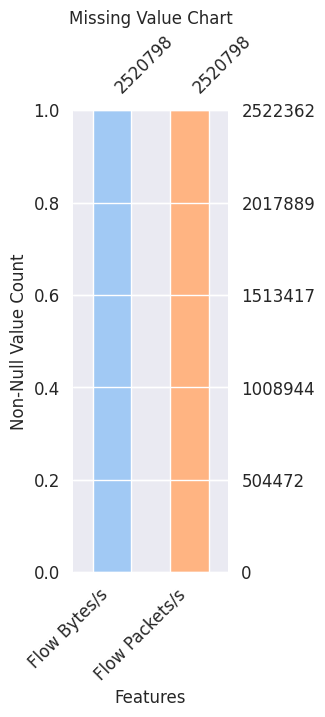

In [ ]:
sns.set_palette('pastel')
colors = sns.color_palette()

missing_vals = [col for col in data.columns if data[col].isna().any()]

fig, ax = plt.subplots(figsize = (2, 6))
msno.bar(data[missing_vals], ax = ax, fontsize = 12, color = colors)
ax.set_xlabel('Features', fontsize = 12)
ax.set_ylabel('Non-Null Value Count', fontsize = 12)
ax.set_title('Missing Value Chart', fontsize = 12)
plt.show()


#### Dealing with missing values (How would you deal with missing values?) (Columns with missing data)



1.   Do analysis using plots

2.   Provide an appropriate discussion




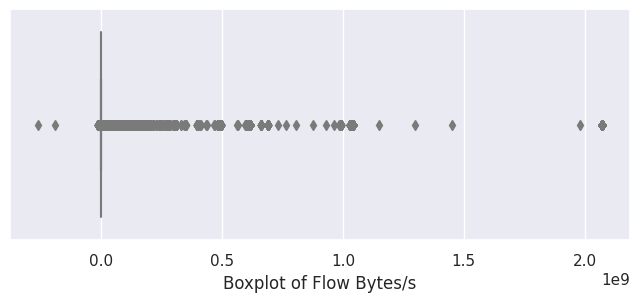

In [ ]:
# Code Here (Add as many cells as you need)
plt.figure(figsize = (8, 3))
sns.boxplot(x = data['Flow Bytes/s'])
plt.xlabel('Boxplot of Flow Bytes/s')
plt.show()


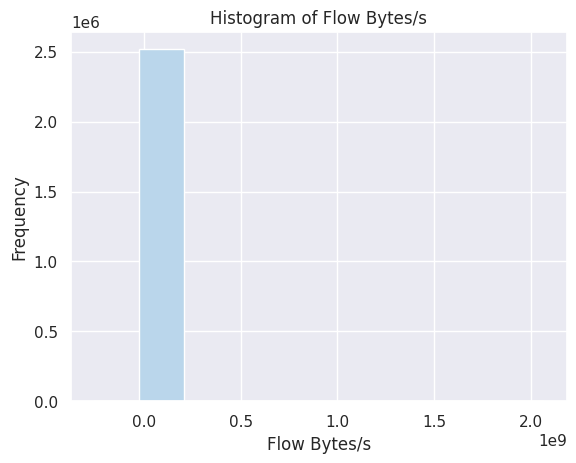

In [ ]:
colors = sns.color_palette('Blues')
plt.hist(data['Flow Bytes/s'], color = colors[1])
plt.title('Histogram of Flow Bytes/s')
plt.xlabel('Flow Bytes/s')
plt.ylabel('Frequency')
plt.show()


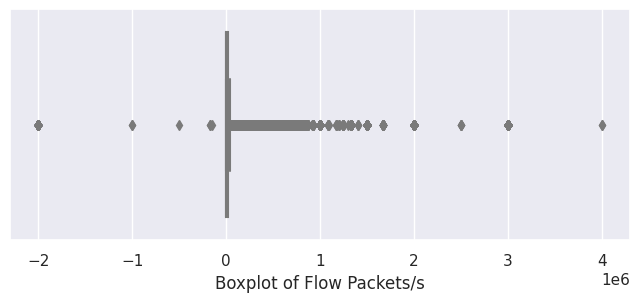

In [ ]:
plt.figure(figsize = (8,3))
sns.boxplot(x = data['Flow Packets/s'])
plt.xlabel('Boxplot of Flow Packets/s')
plt.show()


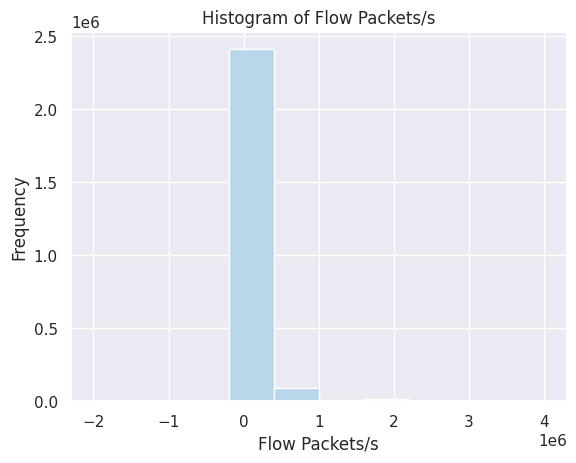

In [ ]:
plt.hist(data['Flow Packets/s'], color = colors[1])
plt.title('Histogram of Flow Packets/s')
plt.xlabel('Flow Packets/s')
plt.ylabel('Frequency')
plt.show()


In [ ]:
med_flow_bytes = data['Flow Bytes/s'].median()
med_flow_packets = data['Flow Packets/s'].median()

print('Median of Flow Bytes/s: ', med_flow_bytes)
print('Median of Flow Packets/s: ', med_flow_packets)


Median of Flow Bytes/s:  3715.0378579999997
Median of Flow Packets/s:  69.742244285


In [ ]:
# Filling missing values with median
data['Flow Bytes/s'].fillna(med_flow_bytes, inplace = True)
data['Flow Packets/s'].fillna(med_flow_packets, inplace = True)


In [ ]:
print('Number of \'Flow Bytes/s\' missing values:', data['Flow Bytes/s'].isna().sum())
print('Number of \'Flow Packets/s\' missing values:', data['Flow Packets/s'].isna().sum())


Number of 'Flow Bytes/s' missing values: 0
Number of 'Flow Packets/s' missing values: 0


Flow Bytes/s and Flow Packets/s are continuous variables. We can see from the Flow Bytes/s and Flow Packets/s histogram and box plot that the majority of values are towards one area which indicates that the data is not normally distributed. The box plot of the Flow Bytes/s and Flow Packets/s shows that the variables have extreme values or outliers. So our strategy is to fill in missing values with median value. Because, filling the missing values with the median does not introduce any new categories or disrupt the distribution of the data.

### 2.3 Analysing Patterns using Visualisations

#### Visualization of column correlation. Also, plot Heat Map

In [ ]:
# Code Here (Add as many cells as you need)
data['Label'].unique()


array(['BENIGN', 'FTP-Patator', 'SSH-Patator', 'DoS slowloris',
       'DoS Slowhttptest', 'DoS Hulk', 'DoS GoldenEye', 'Heartbleed',
       'Web Attack � Brute Force', 'Web Attack � XSS',
       'Web Attack � Sql Injection', 'Infiltration', 'Bot', 'PortScan',
       'DDoS'], dtype=object)

In [ ]:
# Types of attacks & normal instances (BENIGN)
data['Label'].value_counts()


BENIGN                        2096484
DoS Hulk                       172849
DDoS                           128016
PortScan                        90819
DoS GoldenEye                   10286
FTP-Patator                      5933
DoS slowloris                    5385
DoS Slowhttptest                 5228
SSH-Patator                      3219
Bot                              1953
Web Attack � Brute Force         1470
Web Attack � XSS                  652
Infiltration                       36
Web Attack � Sql Injection         21
Heartbleed                         11
Name: Label, dtype: int64

In [ ]:
# Creating a dictionary that maps each label to its attack type
attack_map = {
    'BENIGN': 'BENIGN',
    'DoS Hulk': 'DoS',
    'DDoS': 'DDoS',
    'DoS GoldenEye': 'DoS',
    'DoS slowloris': 'DoS',
    'DoS Slowhttptest': 'DoS',
    'PortScan': 'Port scan',
    'FTP-Patator': 'Brute-Force',
    'SSH-Patator': 'Brute-Force',
    'Bot': 'Bot',
    'Web Attack � Brute Force': 'Web attacks',
    'Web Attack � XSS': 'Web attacks',
    'Web Attack � Sql Injection': 'Web attacks',
    'Infiltration': 'Infiltration',
    'Heartbleed': 'Heartbleed'
}

# Creating a new column 'Attack Type' in the DataFrame based on the attack_map dictionary
data['Attack Type'] = data['Label'].map(attack_map)


In [ ]:
data['Attack Type'].value_counts()


BENIGN          2096484
DoS              193748
DDoS             128016
Port scan         90819
Brute-Force        9152
Web attacks        2143
Bot                1953
Infiltration         36
Heartbleed           11
Name: Attack Type, dtype: int64

In [ ]:
data.drop('Label', axis = 1, inplace = True)


In [ ]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
data['Attack Number'] = le.fit_transform(data['Attack Type'])

print(data['Attack Number'].unique())


[0 2 4 5 8 6 1 7 3]


In [ ]:
# Printing corresponding attack type for each encoded value
encoded_values = data['Attack Number'].unique()
for val in sorted(encoded_values):
    print(f"{val}: {le.inverse_transform([val])[0]}")


0: BENIGN
1: Bot
2: Brute-Force
3: DDoS
4: DoS
5: Heartbleed
6: Infiltration
7: Port scan
8: Web attacks


In [ ]:
corr = data.corr(numeric_only = True).round(2)
corr.style.background_gradient(cmap = 'coolwarm', axis = None).format(precision = 2)


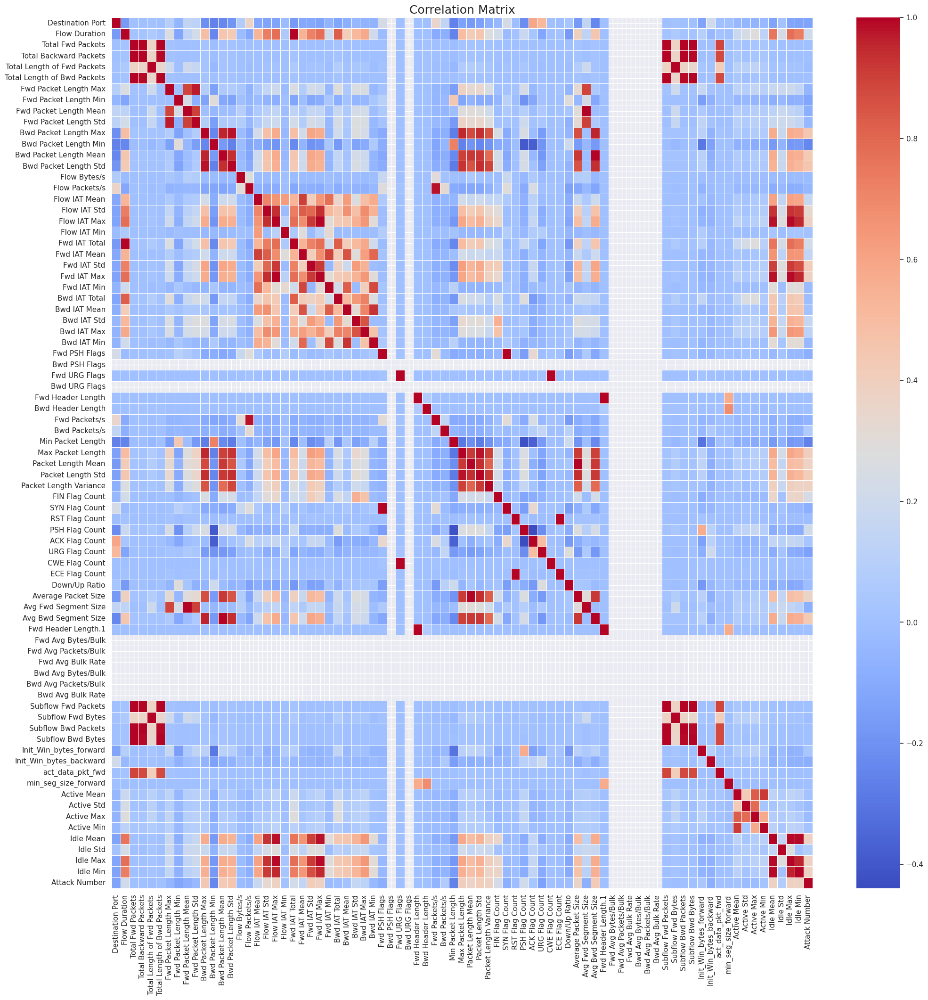

In [ ]:
fig, ax = plt.subplots(figsize = (24, 24))
sns.heatmap(corr, cmap = 'coolwarm', annot = False, linewidth = 0.5)
plt.title('Correlation Matrix', fontsize = 18)
plt.show()


In [ ]:
# Selecting positive correlation features for 'Attack Number'
pos_corr_features = corr['Attack Number'][(corr['Attack Number'] > 0) & (corr['Attack Number'] < 1)].index.tolist()

print("Features with positive correlation with 'Attack Number':\n")
for i, feature in enumerate(pos_corr_features, start = 1):
    corr_value = corr.loc[feature, 'Attack Number']
    print('{:<3} {:<24} :{}'.format(f'{i}.', feature, corr_value))


Features with positive correlation with 'Attack Number':

1.  Flow Duration            :0.21
2.  Bwd Packet Length Max    :0.44
3.  Bwd Packet Length Mean   :0.43
4.  Bwd Packet Length Std    :0.45
5.  Flow IAT Mean            :0.17
6.  Flow IAT Std             :0.33
7.  Flow IAT Max             :0.38
8.  Flow IAT Min             :0.01
9.  Fwd IAT Total            :0.22
10. Fwd IAT Mean             :0.15
11. Fwd IAT Std              :0.41
12. Fwd IAT Max              :0.38
13. Bwd IAT Mean             :0.01
14. Bwd IAT Std              :0.16
15. Bwd IAT Max              :0.12
16. Bwd Packets/s            :0.07
17. Max Packet Length        :0.4
18. Packet Length Mean       :0.37
19. Packet Length Std        :0.41
20. Packet Length Variance   :0.38
21. FIN Flag Count           :0.23
22. PSH Flag Count           :0.21
23. ACK Flag Count           :0.03
24. Average Packet Size      :0.36
25. Avg Bwd Segment Size     :0.43
26. Init_Win_bytes_forward   :0.04
27. Active Mean              :0.0

In [ ]:
print(f'Number of considerable important features: {len(pos_corr_features)}')


Number of considerable important features: 32


In [ ]:
# Checking for columns with zero standard deviation (the blank squares in the heatmap)
std = data.std(numeric_only = True)
zero_std_cols = std[std == 0].index.tolist()
zero_std_cols


['Bwd PSH Flags',
 'Bwd URG Flags',
 'Fwd Avg Bytes/Bulk',
 'Fwd Avg Packets/Bulk',
 'Fwd Avg Bulk Rate',
 'Bwd Avg Bytes/Bulk',
 'Bwd Avg Packets/Bulk',
 'Bwd Avg Bulk Rate']

The columns with zero standard deviation have the same value in all rows. These columns don't have any variance. It simply means that there is no meaningful relationship with any other columns. These columns cannot help differentiate between the classes or groups of data. So, these zero standard deviation columns don't contribute to the correlation matrix and will appear blank in the heatmap. 

This can be helpful while doing data processing as we may drop the columns if we find out that these columns has no variation.

#### Visualization of Linear Relationships of columns (Continuous Numerical Variables)

In [ ]:
# Printing the unique value count
indent = '{:<3} {:<30}: {}'
print('Unique value count for: ')
for i, feature in enumerate(list(data.columns)[:-1], start = 1):
    print(indent.format(f'{i}.', feature, data[feature].nunique()))


Unique value count for: 
1.  Destination Port              : 53805
2.  Flow Duration                 : 1050899
3.  Total Fwd Packets             : 1432
4.  Total Backward Packets        : 1747
5.  Total Length of Fwd Packets   : 17928
6.  Total Length of Bwd Packets   : 64698
7.  Fwd Packet Length Max         : 5279
8.  Fwd Packet Length Min         : 384
9.  Fwd Packet Length Mean        : 99716
10. Fwd Packet Length Std         : 253909
11. Bwd Packet Length Max         : 4838
12. Bwd Packet Length Min         : 583
13. Bwd Packet Length Mean        : 147614
14. Bwd Packet Length Std         : 248869
15. Flow Bytes/s                  : 1593908
16. Flow Packets/s                : 1240164
17. Flow IAT Mean                 : 1166311
18. Flow IAT Std                  : 1056642
19. Flow IAT Max                  : 580289
20. Flow IAT Min                  : 136316
21. Fwd IAT Total                 : 493098
22. Fwd IAT Mean                  : 737737
23. Fwd IAT Std                   : 700313

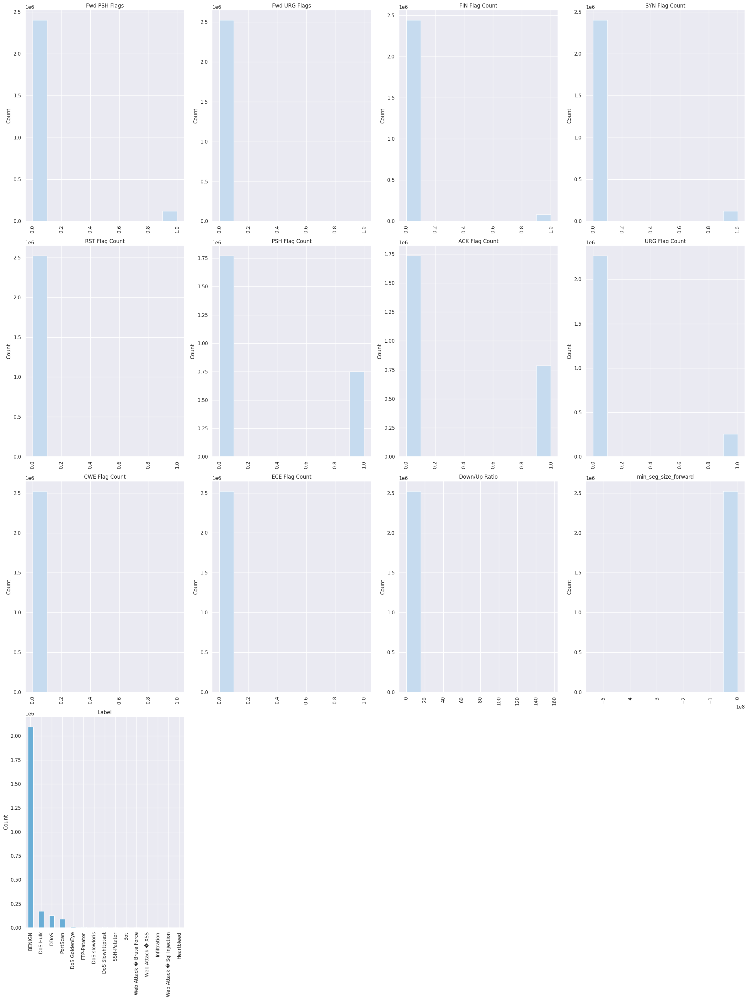

In [ ]:
# Generating a set of visualizations for columns that have more than one unique value but less than 50 unique values
# For categorical columns, a bar plot is generated showing the count of each unique value
# For numerical columns, a histogram is generated
unique_values = data.nunique()
selected_cols = data[[col for col in data if 1 < unique_values[col] < 50]]
rows, cols = selected_cols.shape
col_names = list(selected_cols)
num_of_rows = (cols + 3) // 4

color_palette = sns.color_palette('Blues', n_colors = 3)
plt.figure(figsize = (6 * 4, 8 * num_of_rows))

for i in range(cols):
    plt.subplot(num_of_rows, 4, i + 1)
    col_data = selected_cols.iloc[:, i]
    if col_data.dtype.name == 'object':
        col_data.value_counts().plot(kind='bar', color = color_palette[1])
    else:
        col_data.hist(color = color_palette[0])

    plt.ylabel('Count')
    plt.xticks(rotation = 90)
    plt.title(col_names[i])

plt.tight_layout()
plt.show()


In [ ]:
# Data sampling
sample_size = int(0.2 * len(data)) # 20% of the original size
sampled_data = data.sample(n = sample_size, replace = False, random_state = 0)
sampled_data.shape


(504472, 80)

In [ ]:
# To assess if a sample is representative of the population and comparison of descriptive statistics (mean)
numeric_cols = data.select_dtypes(include = [np.number]).columns.tolist()
print('Descriptive Statistics Comparison (mean):\n')
print('{:<32s}{:<22s}{:<22s}{}'.format('Feature', 'Original Dataset', 'Sampled Dataset', 'Variation Percentage'))
print('-' * 96)

high_variations = []
for col in numeric_cols:
    old = data[col].describe()[1]
    new = sampled_data[col].describe()[1]
    if old == 0:
        pct = 0
    else:
        pct = abs((new - old) / old)
    if pct * 100 > 5:
        high_variations.append((col, pct * 100))
    print('{:<32s}{:<22.6f}{:<22.6f}{:<2.2%}'.format(col, old, new, pct))


Descriptive Statistics Comparison (mean):

Feature                         Original Dataset      Sampled Dataset       Variation Percentage
------------------------------------------------------------------------------------------------
Destination Port                8704.762165           8686.623973           0.21%
Flow Duration                   16581323.773163       16502842.174093       0.47%
Total Fwd Packets               10.276271             12.078062             17.53%
Total Backward Packets          11.565964             13.914412             20.30%
Total Length of Fwd Packets     611.575108            601.844586            1.59%
Total Length of Bwd Packets     18133.153930          24424.988089          34.70%
Fwd Packet Length Max           231.091768            230.009202            0.47%
Fwd Packet Length Min           19.194641             19.036484             0.82%
Fwd Packet Length Mean          63.470104             63.151403             0.50%
Fwd Packet Length Std 

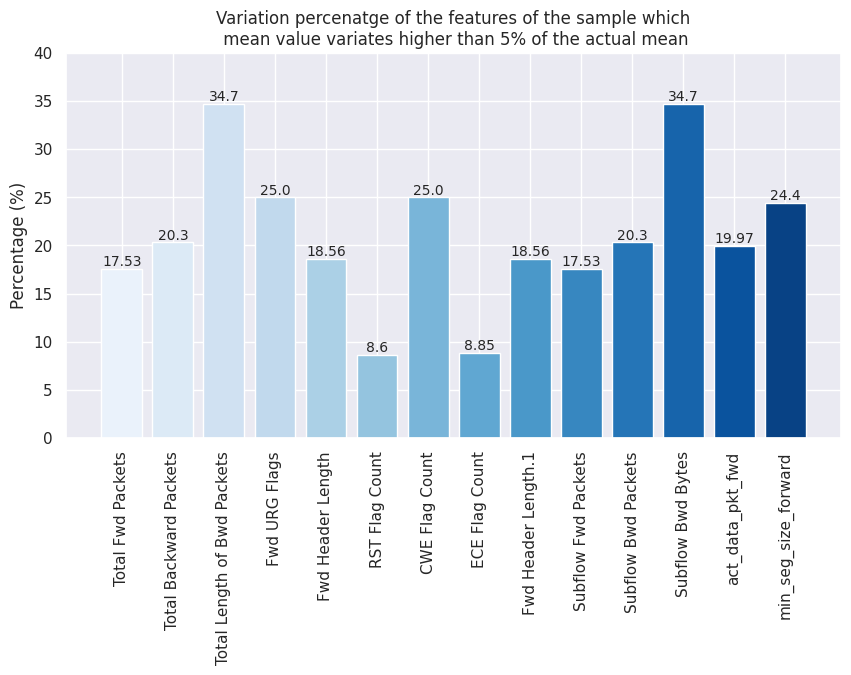

In [ ]:
labels = [t[0] for t in high_variations]
values = [t[1] for t in high_variations]

colors = sns.color_palette('Blues', n_colors=len(labels))
fig, ax = plt.subplots(figsize=(10, 5))
ax.bar(labels, values, color = colors)

for i in range(len(labels)):
    ax.text(i, values[i], str(round(values[i], 2)), ha = 'center', va = 'bottom', fontsize = 10)

plt.xticks(rotation = 90)
ax.set_title('Variation percenatge of the features of the sample which\n mean value variates higher than 5% of the actual mean')
ax.set_ylabel('Percentage (%)')
ax.set_yticks(np.arange(0, 41, 5))
plt.show()


In [ ]:
# Correlation matrix for sampled data
corr_matrix = sampled_data.corr(numeric_only = True).round(2)
corr_matrix.style.background_gradient(cmap = 'coolwarm', axis = None).format(precision = 2)


,Destination Port,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Max,Bwd Packet Length Min,Bwd Packet Length Mean,Bwd Packet Length Std,Flow Bytes/s,Flow Packets/s,Flow IAT Mean,Flow IAT Std,Flow IAT Max,Flow IAT Min,Fwd IAT Total,Fwd IAT Mean,Fwd IAT Std,Fwd IAT Max,Fwd IAT Min,Bwd IAT Total,Bwd IAT Mean,Bwd IAT Std,Bwd IAT Max,Bwd IAT Min,Fwd PSH Flags,Bwd PSH Flags,Fwd URG Flags,Bwd URG Flags,Fwd Header Length,Bwd Header Length,Fwd Packets/s,Bwd Packets/s,Min Packet Length,Max Packet Length,Packet Length Mean,Packet Length Std,Packet Length Variance,FIN Flag Count,SYN Flag Count,RST Flag Count,PSH Flag Count,ACK Flag Count,URG Flag Count,CWE Flag Count,ECE Flag Count,Down/Up Ratio,Average Packet Size,Avg Fwd Segment Size,Avg Bwd Segment Size,Fwd Header Length.1,Fwd Avg Bytes/Bulk,Fwd Avg Packets/Bulk,Fwd Avg Bulk Rate,Bwd Avg Bytes/Bulk,Bwd Avg Packets/Bulk,Bwd Avg Bulk Rate,Subflow Fwd Packets,Subflow Fwd Bytes,Subflow Bwd Packets,Subflow Bwd Bytes,Init_Win_bytes_forward,Init_Win_bytes_backward,act_data_pkt_fwd,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Attack Number
Destination Port,1.00,-0.17,-0.00,-0.00,0.02,-0.00,0.09,-0.05,0.14,0.12,-0.21,-0.26,-0.24,-0.19,0.07,0.36,-0.11,-0.13,-0.13,-0.02,-0.17,-0.11,-0.11,-0.13,-0.05,-0.12,-0.07,-0.04,-0.06,-0.05,0.23,nan,0.01,nan,0.00,0.00,0.35,0.15,-0.26,-0.14,-0.17,-0.14,-0.08,-0.04,0.23,-0.01,-0.22,0.58,0.52,0.01,-0.01,0.03,-0.17,0.14,-0.24,0.00,nan,nan,nan,nan,nan,nan,-0.00,0.02,-0.00,-0.00,-0.13,0.21,-0.00,0.00,-0.04,-0.05,-0.06,-0.03,-0.13,0.01,-0.12,-0.13,-0.12
Flow Duration,-0.17,1.00,0.02,0.02,0.10,0.02,0.27,-0.12,0.14,0.23,0.49,-0.24,0.45,0.43,-0.02,-0.11,0.54,0.74,0.78,0.06,1.00,0.54,0.72,0.78,0.21,0.82,0.41,0.52,0.58,0.21,-0.02,nan,-0.00,nan,-0.00,0.00,-0.10,-0.08,-0.25,0.50,0.42,0.45,0.27,0.22,-0.02,0.01,0.18,0.04,-0.12,-0.00,0.01,-0.17,0.40,0.14,0.45,-0.00,nan,nan,nan,nan,nan,nan,0.02,0.10,0.02,0.02,0.09,-0.03,0.02,-0.00,0.19,0.25,0.29,0.12,0.76,0.24,0.78,0.73,0.21
Total Fwd Packets,-0.00,0.02,1.00,1.00,0.69,0.99,0.01,-0.00,-0.00,0.00,0.03,-0.01,0.02,0.01,0.00,-0.00,-0.00,-0.00,0.00,-0.00,0.02,-0.00,-0.00,0.00,-0.00,0.02,-0.00,-0.00,0.00,-0.00,0.00,nan,-0.00,nan,0.00,0.02,-0.00,-0.00,-0.01,0.03,0.03,0.01,0.01,-0.00,0.00,-0.00,0.01,0.00,-0.00,-0.00,-0.00,0.00,0.02,-0.00,0.02,0.00,nan,nan,nan,nan,nan,nan,1.00,0.69,1.00,0.99,0.00,-0.00,0.87,-0.00,0.12,0.01,0.08,0.13,0.00,0.00,0.00,0.00,-0.00
Total Backward Packets,-0.00,0.02,1.00,1.00,0.68,0.99,0.01,-0.00,-0.00,0.00,0.03,-0.01,0.02,0.01,0.00,-0.00,-0.00,-0.00,0.00,-0.00,0.02,-0.00,-0.00,0.00,-0.00,0.02,-0.00,-0.00,0.00,-0.00,0.00,nan,-0.00,nan,0.00,0.02,-0.00,-0.00,-0.01,0.03,0.03,0.01,0.01,-0.00,0.00,-0.00,0.01,0.00,-0.00,-0.00,-0.00,0.00,0.03,-0.00,0.02,0.00,nan,nan,nan,nan,nan,nan,1.00,0.68,1.00,0.99,0.00,-0.00,0.86,0.00,0.12,0.01,0.08,0.13,0.00,0.00,0.00,0.00,-0.00
Total Length of Fwd Packets,0.02,0.10,0.69,0.68,1.00,0.69,0.31,-0.00,0.29,0.25,0.04,-0.05,0.03,0.01,0.00,-0.02,0.01,0.02,0.04,-0.00,0.10,0.01,0.04,0.04,-0.01,0.12,0.01,0.06,0.07,-0.01,0.01,nan,-0.00,nan,-0.00,0.01,-0.02,-0.02,-0.05,0.12,0.13,0.09,0.06,-0.01,0.01,0.01,0.07,-0.01,-0.01,-0.00,0.01,-0.02,0.12,0.29,0.03,-0.00,nan,nan,nan,nan,nan,nan,0.69,1.00,0.68,0.69,0.05,0.01,0.78,-0.00,0.19,0.12,0.19,0.16,0.03,0.04,0.04,0.03,-0.03
Total Length of Bwd Packets,-0.00,0.02,0.99,0.99,0.69,1.00,0.01,-0.00,-0.00,-0.00,0.03,-0.00,0.02,0.01,0.00,-0.00,-0.00,-0.00,0.00,-0.00,0.02,-0.00,-0.00,-0.00,-0.00,0.02,-0.00,-0.00,0.00,-0.00,0.00,nan,-0.00,nan,0.00,0.02,-0.00,-0.00,-0.01,0.03,0.03,0.01,0.01,-0.00,0.00,-0.00,0.00,0.00,-0.00,-0.00,-0.00,0.00,0.02,-0.00,0.02,0.00,nan,nan,nan,nan,nan,nan,0.99,0.69,0.99,1.00,0.00,-0.00,0.88,0.00,0.11,0.00,0.07,0.13,0.00,-0.00,0.00,0.00,-0.00
Fwd Packet Length Max,0.09,0.27,0.01,0.01,0.31,0.01,1.00,-0.01,0.

In [ ]:
# Plotting the pairs of strongly positive correlated features in the sampled_data that have a correlation coefficient of 0.85 or higher
cols = list(sampled_data.columns)[:-2]
high_corr_pairs = []
corr_th = 0.85

for i in range(len(cols)):
  for j in range(i + 1, len(cols)):
    val = sampled_data[cols[i]].corr(sampled_data[cols[j]])
    # If the correlation coefficient is NaN or below the threshold, skip to the next pair
    if np.isnan(val) or val < corr_th:
      continue
    high_corr_pairs.append((val, cols[i], cols[j]))

size, cols = len(high_corr_pairs), 4
rows, rem =  size // cols, size % cols
if rem:
  rows += 1

fig, axs = plt.subplots(rows, cols, figsize = (24, int(size * 1.7)))
for i in range(rows):
    for j in range(cols):
      try:
        val, x, y = high_corr_pairs[i * cols + j]
        if val > 0.99:
          axs[i, j].scatter(sampled_data[x], sampled_data[y], color = 'green', alpha = 0.1)
        else:
          axs[i, j].scatter(sampled_data[x], sampled_data[y], color = 'blue', alpha = 0.1)
        axs[i, j].set_xlabel(x)
        axs[i, j].set_ylabel(y)
        axs[i, j].set_title(f'{x} vs\n{y} ({val:.2f})')
      except IndexError:
        fig.delaxes(axs[i, j])

fig.tight_layout()
plt.show()


#### Visualization of column relationships (Categorical Variables)



1.   Comparing two columns using different types of plots
2.   Comparing multiple columns using different types of plots



**All the features in our dataset is numerical. We have one Categorical Variable 'Label'**

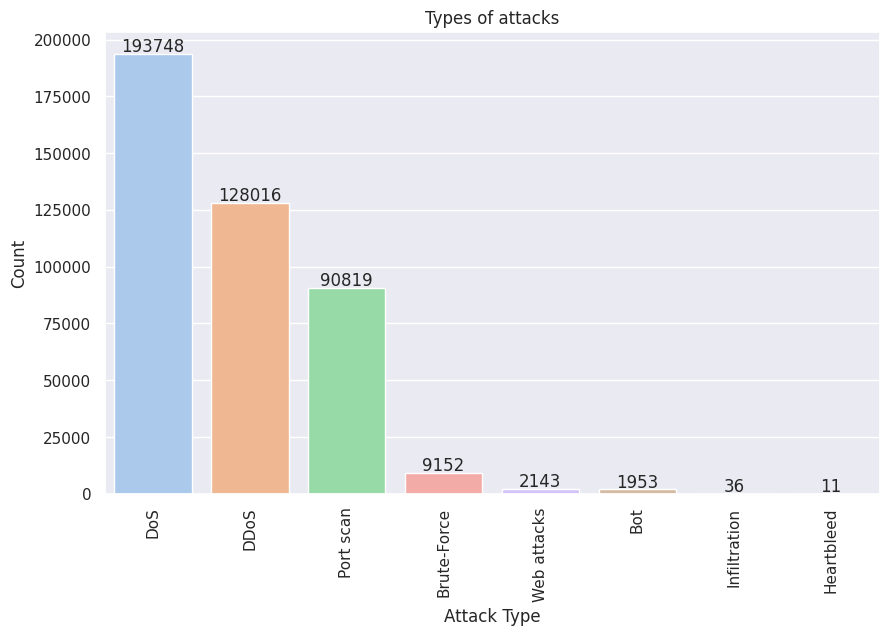

In [ ]:
attacks = data.loc[data['Attack Type'] != 'BENIGN']

plt.figure(figsize = (10, 6))
ax = sns.countplot(x = 'Attack Type', data = attacks, palette = 'pastel', order = attacks['Attack Type'].value_counts().index)
plt.title('Types of attacks')
plt.xlabel('Attack Type')
plt.ylabel('Count')
plt.xticks(rotation = 90)

for p in ax.patches:
    ax.annotate(f'{p.get_height():.0f}', (p.get_x() + p.get_width() / 2, p.get_height() + 1000), ha = 'center')

plt.show()


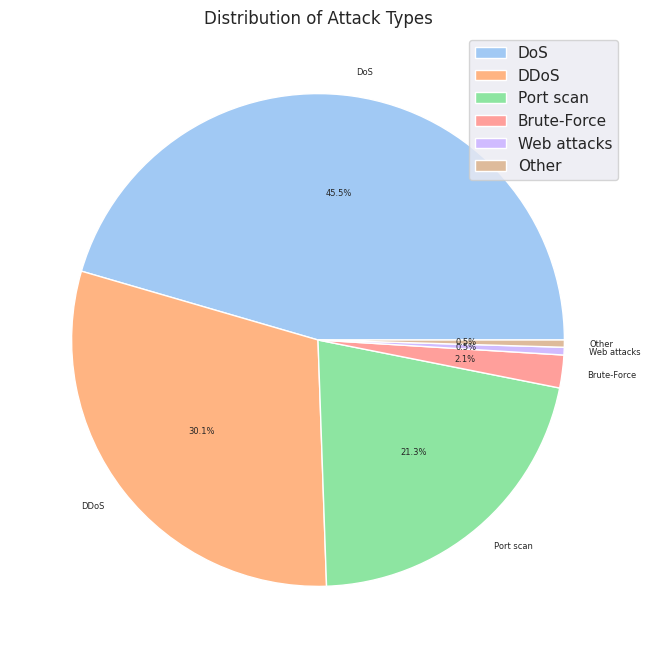

In [ ]:
attack_counts = attacks['Attack Type'].value_counts()
threshold = 0.005
percentages = attack_counts / attack_counts.sum()
small_slices = percentages[percentages < threshold].index.tolist()
attack_counts['Other'] = attack_counts[small_slices].sum()
attack_counts.drop(small_slices, inplace = True)

sns.set_palette('pastel')
plt.figure(figsize = (8, 8))
plt.pie(attack_counts.values, labels = attack_counts.index, autopct = '%1.1f%%', textprops={'fontsize': 6})
plt.title('Distribution of Attack Types')
plt.legend(attack_counts.index, loc = 'best')
plt.show()


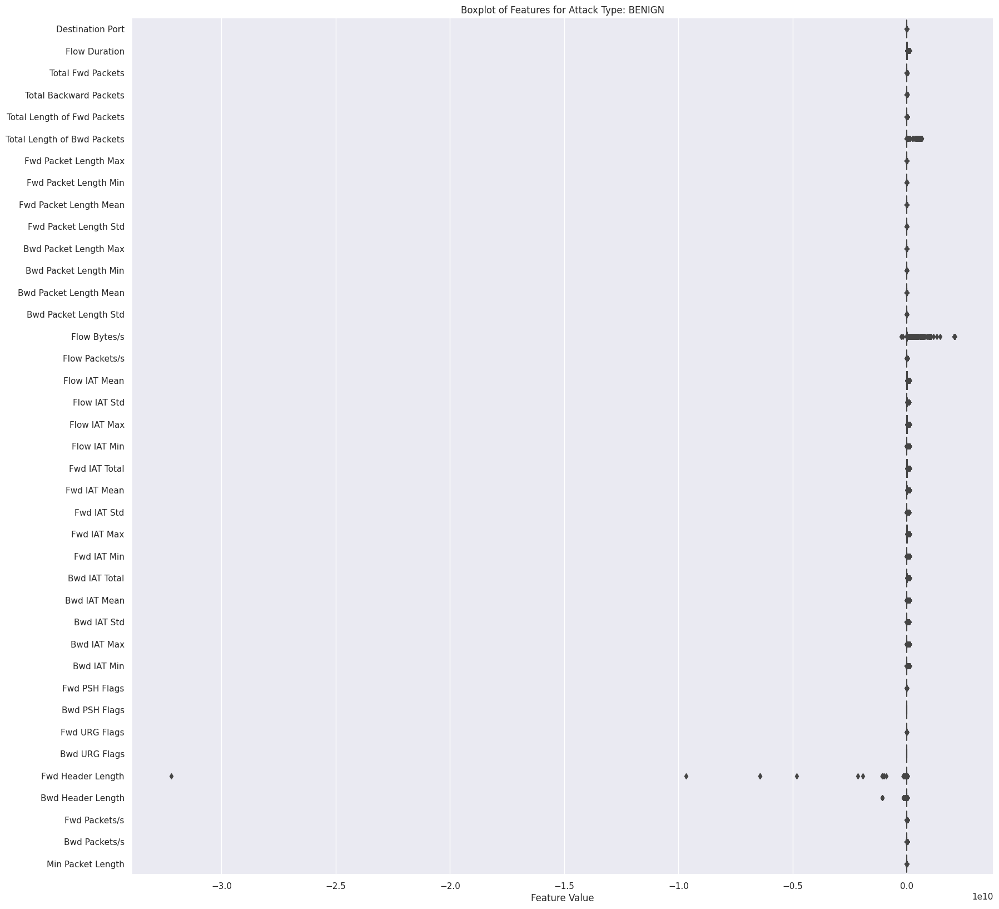

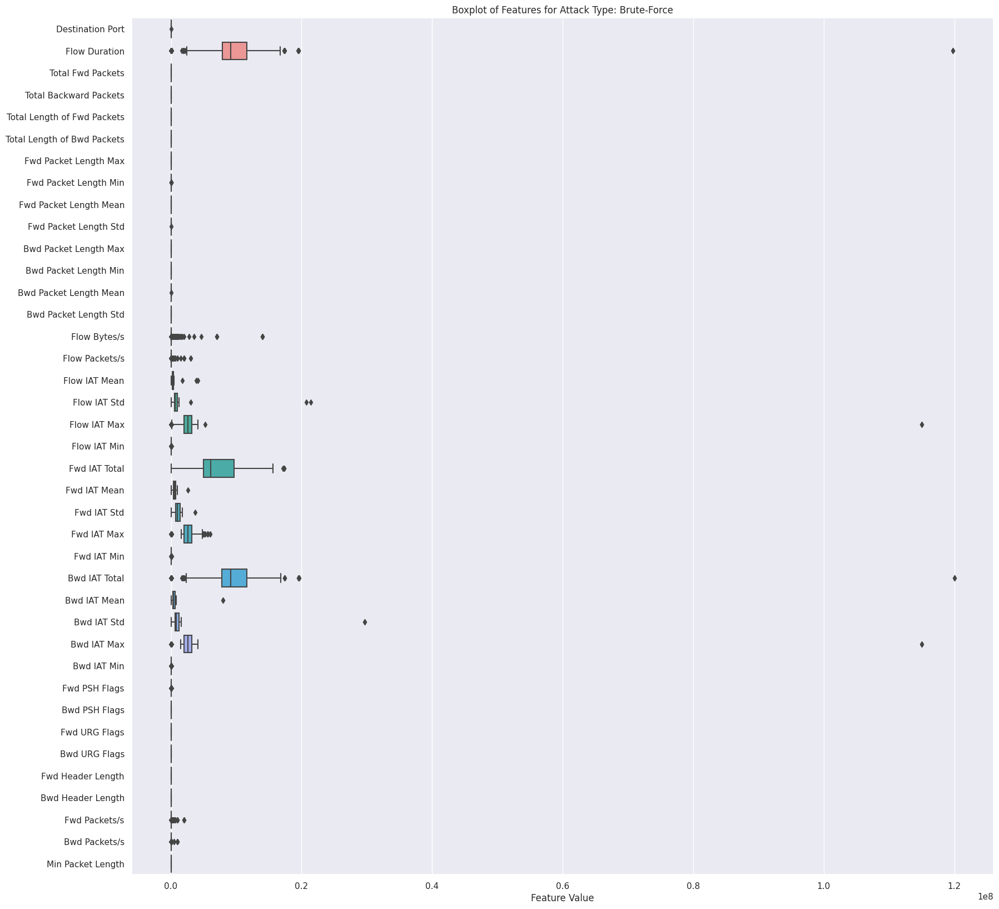

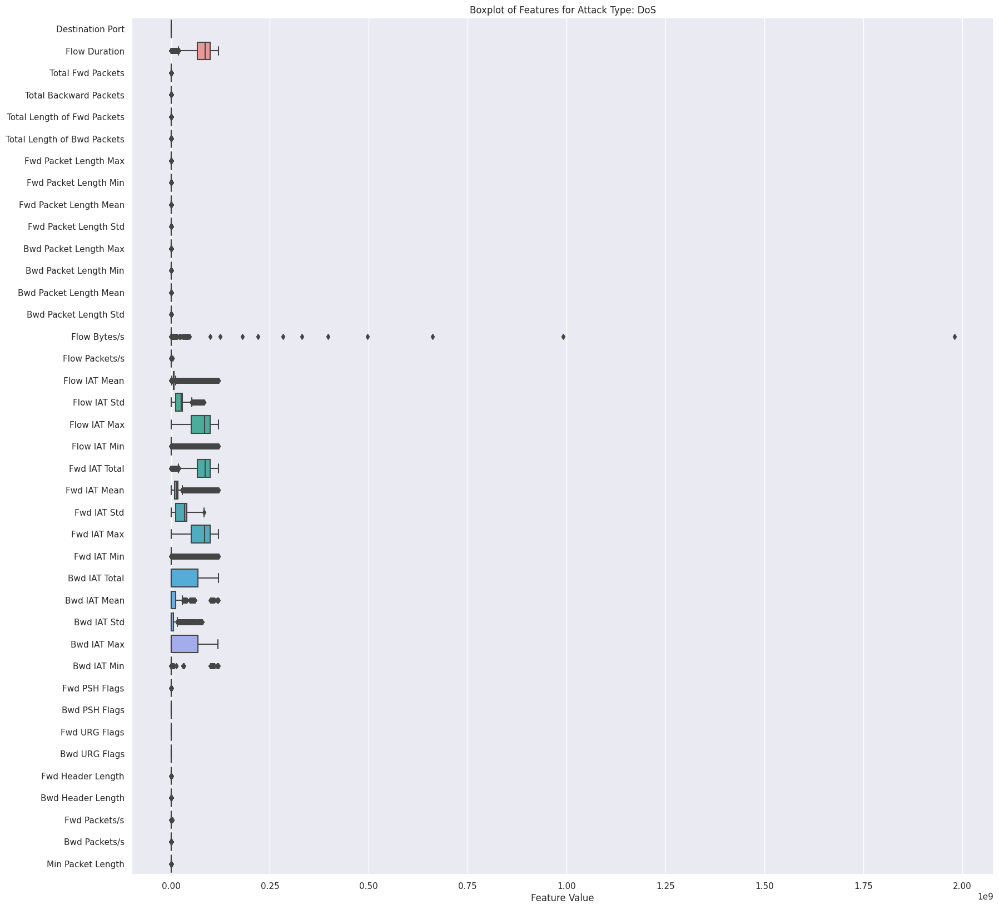

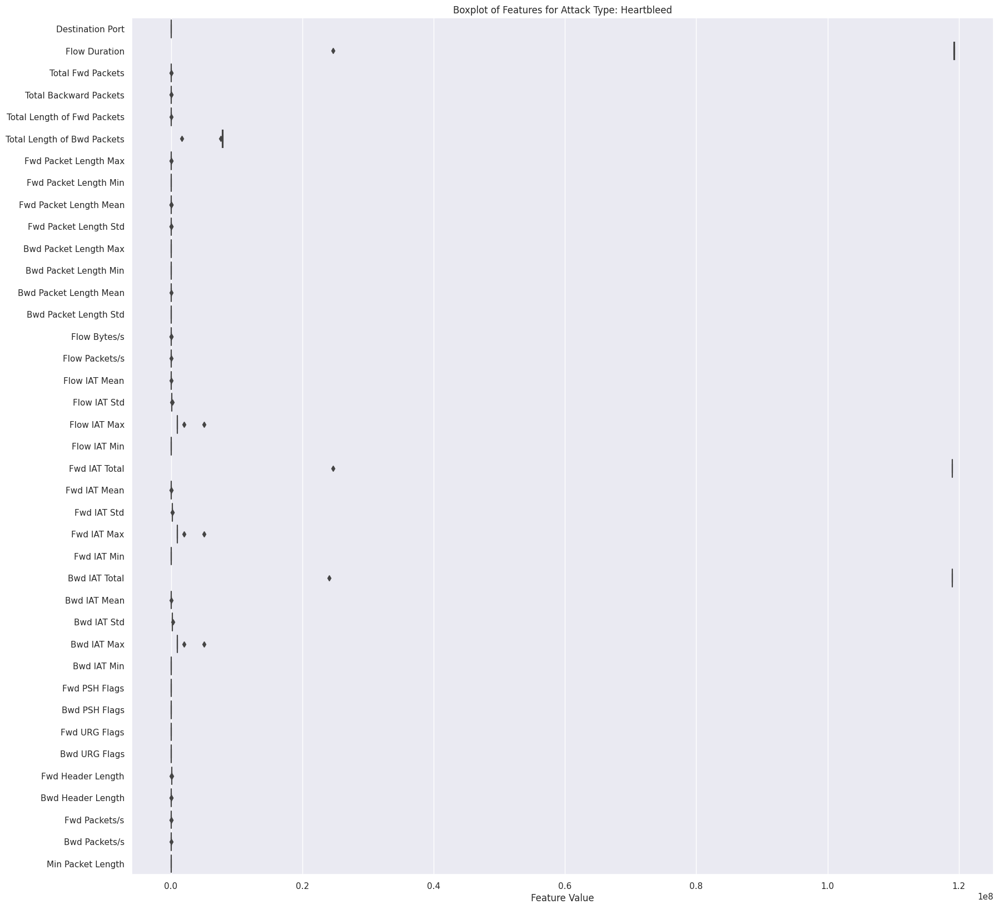

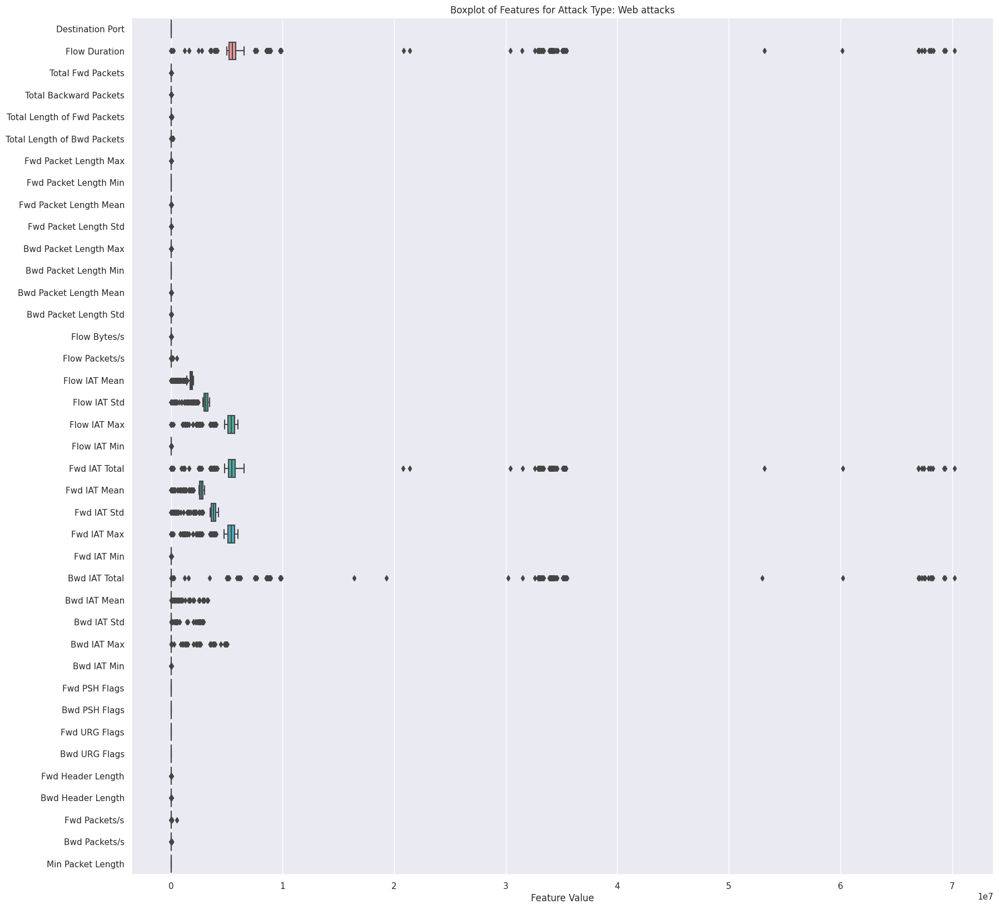

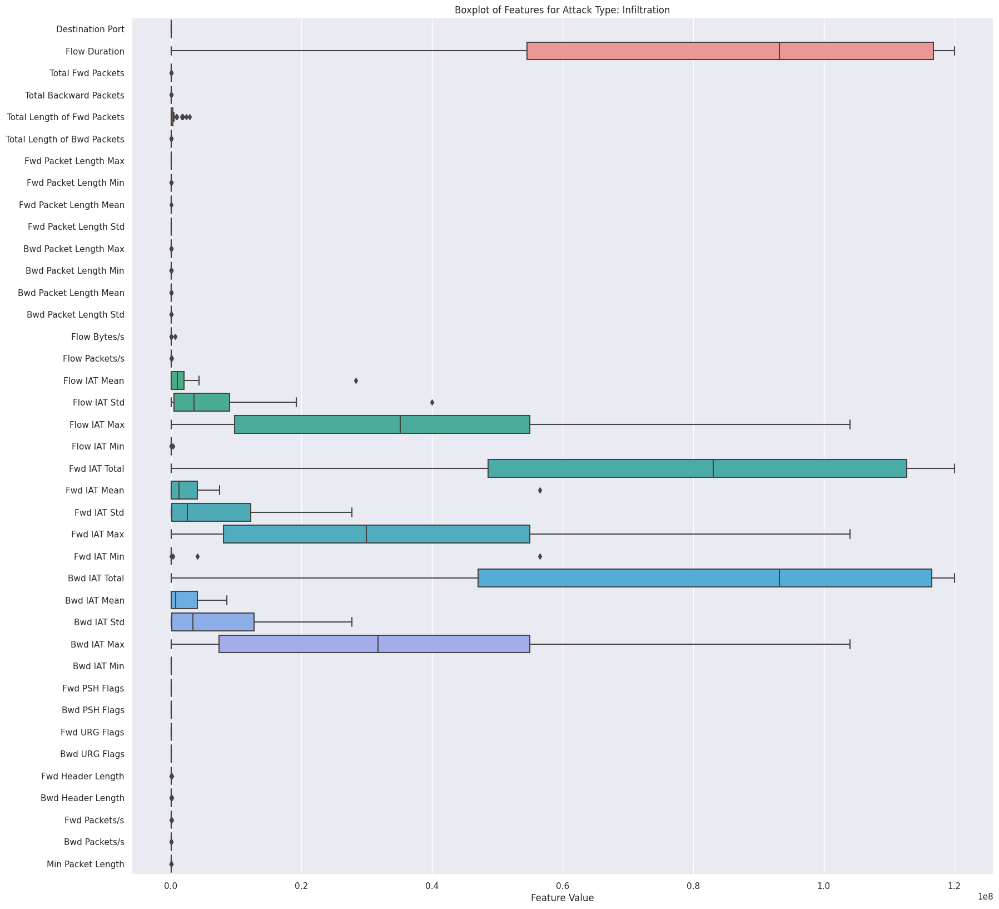

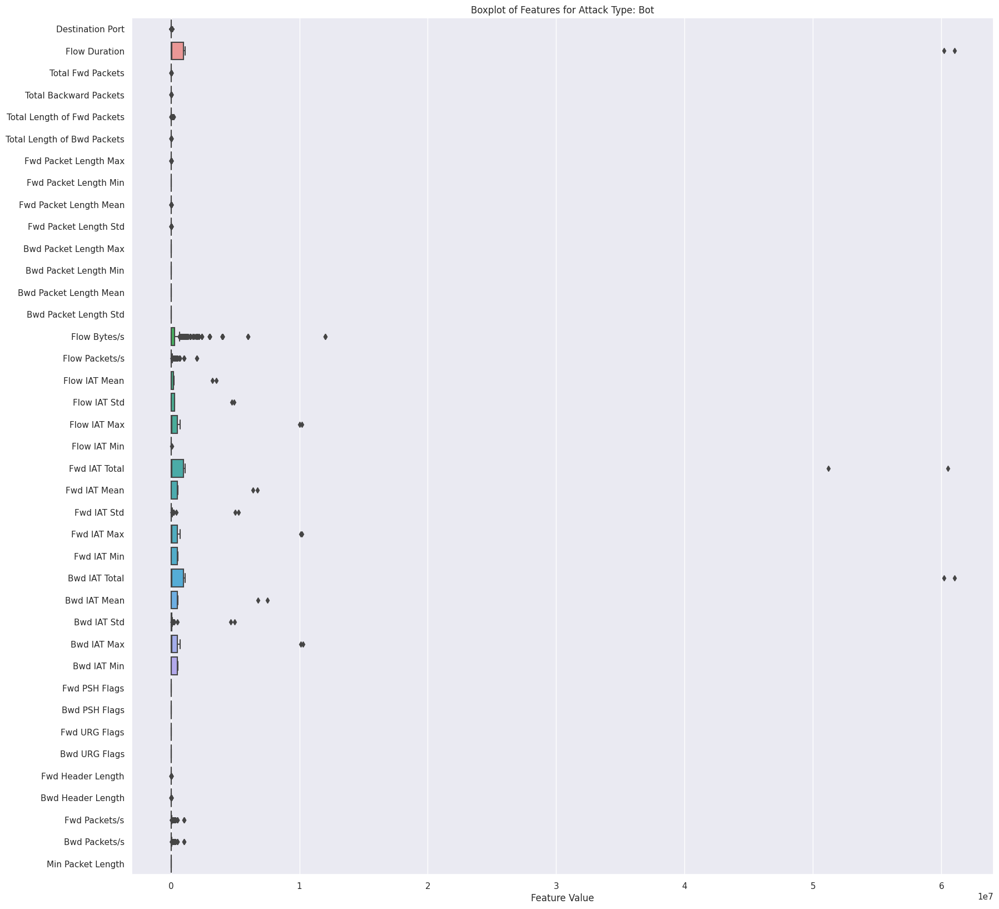

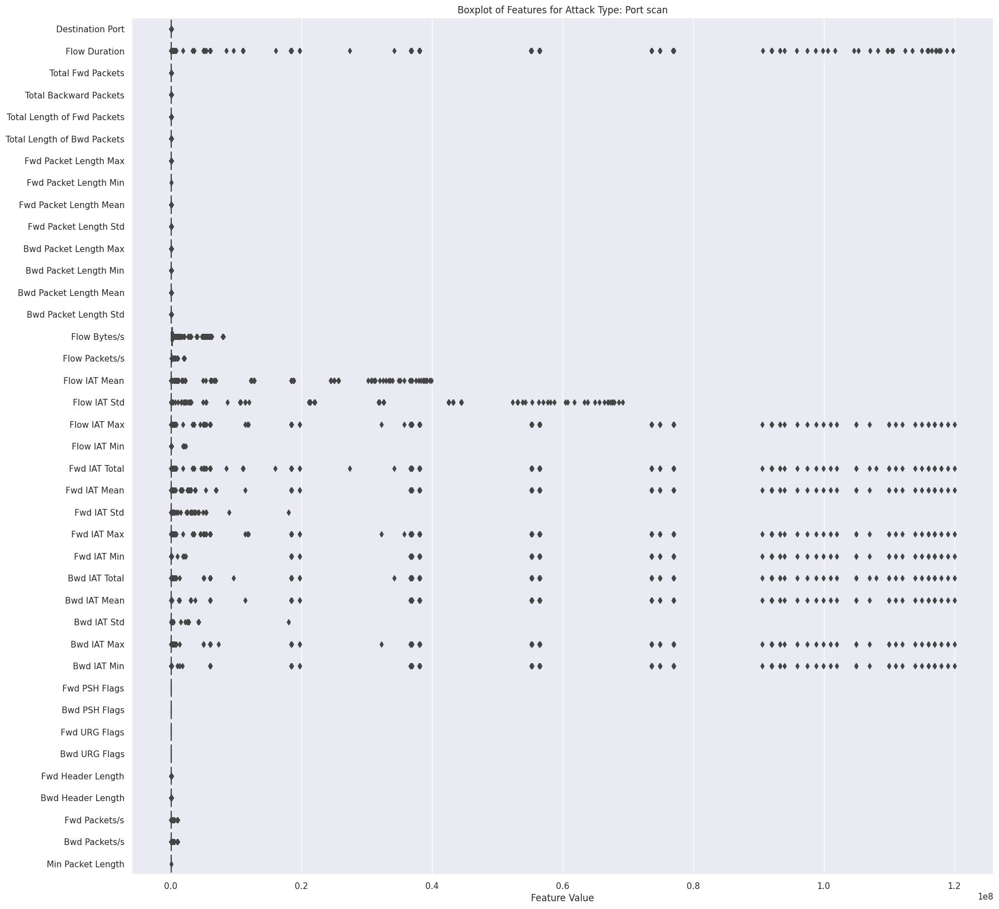

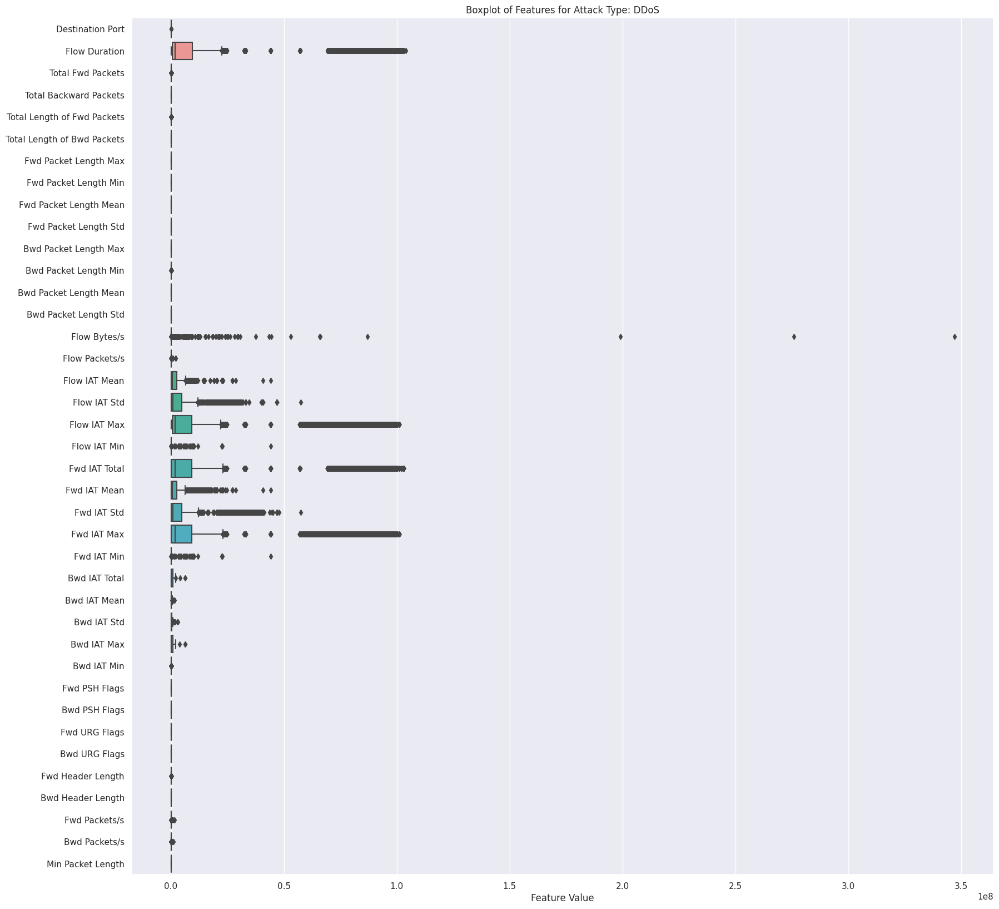

In [ ]:
# Subsetting the data to select only the first half columns
subset_data = data.iloc[:, :len(data.columns) // 2]

# Creating a boxplot for each attack type with the first half columns
for attack_type in data['Attack Type'].unique():
    attack_data = subset_data[data['Attack Type'] == attack_type]
    plt.figure(figsize = (20, 20))
    sns.boxplot(data = attack_data, orient = 'h')
    plt.title(f'Boxplot of Features for Attack Type: {attack_type}')
    plt.xlabel('Feature Value')
    plt.show()


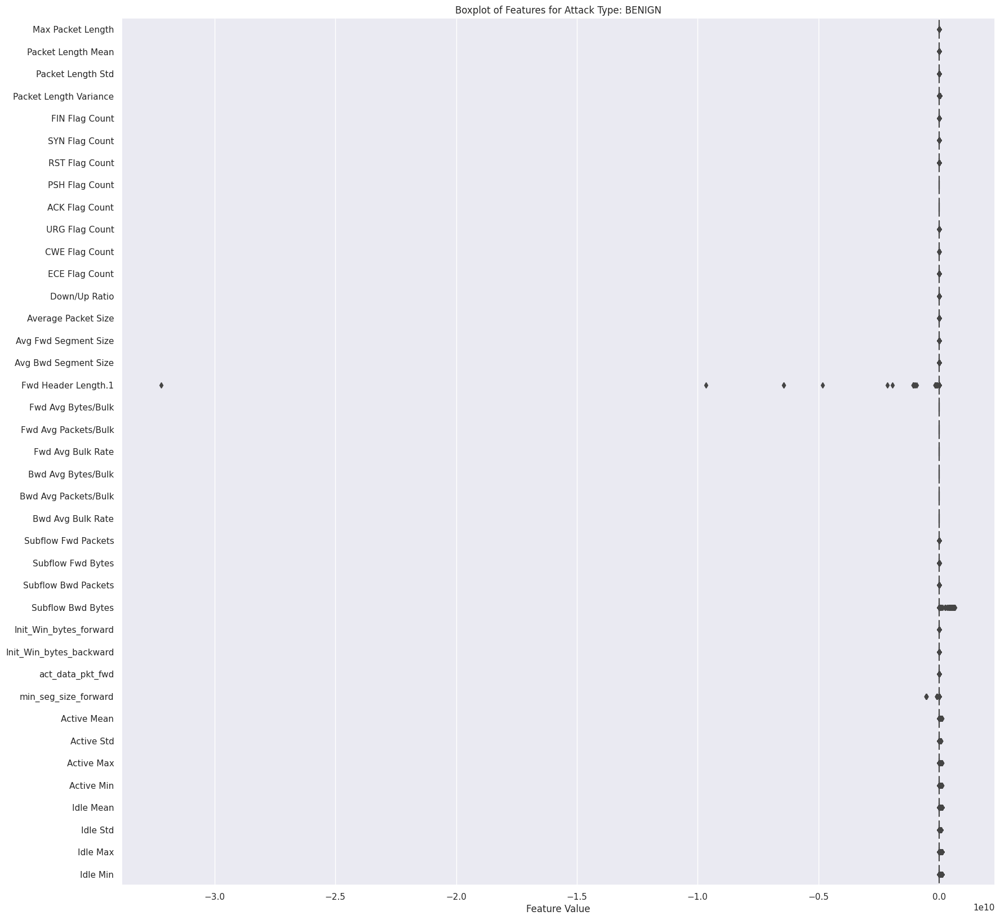

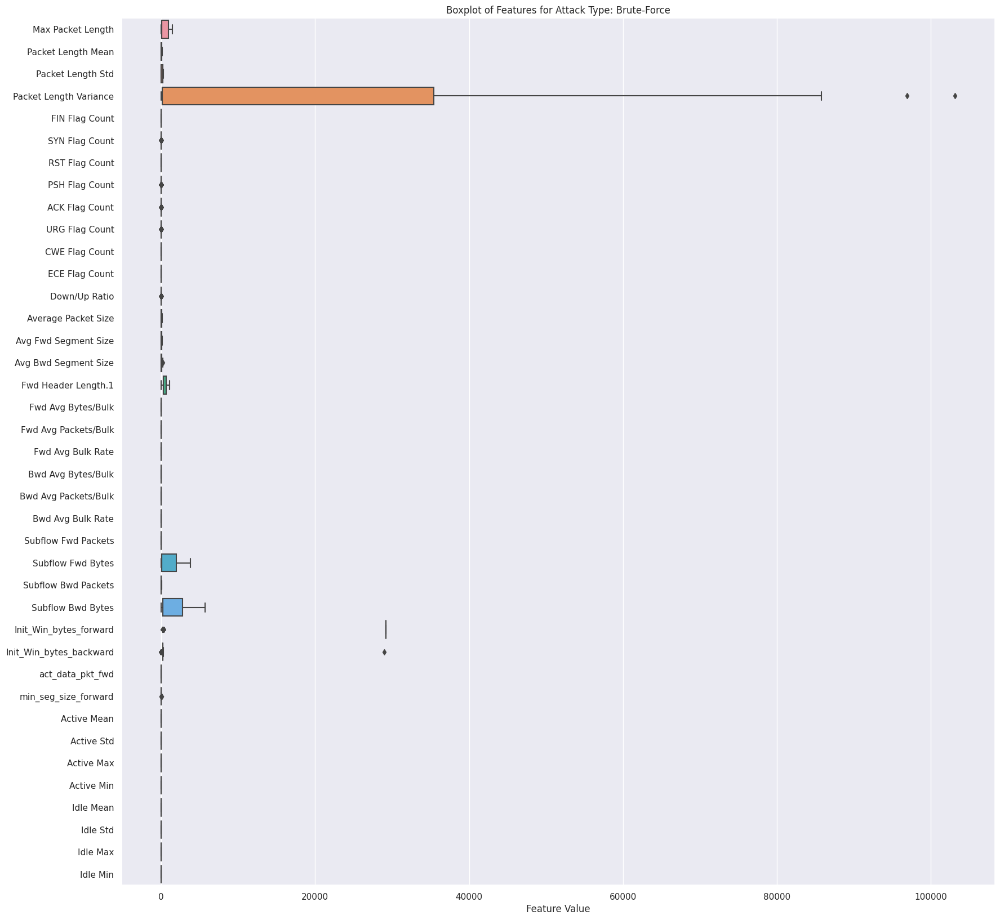

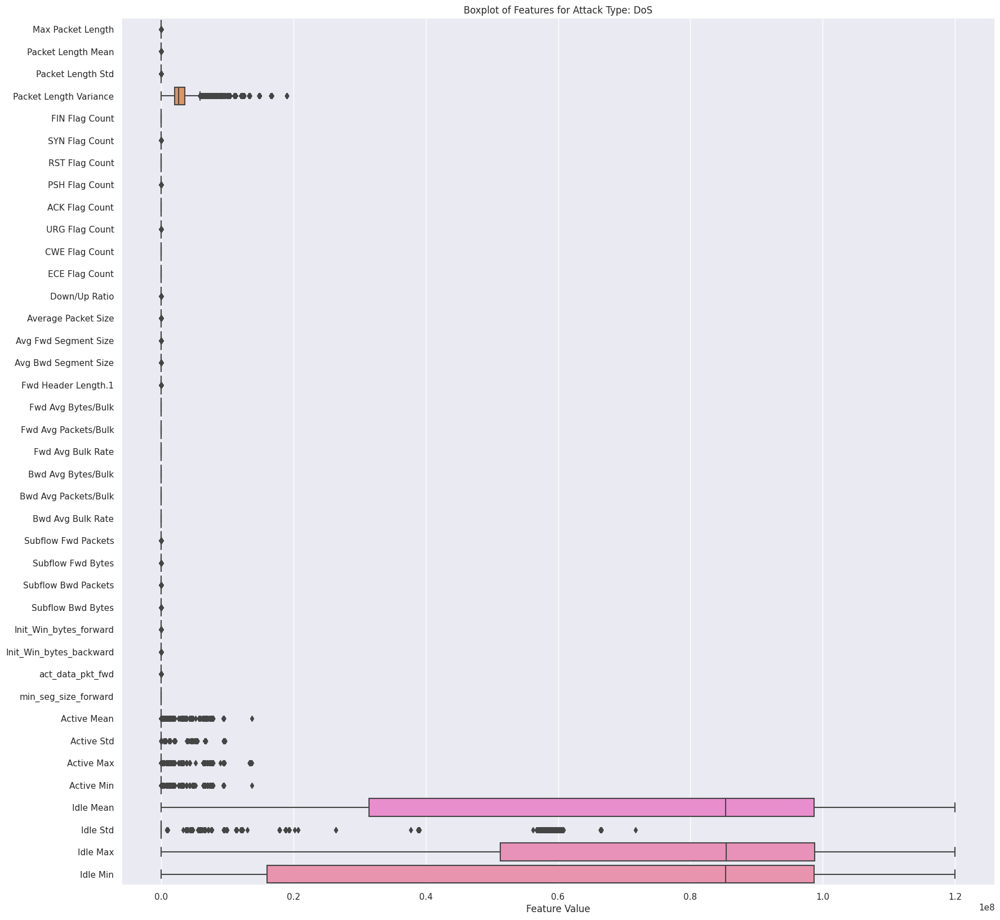

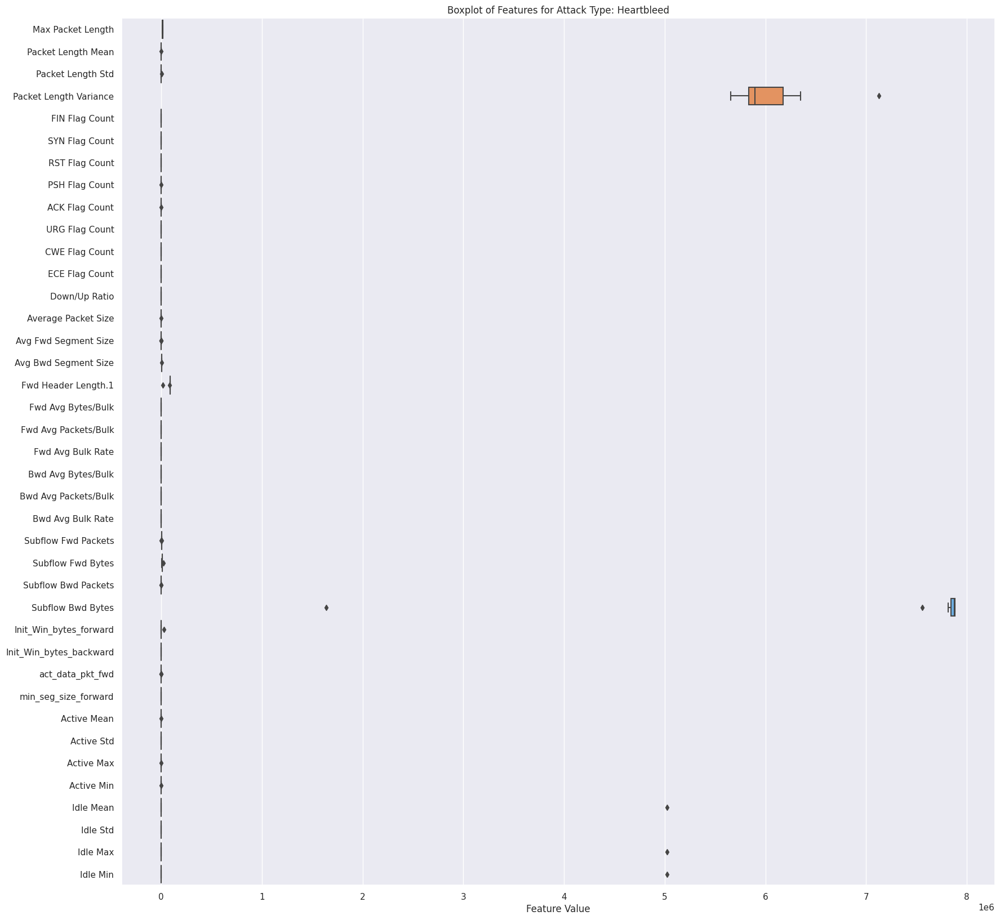

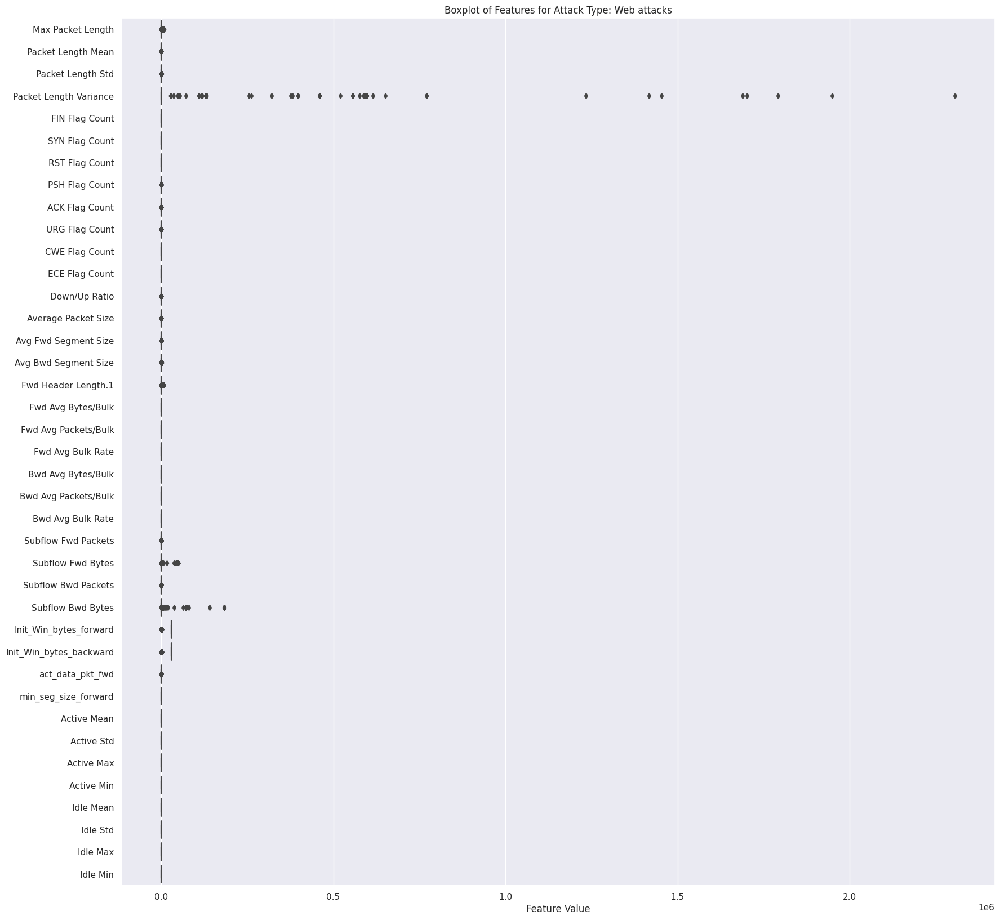

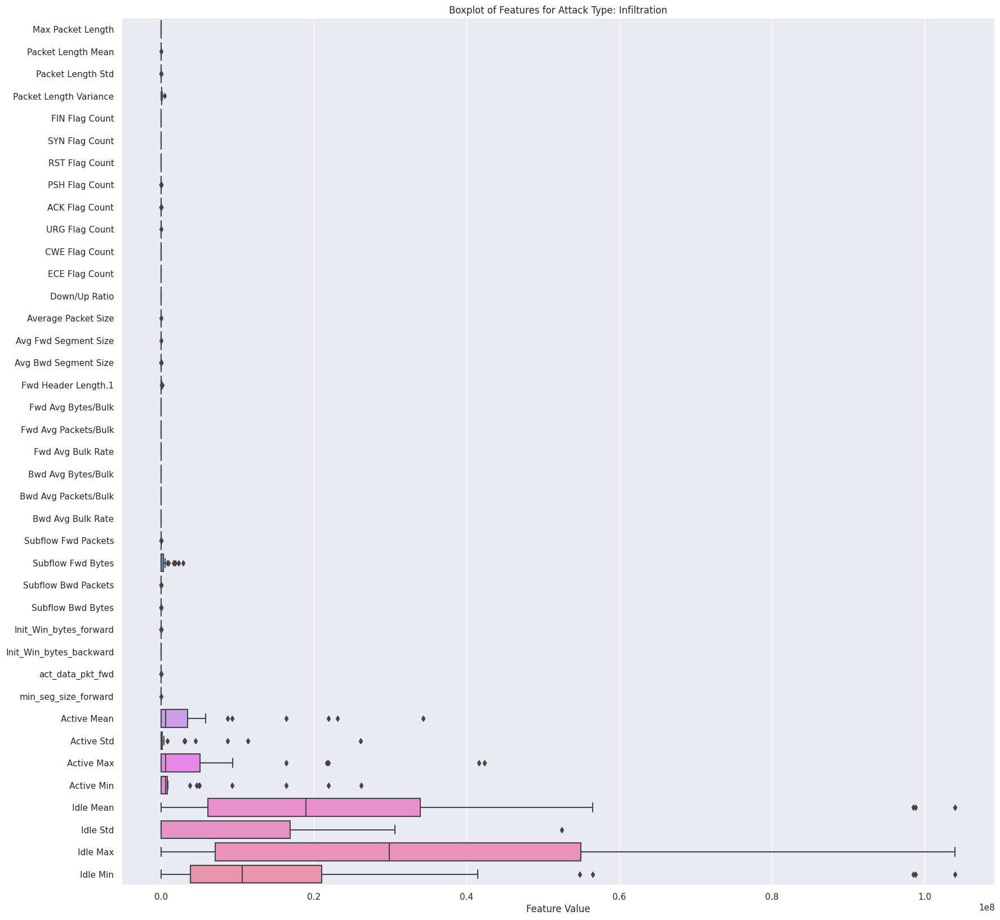

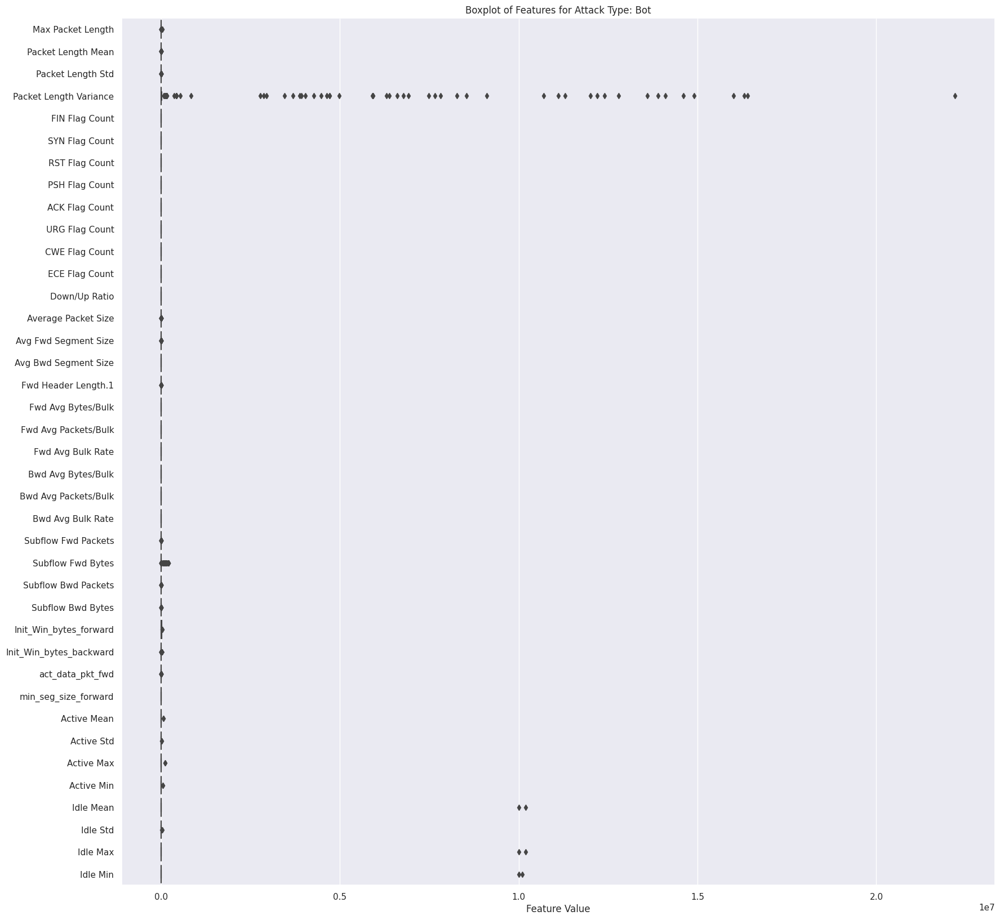

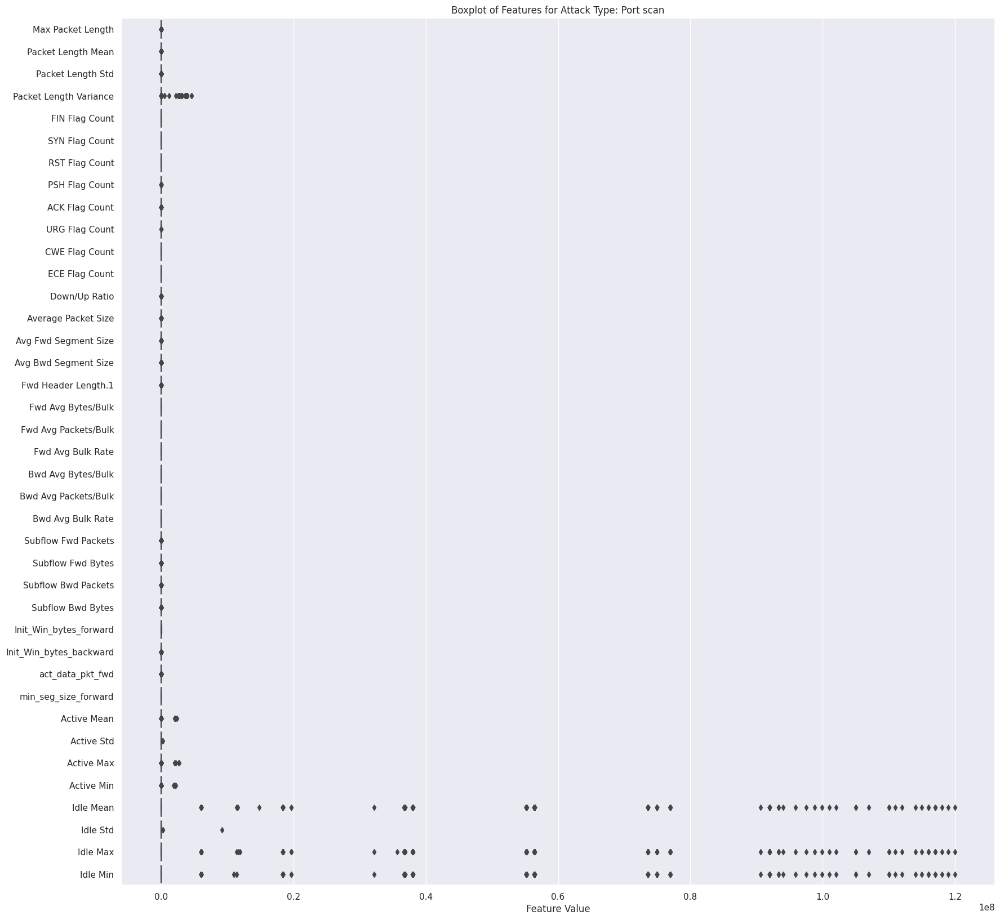

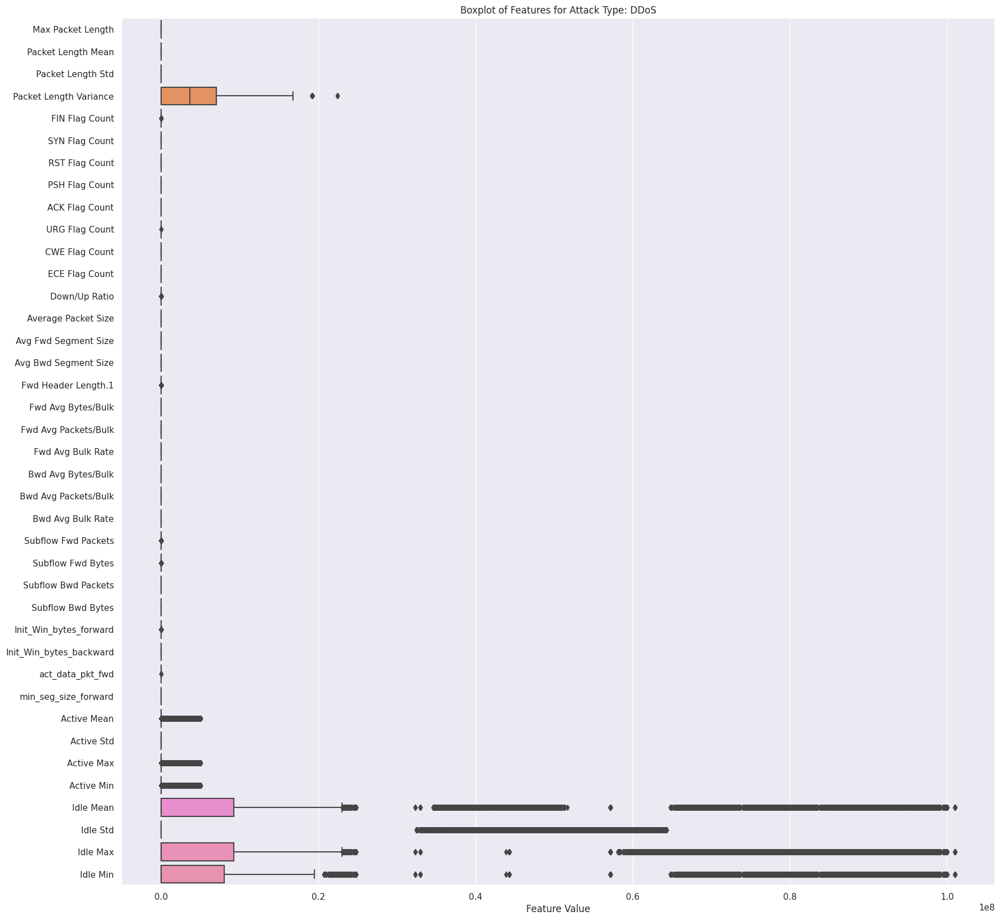

In [ ]:
# Subsetting the data to select only the second half columns
subset_data = data.iloc[:, len(data.columns) // 2:]

# Creating a boxplot for each attack type with the second half columns
for attack_type in data['Attack Type'].unique():
    attack_data = subset_data[data['Attack Type'] == attack_type]
    plt.figure(figsize = (20, 20))
    sns.boxplot(data = attack_data, orient='h')
    plt.title(f'Boxplot of Features for Attack Type: {attack_type}')
    plt.xlabel('Feature Value')
    plt.show()


In [ ]:
data.groupby('Attack Type').first()


,Destination Port,Flow Duration,Total Fwd Packets,Total Backward Packets,Total Length of Fwd Packets,Total Length of Bwd Packets,Fwd Packet Length Max,Fwd Packet Length Min,Fwd Packet Length Mean,Fwd Packet Length Std,Bwd Packet Length Max,Bwd Packet Length Min,Bwd Packet Length Mean,Bwd Packet Length Std,Flow Bytes/s,Flow Packets/s,Flow IAT Mean,Flow IAT Std,Flow IAT Max,Flow IAT Min,Fwd IAT Total,Fwd IAT Mean,Fwd IAT Std,Fwd IAT Max,Fwd IAT Min,Bwd IAT Total,Bwd IAT Mean,Bwd IAT Std,Bwd IAT Max,Bwd IAT Min,Fwd PSH Flags,Bwd PSH Flags,Fwd URG Flags,Bwd URG Flags,Fwd Header Length,Bwd Header Length,Fwd Packets/s,Bwd Packets/s,Min Packet Length,Max Packet Length,Packet Length Mean,Packet Length Std,Packet Length Variance,FIN Flag Count,SYN Flag Count,RST Flag Count,PSH Flag Count,ACK Flag Count,URG Flag Count,CWE Flag Count,ECE Flag Count,Down/Up Ratio,Average Packet Size,Avg Fwd Segment Size,Avg Bwd Segment Size,Fwd Header Length.1,Fwd Avg Bytes/Bulk,Fwd Avg Packets/Bulk,Fwd Avg Bulk Rate,Bwd Avg Bytes/Bulk,Bwd Avg Packets/Bulk,Bwd Avg Bulk Rate,Subflow Fwd Packets,Subflow Fwd Bytes,Subflow Bwd Packets,Subflow Bwd Bytes,Init_Win_bytes_forward,Init_Win_bytes_backward,act_data_pkt_fwd,min_seg_size_forward,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min
Attack Type,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
BENIGN,49188,4,2,0,12,0,6,6,6.000000,0.000000,0,0,0.000000,0.000000,3.000000e+06,500000.000000,4.000000e+00,0.000000e+00,4,4,4,4.000000e+00,0.000000e+00,4,4,0,0.000000e+00,0.000000e+00,0,0,0,0,0,0,40,0,500000.000000,0.000000,6,6,6.000000,0.000000,0.000000e+00,0,0,0,0,1,1,0,0,0,9.000000,6.000000,0.000000,40,0,0,0,0,0,0,2,12,0,0,329,-1,1,20,0.0,0.00000,0,0,0.0,0.00000,0,0
Bot,8080,60202640,9,9,322,256,322,0,35.777778,107.333333,256,0,28.444444,85.333333,9.600908e+00,0.298990,3.541332e+06,4.901981e+06,10200000,47,51200000,6.396442e+06,5.268490e+06,10200000,234,60200000,7.518954e+06,4.645137e+06,10300000,637,0,0,0,0,296,296,0.149495,0.149495,0,322,30.421053,91.783753,8.424257e+03,0,0,0,1,0,0,0,0,1,32.111111,35.777778,28.444444,296,0,0,0,0,0,0,9,322,9,256,29200,110,1,32,63678.2,22252.53596,103175,50911,10200000.0,34941.27201,10200000,10100000
Brute-Force,80,5216127,3,1,0,0,0,0,0.000000,0.000000,0,0,0.000000,0.000000,0.000000e+00,0.766852,1.738709e+06,3.010454e+06,5214882,124,5216127,2.608064e+06,3.686598e+06,5214882,1245,0,0.000000e+00,0.000000e+00,0,0,0,0,0,0,104,40,0.575139,0.191713,0,0,0.000000,0.000000,0.000000e+00,0,0,0,1,0,0,0,0,0,0.000000,0.000000,0.000000,104,0,0,0,0,0,0,3,0,1,0,29200,28960,0,32,0.0,0.00000,0,0,0.0,0.00000,0,0
DDoS,80,1293792,3,7,26,11607,20,0,8.666667,10.263203,5840,0,1658.142857,2137.297080,8.991399e+03,7.729218,1.437547e+05,4.308658e+05,1292730,2,747,3.735000e+02,5.239661e+02,744,3,1293746,2.156243e+05,5.276719e+05,1292730,2,0,0,0,0,72,152,2.318765,5.410452,0,5840,1057.545455,1853.437529,3.435231e+06,0,0,0,1,0,0,0,0,2,1163.300000,8.666667,1658.142857,72,0,0,0,0,0,0,3,26,7,11607,8192,229,2,20,0.0,0.00000,0,0,0.0,0.00000,0,0
DoS,80,5169956,8,6,1101,4222,410,0,137.625000,185.758628,3525,0,703.666667,1395.868284,1.029603e+03,2.707953,3.976889e+05,1.368409e+06,4951173,112,218783,3.125471e+04,3.068629e+04,78311,219,5169833,1.033967e+06,2.218975e+06,5002421,840,0,0,0,0,172,132,1.547402,1.160551,0,3525,354.866667,895.115146,8.012311e+05,0,0,0,1,0,0,0,0,0,380.214286,137.625000,703.666667,172,0,0,0,0,0,0,8,1101,6,4222,8192,254,7,20,0.0,0.00000,0,0,0.0,0.00000,0,0
Heartbleed,444,119302728,2685,1729,8299,7556917,517,0,3.090875,16.858421,17376,0,4370.686524,2566.935004,6.341193e+04,36.998316,2.703438e+04,1.746258e+05,5024984,0,119000000,4.444951e+04,2.224617e+05,5025702,0,119000000,6.904091e+04,2.738674e+05,5024984,1,0,0,0,0,85928,55336,22.505772,14.492544,0,17376,1713.525708,2669.389319,7.125639e+06,0,0,0,1,0,0,0,0,0,1713.913910,3.090875,4370.686524,85928,0,0,0,0,0,0,2685,8299,1729,7556917,29200,235,118,32,2217.0,0.00000,2217,2217,5024984.0,0.00000

In [ ]:
data.drop('Attack Number', axis = 1, inplace = True)


## 3. Data Preprocessing

Explain your data preprocessing steps including filling null values, dropping duplicates, encoding, dimensionality reduction etc. whichever is applicable. Appropriate data preprocessing can hugely impact your model’s performance.

### Preprocessing

In [ ]:
print('Number of missing values:', data.isna().sum().sum())


Number of missing values: 0


In [ ]:
print('Number of duplicated rows:', data.duplicated().sum())


Number of duplicated rows: 0


In [ ]:
# Identifying outliers
numeric_data = data.select_dtypes(include = ['float', 'int'])
q1 = numeric_data.quantile(0.25)
q3 = numeric_data.quantile(0.75)
iqr = q3 - q1
outlier = (numeric_data < (q1 - 1.5 * iqr)) | (numeric_data > (q3 + 1.5 * iqr))
outlier_count = outlier.sum()
outlier_percentage = round(outlier.mean() * 100, 2)
outlier_stats = pd.concat([outlier_count, outlier_percentage], axis = 1)
outlier_stats.columns = ['Outlier Count', 'Outlier Percentage']

print(outlier_stats)


                             Outlier Count  Outlier Percentage
Destination Port                    546849               21.68
Flow Duration                       468223               18.56
Total Fwd Packets                   253005               10.03
Total Backward Packets              239223                9.48
Total Length of Fwd Packets         315337               12.50
Total Length of Bwd Packets         575636               22.82
Fwd Packet Length Max               245589                9.74
Fwd Packet Length Min                13109                0.52
Fwd Packet Length Mean              177396                7.03
Fwd Packet Length Std               236283                9.37
Bwd Packet Length Max               374533               14.85
Bwd Packet Length Min                66534                2.64
Bwd Packet Length Mean              437353               17.34
Bwd Packet Length Std               448568               17.78
Flow Bytes/s                        475057             

In [ ]:
# Identifying outliers based on attack type
outlier_counts = {}
for i in numeric_data:
    for attack_type in data['Attack Type'].unique():
        attack_data = data[i][data['Attack Type'] == attack_type]
        q1, q3 = np.percentile(attack_data, [25, 75])
        iqr = q3 - q1
        lower_bound = q1 - 1.5 * iqr
        upper_bound = q3 + 1.5 * iqr
        num_outliers = ((attack_data < lower_bound) | (attack_data > upper_bound)).sum()
        outlier_percent = num_outliers / len(attack_data) * 100
        outlier_counts[(i, attack_type)] = (num_outliers, outlier_percent)

for i in numeric_data:
  print(f'Feature: {i}')
  for attack_type in data['Attack Type'].unique():
    num_outliers, outlier_percent = outlier_counts[(i, attack_type)]
    print(f'- {attack_type}: {num_outliers} ({outlier_percent:.2f}%)')
  print()


Feature: Destination Port
- BENIGN: 469426 (22.39%)
- Brute-Force: 1 (0.01%)
- DoS: 0 (0.00%)
- Heartbleed: 0 (0.00%)
- Web attacks: 0 (0.00%)
- Infiltration: 0 (0.00%)
- Bot: 705 (36.10%)
- Port scan: 11121 (12.25%)
- DDoS: 3 (0.00%)

Feature: Flow Duration
- BENIGN: 486723 (23.22%)
- Brute-Force: 2236 (24.43%)
- DoS: 42408 (21.89%)
- Heartbleed: 1 (9.09%)
- Web attacks: 313 (14.61%)
- Infiltration: 0 (0.00%)
- Bot: 2 (0.10%)
- Port scan: 2081 (2.29%)
- DDoS: 21863 (17.08%)

Feature: Total Fwd Packets
- BENIGN: 390070 (18.61%)
- Brute-Force: 0 (0.00%)
- DoS: 2430 (1.25%)
- Heartbleed: 2 (18.18%)
- Web attacks: 325 (15.17%)
- Infiltration: 5 (13.89%)
- Bot: 46 (2.36%)
- Port scan: 1479 (1.63%)
- DDoS: 4061 (3.17%)

Feature: Total Backward Packets
- BENIGN: 300988 (14.36%)
- Brute-Force: 0 (0.00%)
- DoS: 22354 (11.54%)
- Heartbleed: 2 (18.18%)
- Web attacks: 204 (9.52%)
- Infiltration: 5 (13.89%)
- Bot: 46 (2.36%)
- Port scan: 514 (0.57%)
- DDoS: 0 (0.00%)

Feature: Total Length of Fwd 

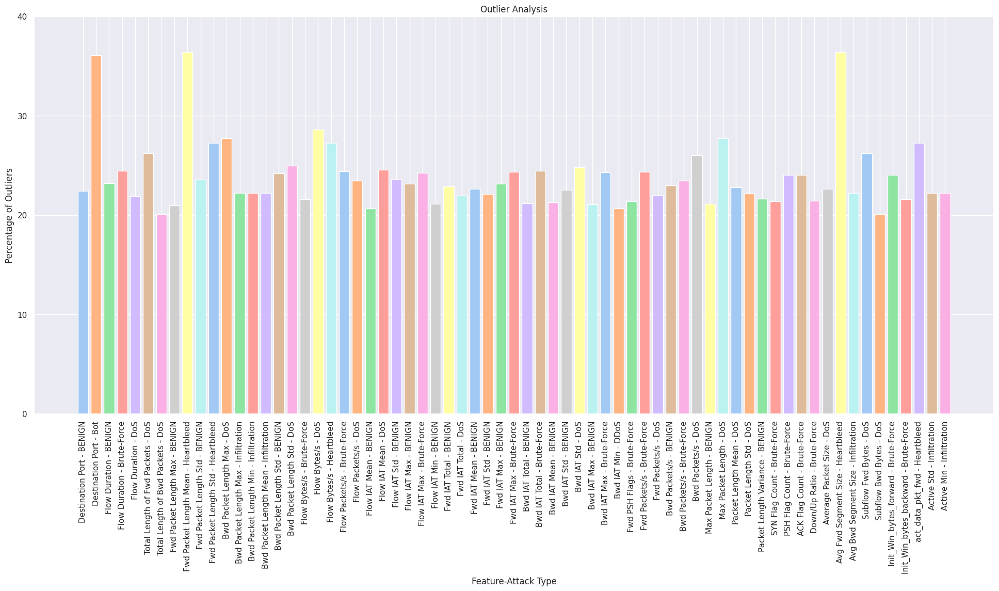

In [ ]:
# Plotting the percentage of outliers that are higher than 20%
fig, ax = plt.subplots(figsize = (24, 10))
for i in numeric_data:
    for attack_type in data['Attack Type'].unique():
        num_outliers, outlier_percent = outlier_counts[(i, attack_type)]
        if outlier_percent > 20:
            ax.bar(f'{i} - {attack_type}', outlier_percent)

ax.set_xlabel('Feature-Attack Type')
ax.set_ylabel('Percentage of Outliers')
ax.set_title('Outlier Analysis')
ax.set_yticks(np.arange(0, 41, 10))
plt.xticks(rotation = 90)
plt.show()


In [ ]:
# For improving performance and reduce memory-related errors
old_memory_usage = data.memory_usage().sum() / 1024 ** 2
print(f'Initial memory usage: {old_memory_usage:.2f} MB')
for col in data.columns:
    col_type = data[col].dtype
    if col_type != object:
        c_min = data[col].min()
        c_max = data[col].max()
        # Downcasting float64 to float32
        if str(col_type).find('float') >= 0 and c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
            data[col] = data[col].astype(np.float32)

        # Downcasting int64 to int32
        elif str(col_type).find('int') >= 0 and c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
            data[col] = data[col].astype(np.int32)

new_memory_usage = data.memory_usage().sum() / 1024 ** 2
print(f"Final memory usage: {new_memory_usage:.2f} MB")


Initial memory usage: 1539.53 MB
Final memory usage: 808.25 MB


In [ ]:
# Calculating percentage reduction in memory usage
print(f'Reduced memory usage: {1 - (new_memory_usage / old_memory_usage):.2%}')


Reduced memory usage: 47.50%


In [ ]:
data.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 2522362 entries, 0 to 225744
Data columns (total 79 columns):
 #   Column                       Dtype  
---  ------                       -----  
 0   Destination Port             int32  
 1   Flow Duration                int32  
 2   Total Fwd Packets            int32  
 3   Total Backward Packets       int32  
 4   Total Length of Fwd Packets  int32  
 5   Total Length of Bwd Packets  int32  
 6   Fwd Packet Length Max        int32  
 7   Fwd Packet Length Min        int32  
 8   Fwd Packet Length Mean       float32
 9   Fwd Packet Length Std        float32
 10  Bwd Packet Length Max        int32  
 11  Bwd Packet Length Min        int32  
 12  Bwd Packet Length Mean       float32
 13  Bwd Packet Length Std        float32
 14  Flow Bytes/s                 float32
 15  Flow Packets/s               float32
 16  Flow IAT Mean                float32
 17  Flow IAT Std                 float32
 18  Flow IAT Max                 int32  
 19  F

In [ ]:
data.describe().transpose()


,count,mean,std,min,25%,50%,75%,max
Destination Port,2522362.0,8.704762e+03,1.902507e+04,0.000000e+00,53.000000,80.000000,4.430000e+02,6.553500e+04
Flow Duration,2522362.0,1.658132e+07,3.522426e+07,-1.300000e+01,208.000000,50577.000000,5.329717e+06,1.200000e+08
Total Fwd Packets,2522362.0,1.027627e+01,7.941738e+02,1.000000e+00,2.000000,2.000000,6.000000e+00,2.197590e+05
Total Backward Packets,2522362.0,1.156596e+01,1.056594e+03,0.000000e+00,1.000000,2.000000,5.000000e+00,2.919220e+05
Total Length of Fwd Packets,2522362.0,6.115751e+02,1.058499e+04,0.000000e+00,12.000000,66.000000,3.320000e+02,1.290000e+07
Total Length of Bwd Packets,2522362.0,1.813315e+04,2.397434e+06,0.000000e+00,6.000000,155.000000,9.880000e+02,6.554530e+08
Fwd Packet Length Max,2522362.0,2.310918e+02,7.561625e+02,0.000000e+00,6.000000,40.000000,2.020000e+02,2.482000e+04
Fwd Packet Length Min,2522362.0,1.919464e+01,6.079447e+01,0.000000e+00,0.000000,2.000000,3.700000e+01,2.325000e+03
Fwd Packet Length Mean,2522362.0,6.347013e+01,1.955015e+02,0.000000e+00,6.000000,36.111111,5.200000e+01,5.940857e+03
Fwd Packet Length Std,2522362.0,7.727757e+01,2.967953e+02,0.000000e+00,0.000000,0.000000,7.413914e+01,7.125597e+03


In [ ]:
# Dropping columns with only one unique value
num_unique = data.nunique()
one_variable = num_unique[num_unique == 1]
not_one_variable = num_unique[num_unique > 1].index

dropped_cols = one_variable.index
data = data[not_one_variable]

print('Dropped columns:')
dropped_cols


Dropped columns:


Index(['Bwd PSH Flags', 'Bwd URG Flags', 'Fwd Avg Bytes/Bulk',
       'Fwd Avg Packets/Bulk', 'Fwd Avg Bulk Rate', 'Bwd Avg Bytes/Bulk',
       'Bwd Avg Packets/Bulk', 'Bwd Avg Bulk Rate'],
      dtype='object')

In [ ]:
data.shape


(2522362, 71)

In [ ]:
# Columns after removing non variant columns
data.columns


Index(['Destination Port', 'Flow Duration', 'Total Fwd Packets',
       'Total Backward Packets', 'Total Length of Fwd Packets',
       'Total Length of Bwd Packets', 'Fwd Packet Length Max',
       'Fwd Packet Length Min', 'Fwd Packet Length Mean',
       'Fwd Packet Length Std', 'Bwd Packet Length Max',
       'Bwd Packet Length Min', 'Bwd Packet Length Mean',
       'Bwd Packet Length Std', 'Flow Bytes/s', 'Flow Packets/s',
       'Flow IAT Mean', 'Flow IAT Std', 'Flow IAT Max', 'Flow IAT Min',
       'Fwd IAT Total', 'Fwd IAT Mean', 'Fwd IAT Std', 'Fwd IAT Max',
       'Fwd IAT Min', 'Bwd IAT Total', 'Bwd IAT Mean', 'Bwd IAT Std',
       'Bwd IAT Max', 'Bwd IAT Min', 'Fwd PSH Flags', 'Fwd URG Flags',
       'Fwd Header Length', 'Bwd Header Length', 'Fwd Packets/s',
       'Bwd Packets/s', 'Min Packet Length', 'Max Packet Length',
       'Packet Length Mean', 'Packet Length Std', 'Packet Length Variance',
       'FIN Flag Count', 'SYN Flag Count', 'RST Flag Count', 'PSH Flag Count',

### Applying PCA to reduce dimensions.


A simple and effective way to reduce the dimensionality of the dataset and improve the performance of the model is to use strongly correlated features. We are using label encoding on the target feature where the numerical values assigned to each category do not have inherent meaning and they are arbitrary. For this reason, the correlation matrix calculated using label-encoded variables may not accurately reflect the true relationships between the variables. 

So, a more flexible approach to feature selection can be PCA. PCA is a technique that transforms original set of variables into a smaller set of uncorrelated variables, called principal components.

PCA can capture more complex relationships between variables that may not be evident from correlation matrix analysis. It can also help to reduce the risk of overfitting. 

Here, we applied Incremental PCA. Incremental PCA is a variant of PCA that allows for the efficient computation of principal components of a large dataset that cannot be stored in memory.


In [ ]:
from sklearn.decomposition import IncrementalPCA

features = data.drop('Attack Type', axis = 1)
attacks = data['Attack Type']

size = len(features.columns) // 2
ipca = IncrementalPCA(n_components = size, batch_size = 500)
for batch in np.array_split(features, len(features) // 500):
    ipca.partial_fit(batch)

print(f'information retained: {sum(ipca.explained_variance_ratio_):.3%}')


information retained: 100.000%


In [ ]:
features = ipca.transform(features)
new_data = pd.DataFrame(features, columns = [f'PC{i+1}' for i in range(size)])
new_data['Attack Type'] = attacks.values


In [ ]:
new_data


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30,PC31,PC32,PC33,PC34,PC35,Attack Type
0,-3.456227e+07,-2.980716e+06,37022.821877,1.230724e+06,1.082820e+06,-673069.584589,354936.471128,-192621.819560,72751.001731,-209871.585306,128483.986043,46022.540599,109420.172264,331973.658293,21338.624811,-269715.930117,70815.248324,-15148.806507,-39617.876799,-18584.436280,517.581266,36717.966768,8136.890701,8303.289823,6.213350e+05,186.135500,458.205143,-92.193453,62.900321,-36869.801534,-321.448823,24457.373025,-626.798094,-1169.211919,-4665.472378,BENIGN
1,-3.464883e+07,-3.099450e+06,37941.102647,1.023586e+07,1.040709e+06,-656798.522088,348564.171310,-189707.408972,71131.709601,-208794.980063,127676.346535,46712.480425,111268.394553,340965.666663,21878.141572,-287205.018408,73960.024082,-16445.803379,-48761.739574,-25748.295507,464.342238,58431.500805,13457.860690,18829.723099,2.712089e+06,2902.612091,22741.287732,731.073658,-678.365395,-129003.318884,51.720150,-22931.439176,-4033.093113,1618.605532,5587.640145,BENIGN
2,-3.457189e+07,-2.993909e+06,37124.853426,2.231296e+06,1.078141e+06,-671262.623790,354228.956320,-192299.105061,72571.115679,-209752.069568,128394.533540,46099.065612,109625.581055,332972.983367,21398.586209,-271659.349288,71164.653056,-15292.980315,-40634.028977,-19380.628759,511.663910,39130.940107,8727.917856,9472.934099,8.536483e+05,487.875189,2932.756788,-1.016400,-19.233303,-47099.939678,-282.073806,19497.038832,-1037.850038,-868.882826,-3564.667740,BENIGN
3,-3.464883e+07,-3.099450e+06,37941.102678,1.023586e+07,1.040709e+06,-656798.553461,348564.149201,-189707.439016,71131.735592,-208795.050494,127676.453759,46712.462273,111268.495919,340965.834871,21878.153454,-287205.196082,73960.013238,-16445.864445,-48761.911923,-25748.504647,464.340302,58431.864648,13457.667270,18829.760723,2.712097e+06,2902.520785,22739.939295,730.776751,-678.135310,-128996.398114,49.631980,-22626.348932,-4065.668138,1609.177099,5549.209911,BENIGN
4,-3.454632e+07,-2.960226e+06,37043.210740,-2.965826e+05,1.089878e+06,-676014.133254,355403.316288,-192947.451950,73354.031169,-209083.739410,128624.014670,45199.088316,108532.545049,326420.675177,21145.708035,-253103.802510,70307.841517,-14696.146779,-36310.207231,-16058.911172,484.230799,29330.986475,6620.188810,4856.912182,-5.997433e+04,-661.422687,-6517.631775,-303.025837,238.768720,42.208591,-129.630551,-9221.165730,348.571082,653.866927,928.256528,BENIGN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2522357,-3.453527e+07,-2.943731e+06,36708.570245,-1.574190e+06,1.095922e+06,-678119.817871,356895.281161,-193476.802741,73263.179738,-210200.022070,128713.779490,45849.647564,108820.624869,329052.185984,21180.967244,-264218.873663,69802.676678,-14750.410772,-36720.453030,-16327.651826,525.706343,29868.270733,6446.156481,4976.624052,-4.029523e+04,-679.263424,-6652.842194,-367.751489,290.330008,12666.384620,-454.072407,50847.599463,2374.763734,-2645.573153,-9820.457244,BENIGN
2522358,-3.453497e+07,-2.943335e+06,36705.502690,-1.604256e+06,1.096060e+06,-678170.127948,356912.185014,-193476.602275,73269.361253,-210205.670576,128714.517734,45856.863377,108815.172631,329019.120572,21178.995439,-264171.569906,69793.124829,-14749.207221,-36693.740544,-16309.336163,525.774253,29811.490445,6432.356157,4948.860246,-4.564159e+04,-685.930577,-6707.095087,-369.612797,291.746700,9833.410298,-462.632146,51047.081958,2396.631483,-2658.418036,-9816.947563,BENIGN
2522359,-3.453490e+07,-2.943247e+06,36704.822110,-1.610925e+06,1.096090e+06,-678181.067813,356915.691693,-193476.025616,73270.748148,-210206.951011,128714.518454,45858.909446,108813.870170,329011.178620,21178.520333,-264161.146352,69790.893224,-14749.047171,-36687.681059,-16305.304284,525.788759,29798.919106,6429.305195,4942.687894,-4.682760e+04,-687.406955,-6719.1240

## 4.	Machine Learning Models



1.   Develop machine learning models. 
2.   You may try changing different parameters to obtain better training 
accuracy.
3. At least two models (with different parameters)



Provide a brief description of the machine learning models you used. (Provide a detailed description of their parameter)

Don’t copy-paste directly from the Internet! Write in your own words.

### **Write Here**

Each of the model descriptions is written in their designated sections.

In [ ]:
# For cross validation
from sklearn.model_selection import cross_val_score


### Creating a Balanced Dataset for Binary Classification

In [ ]:
# Creating a balanced dataset for Binary Classification
normal_traffic = new_data.loc[new_data['Attack Type'] == 'BENIGN']
intrusions = new_data.loc[new_data['Attack Type'] != 'BENIGN']

normal_traffic = normal_traffic.sample(n = len(intrusions), replace = False)

ids_data = pd.concat([intrusions, normal_traffic])
ids_data['Attack Type'] = np.where((ids_data['Attack Type'] == 'BENIGN'), 0, 1)
bc_data = ids_data.sample(n = 15000)

print(bc_data['Attack Type'].value_counts())


1    7518
0    7482
Name: Attack Type, dtype: int64


In [ ]:
# Standardizing the dataset
from sklearn.preprocessing import StandardScaler

features = bc_data.drop('Attack Type', axis=1)
attacks = bc_data['Attack Type']

numeric_cols = features.select_dtypes(include=['float32', 'int32', 'int64', 'float64']).columns.tolist()
scaler = StandardScaler()
features[numeric_cols] = scaler.fit_transform(features[numeric_cols])

bc_data = pd.concat([features, attacks], axis=1)
bc_data


,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30,PC31,PC32,PC33,PC34,PC35,PC36,PC37,PC38,PC39,Attack Type
945881,-0.601098,0.206638,0.236250,-0.046460,0.156163,0.011551,0.041035,-0.029533,0.106575,-0.109170,-0.027912,0.015695,0.077078,0.232890,0.171166,-0.292339,0.032694,0.007485,-0.086512,0.004428,-0.001277,0.069042,-0.006498,-0.034747,-0.323506,-0.002829,-0.024509,-0.008003,0.010749,-0.161867,-0.023141,-0.393288,-0.582500,-0.669561,0.016793,-0.141170,-0.239213,-0.004631,0.133220,0
1324559,-0.601166,0.206366,0.238731,0.006736,0.156025,0.011614,0.040983,-0.029558,0.106249,-0.109061,-0.027852,0.015421,0.077106,0.232420,0.170764,-0.289840,0.032919,0.007559,-0.086536,0.004456,0.001241,0.069291,-0.006203,-0.034468,-0.220984,-0.002694,-0.023941,-0.008198,0.010046,-0.219384,-0.030335,3.055818,-0.099057,0.164612,-1.240378,-0.691931,0.253399,0.030336,0.040549,0
1929022,-0.509064,0.192210,0.190415,-0.080422,0.048226,0.165017,-0.329521,0.309038,-1.185178,1.238729,-0.484106,-0.632168,0.311426,-0.180049,-0.385306,-0.391449,-0.601636,-0.177912,0.565618,-0.051628,-0.118650,-0.274375,0.341028,-0.036272,-0.238362,0.065340,0.465634,0.015349,0.184594,-0.146275,-0.148482,0.272251,0.500174,0.586763,8.890629,-2.056958,-0.522508,0.109742,-0.046725,0
2515032,-0.378980,0.778946,1.092383,-0.043696,0.124728,-0.045354,-0.091411,0.124248,1.744077,-0.062381,-1.019387,-0.530097,-0.547045,-2.903591,-2.678230,-0.048525,-0.723732,-1.009388,-1.586957,0.494298,-1.043823,0.745096,0.954794,0.030834,-0.104043,-0.310090,-0.822562,-0.049856,-3.006555,-0.109533,0.026462,-0.953006,5.332113,2.286731,-0.912511,0.068538,2.140739,-3.676804,0.757760,0
2242474,-0.601064,0.206789,0.235906,-0.076276,0.156243,0.011502,0.041083,-0.029619,0.106500,-0.109249,-0.027862,0.015622,0.077174,0.233616,0.171732,-0.293260,0.032760,0.007534,-0.086881,0.004278,0.001385,0.069959,-0.006389,-0.034283,-0.155399,-0.002577,-0.021860,-0.007985,0.009386,0.307635,-0.017045,-0.781721,1.512869,1.564053,-0.501750,0.360732,-0.797946,0.434986,-0.656041,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1004858,1.493918,-1.850991,-1.988531,-0.021830,-1.675130,0.645409,0.831200,-0.399894,0.352284,-0.340060,-0.580337,0.215213,-0.008580,0.164393,0.068738,-0.631916,0.722522,0.090139,-1.062783,0.083163,0.351280,-0.006807,-0.005577,0.022723,-0.084806,0.184439,0.348252,-0.075572,-1.433136,-0.080802,0.050770,0.161917,-0.270749,-0.359599,0.190404,-0.110734,-0.412912,-0.182156,0.211548,1
1102611,-0.600692,0.207333,0.236350,-0.084509,0.157615,0.011870,0.040301,-0.031487,0.103728,-0.106103,-0.032687,0.018576,0.074207,0.218296,0.157118,-0.294370,0.030167,0.003935,-0.081465,0.002920,-0.010853,0.070935,-0.006622,-0.036112,-0.335402,-0.002376,-0.025584,-0.008458,0.007282,-0.220449,-0.024247,-0.378805,-0.589941,-0.660279,0.049476,-0.206286,-0.428093,0.188534,-0.123284,1
2257116,-0.601086,0.206704,0.236178,-0.059573,0.156202,0.011523,0.041071,-0.029615,0.106479,-0.109251,-0.027855,0.015624,0.077229,0.233886,0.171992,-0.293525,0.032851,0.007493,-0.087285,0.003857,0.001151,0.071952,-0.005907,-0.033412,0.208552,-0.001955,-0.017710,-0.007865,0.009184,1.371142,-0.013990,-0.910764,1.513093,1.542729,-0.530563,1.440671,-0.778873,0.394717,-0.597725,1
1697077,-0.600482,0.206924,0.236296,-0.084041,0.155406,0.012440,0.039052,-0.027960,0.100555,-0.102720,-0.031862,0.013105,0.074957,0.227638,0.165920,-0.293503,0.029427,0.005026,-0.087758,0.005326,-0.002183,0.054873,-0.017517,-0.034558,-0.335521,-0.002902,-0.020587,-0.008588,0.002188,-0.221573,-0.021267,-0.381918,-0.576432,-0.677184,0.016380,-0.199697,-0.312710,0.078688,0.000228,0


In [ ]:
# Splitting the data into features (X) and target (y)
from sklearn.model_selection import train_test_split

X_bc = bc_data.drop('Attack Type', axis = 1)
y_bc = bc_data['Attack Type']

X_train_bc, X_test_bc, y_train_bc, y_test_bc = train_test_split(X_bc, y_bc, test_size = 0.25, random_state = 0)


### Logistic Regression (Binary Classification)

Logistic regression is a type of statistical model used to predict the probability of a binary outcome based on one or more independent variables. It models the relationship between the independent and dependent variable using a sigmoid function to output a probability score between 0 and 1. It's often used in classification tasks where the goal is to determine which of two classes an observation belongs to, such as whether an email is spam or not. 
\
\
**Parameters:**\
*max_iter:* this parameter sets the maximum number of iterations for the solver to converge. The default value is set to 100. However, our model could not converge with only 100 iterations so we increased it to our desire.\
\
*C:* This parameter is the regularization strength and controls the trade-off between fitting the training data well and avoiding overfitting. A smaller value of C specifies stronger regularization. We used a lower value for one model and higher value on other to see how the models perform in avoiding overfitting after placing high and low importance respectively.\
\
*solver:* This parameter specifies the algorithm to use in the optimization problem when fitting the logistic regression model. There are several different solver algorithms available such as lbfgs, saga, liblinear and a few more. We went with 'saga' and 'sag' to train our models.\
\
*random_state:* This is to ensure that the output is deterministic and can be reproduced.

In [ ]:
from sklearn.linear_model import LogisticRegression

lr1 = LogisticRegression(max_iter=10000, C=0.1, random_state=0, solver='saga')
lr1.fit(X_train_bc, y_train_bc)

cv_lr1 = cross_val_score(lr1, X_train_bc, y_train_bc, cv=5)
print('Logistic regression Model 1')
print(f'\nCross-validation scores:', ', '.join(map(str, cv_lr1)))
print(f'\nMean cross-validation score: {cv_lr1.mean():.2f}')


Logistic regression Model 1

Cross-validation scores: 0.8764444444444445, 0.8804444444444445, 0.8773333333333333, 0.876, 0.8893333333333333

Mean cross-validation score: 0.88


In [ ]:
print('Model 1 coefficients:')
print(*lr1.coef_, sep=', ')
print('\nModel 1 intercept:', *lr1.intercept_)


Model 1 coefficients:
[ 9.29573577e-01 -1.63437437e+00 -1.66492922e+00 -1.23569488e+00
 -5.50918570e-01 -9.51447184e-02 -2.34282482e-01 -3.63378641e-02
 -3.23345114e-01  3.07974444e-01  5.94716422e-01 -4.07821367e-02
 -2.40243553e-01 -4.85124429e-01  1.49242290e-01  4.29610043e+00
  3.34844864e-01 -2.63025384e-01  1.00677682e+00 -3.21320257e-01
 -5.09899241e-01 -3.58077112e-01 -3.12798374e-01  6.92610512e-01
 -2.50174754e-01 -2.84508726e-03 -2.16540669e-01  3.55635384e-01
  1.26057921e-01  3.63993247e-01  2.38518182e-01 -5.82316501e-01
  8.68122615e-01 -9.33020827e-01 -2.72091758e-01  5.48092101e-01
  7.36217312e-01  1.56092506e-01 -2.44357558e+00]

Model 1 intercept: 1.7192911534025976


In [ ]:
lr2 = LogisticRegression(max_iter = 15000, solver='sag', C = 100, random_state = 0)
lr2.fit(X_train_bc, y_train_bc)

cv_lr2 = cross_val_score(lr2, X_train_bc, y_train_bc, cv=5)
print('Logistic regression Model 2')
print(f'\nCross-validation scores:', ', '.join(map(str, cv_lr2)))
print(f'\nMean cross-validation score: {cv_lr2.mean():.2f}')


Logistic regression Model 2

Cross-validation scores: 0.8835555555555555, 0.8871111111111111, 0.8853333333333333, 0.8831111111111111, 0.8955555555555555

Mean cross-validation score: 0.89


In [ ]:
print('Model 2 coefficients:')
print(*lr2.coef_, sep=', ')
print('\nModel 2 intercept:', *lr2.intercept_)


Model 2 coefficients:
[ 1.40152615 -2.84007499 -3.0517526  -5.91614863 -1.0378996   0.08878314
 -0.0218533  -0.3191593  -0.79563782  0.22411244  1.00562376  0.19025786
 -0.51116102 -1.40871368  0.27738345 11.15030216  1.48274816 -0.92715097
  1.62211999  0.25449589 -0.85800193 -0.39417861 -0.2066427   1.30061211
 -0.15235818 -0.07053083 -0.33014889  1.80311715  0.52461746  0.26230751
  0.11208845 -0.85957744  2.39140511 -2.9403567  -0.12116968  0.65404411
  2.20818618  0.5838033  -6.10935346]

Model 2 intercept: 4.395084664413479


### Support Vector Machine (Binary Classification)

Support Vector Machine (SVM) is a type of supervised machine learning algorithm used for classification and regression analysis. It works by finding a hyperplane in a high-dimensional space that best separates the data points into different classes.
\
\
**Parameters:**\
*kernel:* The kernel parameter specifies the type of kernel function to use. In this case, we have used rbf and poly kernel.\
\
*C:* The C parameter controls the trade-off between maximizing the margin and minimizing the classification error.\
\
*gamma:* The gamma parameter is a hyperparameter that determines the influence of a single training example on the decision boundary.\
\
*random_state:* This is to ensure that the output is deterministic and can be reproduced.

In [ ]:
from sklearn.svm import SVC

svm1 = SVC(kernel='poly', C=1, random_state=0, probability=True)
svm1.fit(X_train_bc, y_train_bc)

cv_svm1 = cross_val_score(svm1, X_train_bc, y_train_bc, cv=5)
print('Support Vector Machine Model 1')
print(f'\nCross-validation scores:', ', '.join(map(str, cv_svm1)))
print(f'\nMean cross-validation score: {cv_svm1.mean():.2f}')


Support Vector Machine Model 1

Cross-validation scores: 0.8115555555555556, 0.8253333333333334, 0.8128888888888889, 0.8013333333333333, 0.8146666666666667

Mean cross-validation score: 0.81


In [ ]:
svm2 = SVC(kernel='rbf', C=1, gamma=0.1, random_state=0, probability=True)
svm2.fit(X_train_bc, y_train_bc)

cv_svm2 = cross_val_score(svm2, X_train_bc, y_train_bc, cv=5)
print('Support Vector Machine Model 2')
print(f'\nCross-validation scores:', ', '.join(map(str, cv_svm2)))
print(f'\nMean cross-validation score: {cv_svm2.mean():.2f}')


Support Vector Machine Model 2

Cross-validation scores: 0.9382222222222222, 0.9315555555555556, 0.932, 0.9373333333333334, 0.9502222222222222

Mean cross-validation score: 0.94


In [ ]:
print('Model 1 intercept:', *svm1.intercept_)
print('Model 2 intercept:', *svm2.intercept_)


Model 1 intercept: -0.8938140473118314
Model 2 intercept: -0.5199294996715443


**We did not use the linear kernel. Hence no coefficients.**

### Creating a Balanced Dataset for Multi-class Classification

In [ ]:
new_data['Attack Type'].value_counts()


BENIGN          2096484
DoS              193748
DDoS             128016
Port scan         90819
Brute-Force        9152
Web attacks        2143
Bot                1953
Infiltration         36
Heartbleed           11
Name: Attack Type, dtype: int64

In [ ]:
class_counts = new_data['Attack Type'].value_counts()

selected_classes = class_counts[class_counts > 1950]

class_names = selected_classes.index

selected = new_data[new_data['Attack Type'].isin(class_names)]

dfs = []
for name in class_names:
  df = selected[selected['Attack Type'] == name]

  if len(df) > 2500:
    df = df.sample(n=5000, random_state=0)

  dfs.append(df)

df = pd.concat(dfs, ignore_index=True)
df['Attack Type'].value_counts()


BENIGN         5000
DoS            5000
DDoS           5000
Port scan      5000
Brute-Force    5000
Web attacks    2143
Bot            1953
Name: Attack Type, dtype: int64

In [ ]:
from imblearn.over_sampling import SMOTE

X = df.drop('Attack Type', axis=1)
y = df['Attack Type']

smote = SMOTE(sampling_strategy='auto', random_state=0)
X_upsampled, y_upsampled = smote.fit_resample(X, y)

blnc_data = pd.DataFrame(X_upsampled)
blnc_data['Attack Type'] = y_upsampled
blnc_data = blnc_data.sample(frac=1)

blnc_data['Attack Type'].value_counts()


Port scan      5000
Web attacks    5000
Brute-Force    5000
BENIGN         5000
Bot            5000
DDoS           5000
DoS            5000
Name: Attack Type, dtype: int64

In [ ]:
features = blnc_data.drop('Attack Type', axis = 1)
labels = blnc_data['Attack Type']

X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size = 0.25, random_state = 0)


### Random Forest Classifier

Random Forest is an ensemble learning method that combines multiple decision trees to improve the accuracy and generalization performance of the model. The basic idea behind random forests is to fit multiple decision trees on random subsets of the training data and average their predictions to reduce overfitting and improve generalization performance. 
\
\
**Parameters:**\
*n_estimators:* This parameter specifies the number of decision trees to fit in the random forest.\
\
*max_depth:* This parameter specifies the maximum depth of each decision tree in the random forest. A deeper tree can capture more complex interactions in the data. In our case, this parameter played a major role getting better results.\
\
*max_features:* This parameter specifies the number of features to consider when looking for the best split in each tree. We trained the first model taking all the features into account an dfor the second one, we used only 20 features.\
\
*random_state:* As mentioned earliar, this is to ensure that the output is deterministic and can be reproduced.

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf1 = RandomForestClassifier(n_estimators = 10, max_depth = 6, max_features = None, random_state = 0)
rf1.fit(X_train, y_train)

cv_rf1 = cross_val_score(rf1, X_train, y_train, cv=5)
print('Random Forest Model 1')
print(f'\nCross-validation scores:', ', '.join(map(str, cv_rf1)))
print(f'\nMean cross-validation score: {cv_rf1.mean():.2f}')


Random Forest Model 1

Cross-validation scores: 0.9243809523809524, 0.9024761904761904, 0.9087619047619048, 0.911047619047619, 0.9081904761904762

Mean cross-validation score: 0.91


In [ ]:
rf2 = RandomForestClassifier(n_estimators = 15, max_depth = 8, max_features = 20, random_state = 0)
rf2.fit(X_train, y_train)

cv_rf2 = cross_val_score(rf2, X_train, y_train, cv=5)
print('Random Forest Model 2')
print(f'\nCross-validation scores:', ', '.join(map(str, cv_rf2)))
print(f'\nMean cross-validation score: {cv_rf2.mean():.2f}')


Random Forest Model 2

Cross-validation scores: 0.976, 0.9687619047619047, 0.9672380952380952, 0.9731428571428572, 0.9683809523809523

Mean cross-validation score: 0.97


### Decision Tree Classifier

A decision tree is a type of algorithm used in machine learning for both classification and regression tasks. The algorithm works by recursively splitting the data into smaller subsets based on the values of the input features until a stopping criterion is met. In our case, it's the maximum depth of the tree. 
\
\
**Parameters:**\
*max_depth:* This parameter specifies the maximum depth of the tree. A deeper tree can capture more complex interactions in the data but can be computationally expensive. We started with a small depth and later increased it.


In [ ]:
from sklearn.tree import DecisionTreeClassifier

dt1 = DecisionTreeClassifier(max_depth=6)
dt1.fit(X_train, y_train)

cv_dt1 = cross_val_score(dt1, X_train, y_train, cv=5)
print('Decision Tree Model 1')
print(f'\nCross-validation scores:', ', '.join(map(str, cv_dt1)))
print(f'\nMean cross-validation score: {cv_dt1.mean():.2f}')


Decision Tree Model 1

Cross-validation scores: 0.8996190476190477, 0.8982857142857142, 0.8923809523809524, 0.8929523809523809, 0.8893333333333333

Mean cross-validation score: 0.89


In [ ]:
dt2 = DecisionTreeClassifier(max_depth=8)
dt2.fit(X_train, y_train)

cv_dt2 = cross_val_score(dt2, X_train, y_train, cv=5)
print('Decision Tree Model 2')
print(f'\nCross-validation scores:', ', '.join(map(str, cv_dt2)))
print(f'\nMean cross-validation score: {cv_dt2.mean():.2f}')


Decision Tree Model 2

Cross-validation scores: 0.9466666666666667, 0.9466666666666667, 0.9447619047619048, 0.9462857142857143, 0.9401904761904762

Mean cross-validation score: 0.94


### K Nearest Neighbours

K Nearest Neighbors (KNN) is a simple algorithm that searches for the k closest data points (neighbors) in the training set to the new input data point, based on some distance metric, usually Euclidean distance. Then, the algorithm takes a majority vote for classification of the labels or target values of those k neighbors to predict the label or target value of the new data point.
\
\
**Parameters:**\
*n_neighbors:* This is a hyperparameter of the KNN algorithm that specifies the number of neighbors to consider when making predictions for a new input data point. In our case we initailly started with 16 to make predictions. So, the model will consider the 16 closest data points (neighbors).


In [ ]:
from sklearn.neighbors import KNeighborsClassifier

knn1 = KNeighborsClassifier(n_neighbors=16)
knn1.fit(X_train, y_train)

cv_knn1 = cross_val_score(knn1, X_train, y_train, cv=5)
print('K Nearest Neighbors Model 1')
print(f'\nCross-validation scores:', ', '.join(map(str, cv_knn1)))
print(f'\nMean cross-validation score: {cv_knn1.mean():.2f}')


K Nearest Neighbors Model 1

Cross-validation scores: 0.9535238095238096, 0.9502857142857143, 0.955047619047619, 0.9518095238095238, 0.9476190476190476

Mean cross-validation score: 0.95


In [ ]:
knn2 = KNeighborsClassifier(n_neighbors=8)
knn2.fit(X_train, y_train)

cv_knn2 = cross_val_score(knn2, X_train, y_train, cv=5)
print('K Nearest Neighbors Model 1')
print(f'\nCross-validation scores:', ', '.join(map(str, cv_knn2)))
print(f'\nMean cross-validation score: {cv_knn2.mean():.2f}')


K Nearest Neighbors Model 1

Cross-validation scores: 0.9645714285714285, 0.9577142857142857, 0.9660952380952381, 0.9598095238095238, 0.955047619047619

Mean cross-validation score: 0.96


## 5.	Performance Evaluation and Discussion

Use charts and figures appropriately to visualize and compare the performance of different models. (Add as many cells as you need)

\

Analyze the performance of the models and provide your hypothesis behind their performance, e.g. Why are some models performing better than others? Provide appropriate reasoning for your hypothesis. 

In [ ]:
# Importing necessary functions
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score, classification_report, \
 roc_auc_score, roc_curve, auc, precision_recall_curve


### Logistic Regression Models Comparison

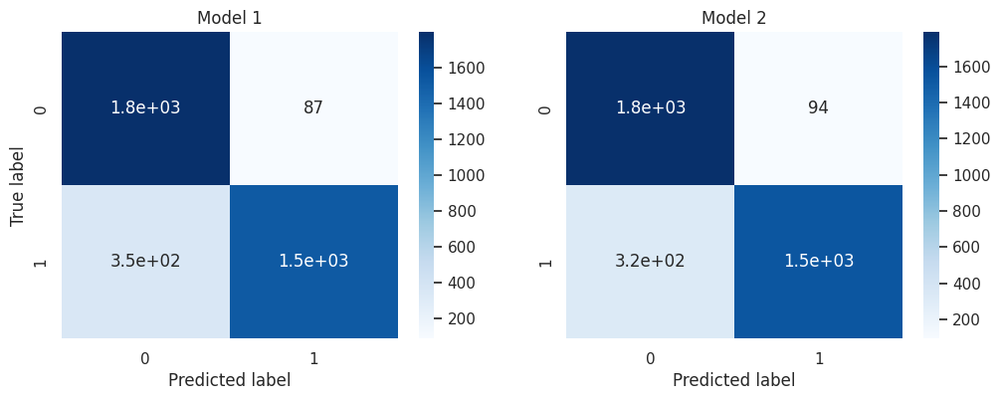

In [ ]:
y_pred_lr1 = lr1.predict(X_test_bc)
y_pred_lr2 = lr2.predict(X_test_bc)

conf_matrix_model1 = confusion_matrix(y_test_bc, y_pred_lr1)
conf_matrix_model2 = confusion_matrix(y_test_bc, y_pred_lr2)

fig, axs = plt.subplots(1, 2, figsize = (12, 4))

sns.heatmap(conf_matrix_model1, annot = True, cmap = 'Blues', ax = axs[0])
axs[0].set_title('Model 1')

sns.heatmap(conf_matrix_model2, annot = True, cmap = 'Blues', ax = axs[1])
axs[1].set_title('Model 2')

axs[0].set_xlabel('Predicted label')
axs[0].set_ylabel('True label')
axs[1].set_xlabel('Predicted label')
plt.show()


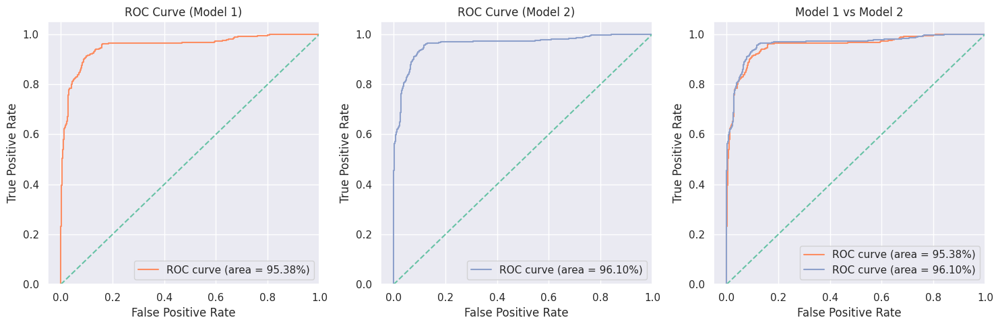

In [ ]:
y_prob_lr1 = lr1.predict_proba(X_test_bc)[:,1]
y_prob_lr2 = lr2.predict_proba(X_test_bc)[:,1]

fpr1, tpr1, _ = roc_curve(y_test_bc, y_prob_lr1)
roc_auc1 = auc(fpr1, tpr1)

fpr2, tpr2, _ = roc_curve(y_test_bc, y_prob_lr2)
roc_auc2 = auc(fpr2, tpr2)

colors = sns.color_palette('Set2', n_colors = 3)
fig, axes = plt.subplots(1, 3, figsize = (15, 5))

axes[0].plot(fpr1, tpr1, label = f'ROC curve (area = {roc_auc1:.2%})', color = colors[1])
axes[0].plot([0, 1], [0, 1], color=colors[0], linestyle='--')
axes[0].set_xlim([-0.05, 1.0])
axes[0].set_ylim([0.0, 1.05])
axes[0].set_xlabel('False Positive Rate')
axes[0].set_ylabel('True Positive Rate')
axes[0].set_title('ROC Curve (Model 1)')
axes[0].legend(loc = 'lower right')

axes[1].plot(fpr2, tpr2, label = f'ROC curve (area = {roc_auc2:.2%})', color = colors[2])
axes[1].plot([0, 1], [0, 1], color=colors[0], linestyle='--')
axes[1].set_xlim([-0.05, 1.0])
axes[1].set_ylim([0.0, 1.05])
axes[1].set_xlabel('False Positive Rate')
axes[1].set_ylabel('True Positive Rate')
axes[1].set_title('ROC Curve (Model 2)')
axes[1].legend(loc = 'lower right')

axes[2].plot(fpr1, tpr1, label = f'ROC curve (area = {roc_auc1:.2%})', color = colors[1])
axes[2].plot(fpr2, tpr2, label = f'ROC curve (area = {roc_auc2:.2%})', color = colors[2])
axes[2].plot([0, 1], [0, 1], color=colors[0], linestyle='--')
axes[2].set_xlim([-0.05, 1.0])
axes[2].set_ylim([0.0, 1.05])
axes[2].set_xlabel('False Positive Rate')
axes[2].set_ylabel('True Positive Rate')
axes[2].set_title('Model 1 vs Model 2')
axes[2].legend(loc = 'lower right')

plt.tight_layout()
plt.show()


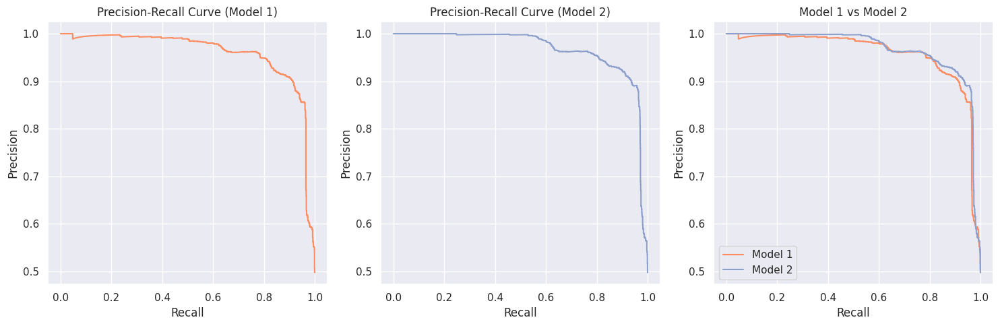

In [ ]:
precision1, recall1, threshold1 = precision_recall_curve(y_test_bc, y_prob_lr1)
precision2, recall2, threshold2 = precision_recall_curve(y_test_bc, y_prob_lr2)

fig, axs = plt.subplots(1, 3, figsize=(15, 5))

axs[0].plot(recall1, precision1, color = colors[1], label='Model 1')
axs[0].set_xlabel('Recall')
axs[0].set_ylabel('Precision')
axs[0].set_title('Precision-Recall Curve (Model 1)')

axs[1].plot(recall2, precision2, color = colors[2], label='Model 2')
axs[1].set_xlabel('Recall')
axs[1].set_ylabel('Precision')
axs[1].set_title('Precision-Recall Curve (Model 2)')


axs[2].plot(recall1, precision1, color = colors[1], label='Model 1')
axs[2].plot(recall2, precision2, color = colors[2], label='Model 2')
axs[2].set_xlabel('Recall')
axs[2].set_ylabel('Precision')
axs[2].set_title('Model 1 vs Model 2')
axs[2].legend(loc = 'lower left')

plt.tight_layout()
plt.show()


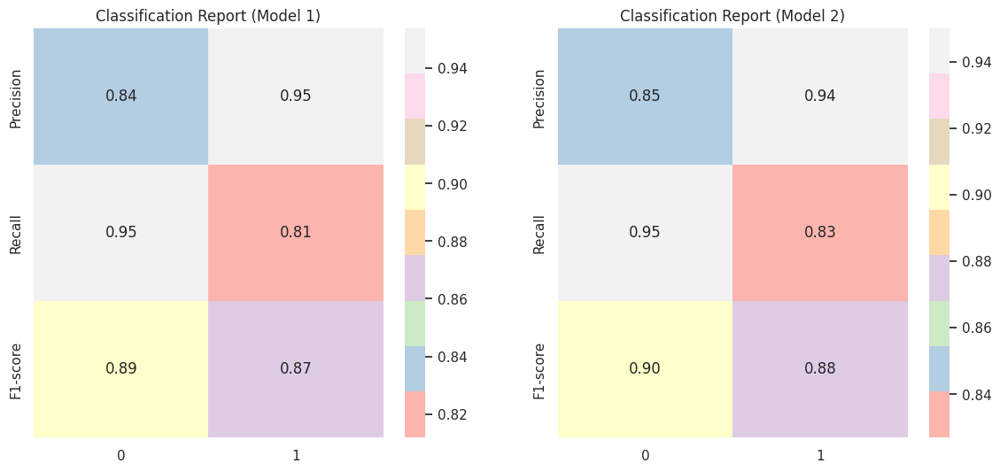

In [ ]:
target_names = lr1.classes_
metrics1 = classification_report(y_true=y_test_bc, y_pred=y_pred_lr1, target_names=target_names, output_dict=True)
precision1 = [metrics1[target_name]['precision'] for target_name in target_names]
recall1 = [metrics1[target_name]['recall'] for target_name in target_names]
f1_score1 = [metrics1[target_name]['f1-score'] for target_name in target_names]

metrics2 = classification_report(y_true=y_test_bc, y_pred=y_pred_lr2, target_names=target_names, output_dict=True)
precision2 = [metrics2[target_name]['precision'] for target_name in target_names]
recall2 = [metrics2[target_name]['recall'] for target_name in target_names]
f1_score2 = [metrics2[target_name]['f1-score'] for target_name in target_names]

# Create heatmap subplots
data1 = np.array([precision1, recall1, f1_score1])
data2 = np.array([precision2, recall2, f1_score2])
rows = ['Precision', 'Recall', 'F1-score']

fig, axs = plt.subplots(1, 2, figsize=(14, 6))
sns.heatmap(data1, cmap='Pastel1', annot=True, fmt='.2f', xticklabels=target_names, yticklabels=rows, ax=axs[0])
sns.heatmap(data2, cmap='Pastel1', annot=True, fmt='.2f', xticklabels=target_names, yticklabels=rows, ax=axs[1])
axs[0].set_title('Classification Report (Model 1)')
axs[1].set_title('Classification Report (Model 2)')
plt.show()


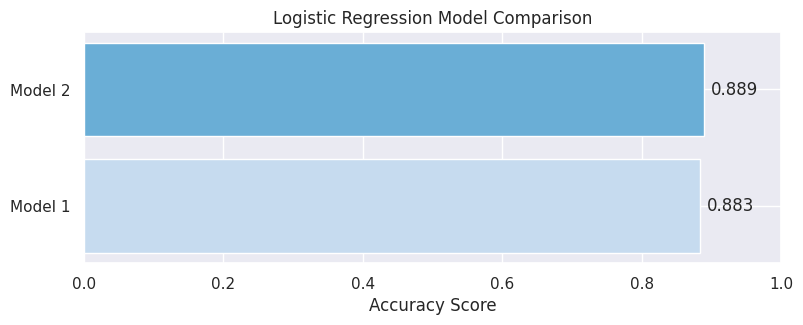

In [ ]:
palette = sns.color_palette('Blues', n_colors = 3)

acc1 = accuracy_score(y_pred_lr1, y_test_bc)
acc2 = accuracy_score(y_pred_lr2, y_test_bc)

labels = ['Model 1', 'Model 2']
scores = [acc1, acc2]

fig, ax = plt.subplots(figsize=(9, 3))
ax.barh(labels, scores, color = palette)
ax.set_xlim([0, 1])
ax.set_xlabel('Accuracy Score')
ax.set_title('Logistic Regression Model Comparison')

for i, v in enumerate(scores):
    ax.text(v + 0.01, i, str(round(v, 3)), ha='left', va='center')

plt.show()


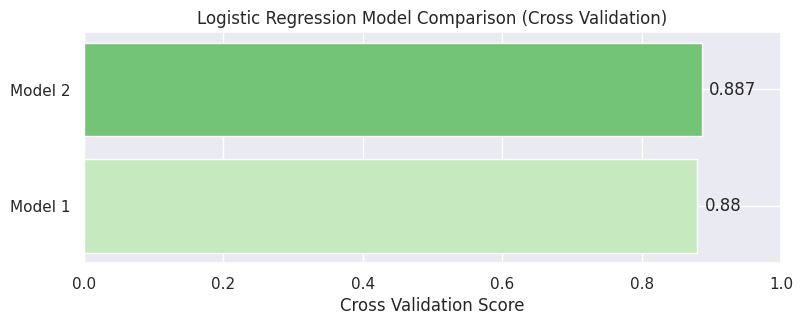

In [ ]:
palette = sns.color_palette('Greens', n_colors = 3)

labels = ['Model 1', 'Model 2']
scores = [cv_lr1.mean(), cv_lr2.mean()]

fig, ax = plt.subplots(figsize=(9, 3))
ax.barh(labels, scores, color = palette)
ax.set_xlim([0, 1])
ax.set_xlabel('Cross Validation Score')
ax.set_title('Logistic Regression Model Comparison (Cross Validation)')

for i, v in enumerate(scores):
    ax.text(v + 0.01, i, str(round(v, 3)), ha='left', va='center')

plt.show()


### Support Vector Machine Models Comparison

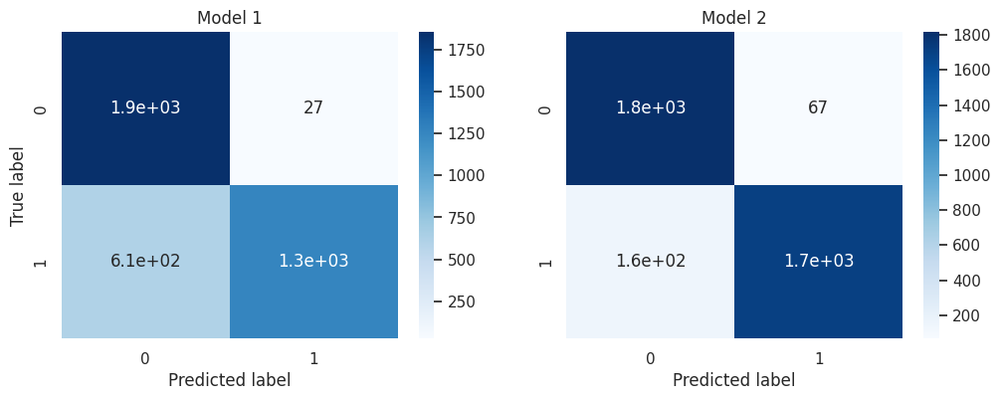

In [ ]:
y_pred_svm1 = svm1.predict(X_test_bc)
y_pred_svm2 = svm2.predict(X_test_bc)

conf_matrix_model1 = confusion_matrix(y_test_bc, y_pred_svm1)
conf_matrix_model2 = confusion_matrix(y_test_bc, y_pred_svm2)

fig, axs = plt.subplots(1, 2, figsize = (12, 4))

sns.heatmap(conf_matrix_model1, annot = True, cmap = 'Blues', ax = axs[0])
axs[0].set_title('Model 1')

sns.heatmap(conf_matrix_model2, annot = True, cmap = 'Blues', ax = axs[1])
axs[1].set_title('Model 2')

axs[0].set_xlabel('Predicted label')
axs[0].set_ylabel('True label')
axs[1].set_xlabel('Predicted label')
plt.show()


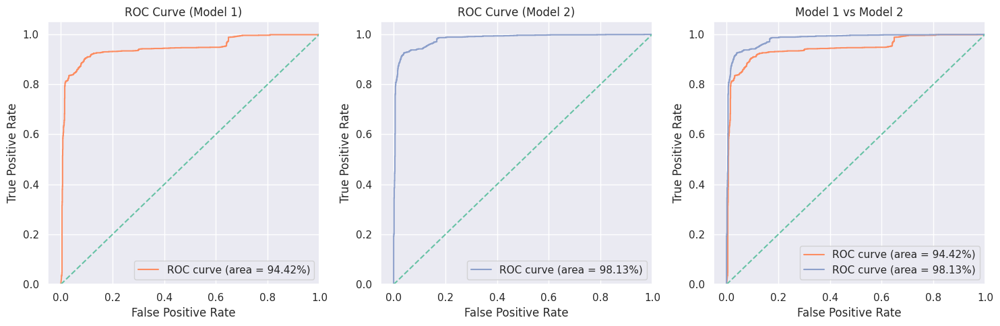

In [ ]:
y_prob_svm1 = svm1.predict_proba(X_test_bc)[:,1]
y_prob_svm2 = svm2.predict_proba(X_test_bc)[:,1]

fpr1, tpr1, _ = roc_curve(y_test_bc, y_prob_svm1)
roc_auc1 = auc(fpr1, tpr1)

fpr2, tpr2, _ = roc_curve(y_test_bc, y_prob_svm2)
roc_auc2 = auc(fpr2, tpr2)

fig, axes = plt.subplots(1, 3, figsize = (15, 5))

axes[0].plot(fpr1, tpr1, label = f'ROC curve (area = {roc_auc1:.2%})', color = colors[1])
axes[0].plot([0, 1], [0, 1], color=colors[0], linestyle='--')
axes[0].set_xlim([-0.05, 1.0])
axes[0].set_ylim([0.0, 1.05])
axes[0].set_xlabel('False Positive Rate')
axes[0].set_ylabel('True Positive Rate')
axes[0].set_title('ROC Curve (Model 1)')
axes[0].legend(loc = 'lower right')

axes[1].plot(fpr2, tpr2, label = f'ROC curve (area = {roc_auc2:.2%})', color = colors[2])
axes[1].plot([0, 1], [0, 1], color=colors[0], linestyle='--')
axes[1].set_xlim([-0.05, 1.0])
axes[1].set_ylim([0.0, 1.05])
axes[1].set_xlabel('False Positive Rate')
axes[1].set_ylabel('True Positive Rate')
axes[1].set_title('ROC Curve (Model 2)')
axes[1].legend(loc = 'lower right')

axes[2].plot(fpr1, tpr1, label = f'ROC curve (area = {roc_auc1:.2%})', color = colors[1])
axes[2].plot(fpr2, tpr2, label = f'ROC curve (area = {roc_auc2:.2%})', color = colors[2])
axes[2].plot([0, 1], [0, 1], color=colors[0], linestyle='--')
axes[2].set_xlim([-0.05, 1.0])
axes[2].set_ylim([0.0, 1.05])
axes[2].set_xlabel('False Positive Rate')
axes[2].set_ylabel('True Positive Rate')
axes[2].set_title('Model 1 vs Model 2')
axes[2].legend(loc = 'lower right')

plt.tight_layout()
plt.show()


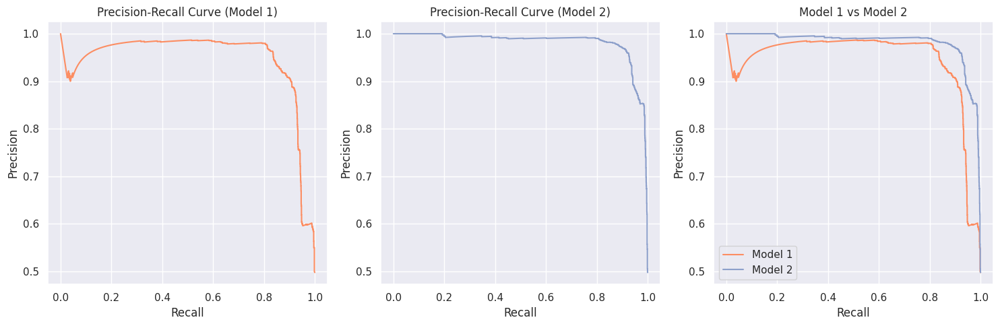

In [ ]:
precision1, recall1, threshold1 = precision_recall_curve(y_test_bc, y_prob_svm1)
precision2, recall2, threshold2 = precision_recall_curve(y_test_bc, y_prob_svm2)

fig, axs = plt.subplots(1, 3, figsize=(15, 5))

axs[0].plot(recall1, precision1, color = colors[1])
axs[0].set_xlabel('Recall')
axs[0].set_ylabel('Precision')
axs[0].set_title('Precision-Recall Curve (Model 1)')

axs[1].plot(recall2, precision2, color = colors[2])
axs[1].set_xlabel('Recall')
axs[1].set_ylabel('Precision')
axs[1].set_title('Precision-Recall Curve (Model 2)')


axs[2].plot(recall1, precision1, color = colors[1], label='Model 1')
axs[2].plot(recall2, precision2, color = colors[2], label='Model 2')
axs[2].set_xlabel('Recall')
axs[2].set_ylabel('Precision')
axs[2].set_title('Model 1 vs Model 2')
axs[2].legend(loc = 'lower left')

plt.tight_layout()
plt.show()


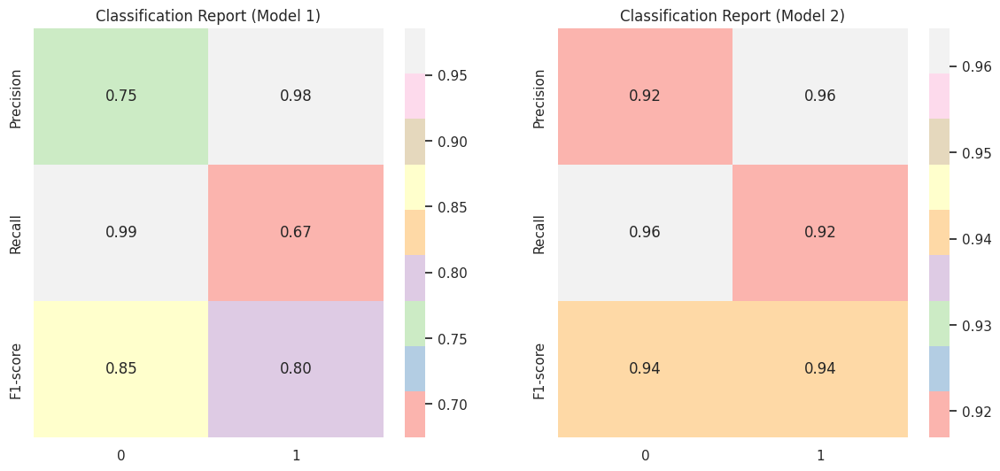

In [ ]:
target_names = svm1.classes_
metrics1 = classification_report(y_true=y_test_bc, y_pred=y_pred_svm1, target_names=target_names, output_dict=True)
precision1 = [metrics1[target_name]['precision'] for target_name in target_names]
recall1 = [metrics1[target_name]['recall'] for target_name in target_names]
f1_score1 = [metrics1[target_name]['f1-score'] for target_name in target_names]

metrics2 = classification_report(y_true=y_test_bc, y_pred=y_pred_svm2, target_names=target_names, output_dict=True)
precision2 = [metrics2[target_name]['precision'] for target_name in target_names]
recall2 = [metrics2[target_name]['recall'] for target_name in target_names]
f1_score2 = [metrics2[target_name]['f1-score'] for target_name in target_names]

# Create heatmap subplots
data1 = np.array([precision1, recall1, f1_score1])
data2 = np.array([precision2, recall2, f1_score2])
rows = ['Precision', 'Recall', 'F1-score']

fig, axs = plt.subplots(1, 2, figsize=(14, 6))
sns.heatmap(data1, cmap='Pastel1', annot=True, fmt='.2f', xticklabels=target_names, yticklabels=rows, ax=axs[0])
sns.heatmap(data2, cmap='Pastel1', annot=True, fmt='.2f', xticklabels=target_names, yticklabels=rows, ax=axs[1])
axs[0].set_title('Classification Report (Model 1)')
axs[1].set_title('Classification Report (Model 2)')
plt.show()


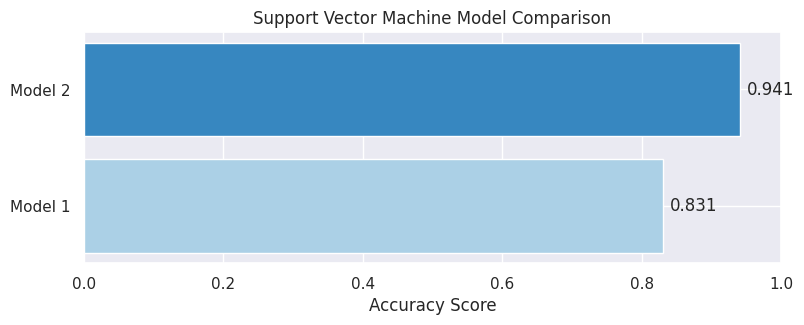

In [ ]:
palette = sns.color_palette('Blues', n_colors = 2)

acc1 = accuracy_score(y_pred_svm1, y_test_bc)
acc2 = accuracy_score(y_pred_svm2, y_test_bc)

labels = ['Model 1', 'Model 2']
scores = [acc1, acc2]

fig, ax = plt.subplots(figsize=(9, 3))
ax.barh(labels, scores, color = palette)
ax.set_xlim([0, 1])
ax.set_xlabel('Accuracy Score')
ax.set_title('Support Vector Machine Model Comparison')

for i, v in enumerate(scores):
    ax.text(v + 0.01, i, str(round(v, 3)), ha='left', va='center')

plt.show()


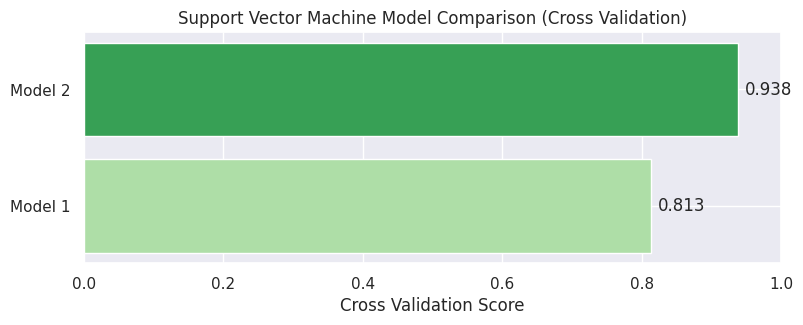

In [ ]:
palette = sns.color_palette('Greens', n_colors = 2)

labels = ['Model 1', 'Model 2']
scores = [cv_svm1.mean(), cv_svm2.mean()]

fig, ax = plt.subplots(figsize=(9, 3))
ax.barh(labels, scores, color = palette)
ax.set_xlim([0, 1])
ax.set_xlabel('Cross Validation Score')
ax.set_title('Support Vector Machine Model Comparison (Cross Validation)')

for i, v in enumerate(scores):
    ax.text(v + 0.01, i, str(round(v, 3)), ha='left', va='center')

plt.show()


### Comparison of the Binary Classification Algorithms

We trained two models for each different classification algorithm. For comparing different algorithms, we will take the best performing model from each class based on the model's precision, recall, accuracy, etc.

1. Logistic Regression: Model 2
1. Support Vector Machine: Model 2

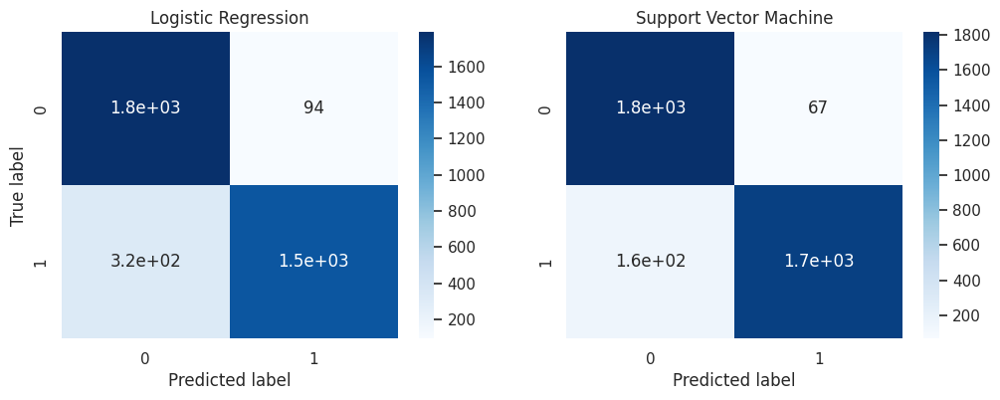

In [ ]:
conf_matrix_model1 = confusion_matrix(y_test_bc, y_pred_lr2)
conf_matrix_model2 = confusion_matrix(y_test_bc, y_pred_svm2)

fig, axs = plt.subplots(1, 2, figsize = (12, 4))

sns.heatmap(conf_matrix_model1, annot = True, cmap = 'Blues', ax = axs[0])
axs[0].set_title('Logistic Regression')

sns.heatmap(conf_matrix_model2, annot = True, cmap = 'Blues', ax = axs[1])
axs[1].set_title('Support Vector Machine')

axs[0].set_xlabel('Predicted label')
axs[0].set_ylabel('True label')
axs[1].set_xlabel('Predicted label')
plt.show()


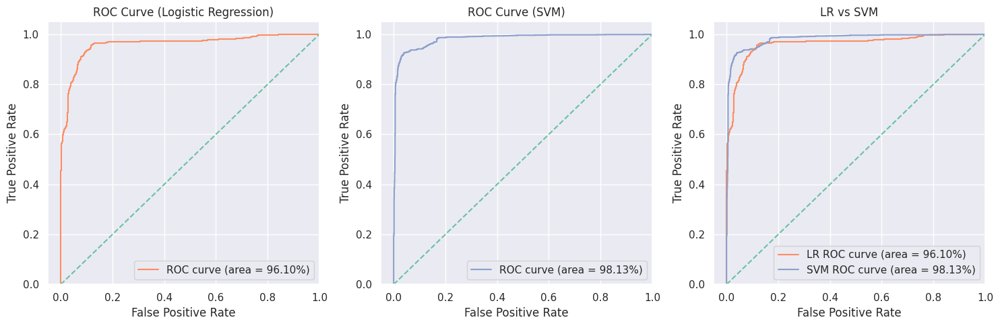

In [ ]:
fpr1, tpr1, _ = roc_curve(y_test_bc, y_prob_lr2)
roc_auc1 = auc(fpr1, tpr1)

fpr2, tpr2, _ = roc_curve(y_test_bc, y_prob_svm2)
roc_auc2 = auc(fpr2, tpr2)

fig, axes = plt.subplots(1, 3, figsize = (15, 5))

axes[0].plot(fpr1, tpr1, label = f'ROC curve (area = {roc_auc1:.2%})', color = colors[1])
axes[0].plot([0, 1], [0, 1], color=colors[0], linestyle='--')
axes[0].set_xlim([-0.05, 1.0])
axes[0].set_ylim([0.0, 1.05])
axes[0].set_xlabel('False Positive Rate')
axes[0].set_ylabel('True Positive Rate')
axes[0].set_title('ROC Curve (Logistic Regression)')
axes[0].legend(loc = 'lower right')

axes[1].plot(fpr2, tpr2, label = f'ROC curve (area = {roc_auc2:.2%})', color = colors[2])
axes[1].plot([0, 1], [0, 1], color=colors[0], linestyle='--')
axes[1].set_xlim([-0.05, 1.0])
axes[1].set_ylim([0.0, 1.05])
axes[1].set_xlabel('False Positive Rate')
axes[1].set_ylabel('True Positive Rate')
axes[1].set_title('ROC Curve (SVM)')
axes[1].legend(loc = 'lower right')

axes[2].plot(fpr1, tpr1, label = f'LR ROC curve (area = {roc_auc1:.2%})', color = colors[1])
axes[2].plot(fpr2, tpr2, label = f'SVM ROC curve (area = {roc_auc2:.2%})', color = colors[2])
axes[2].plot([0, 1], [0, 1], color=colors[0], linestyle='--')
axes[2].set_xlim([-0.05, 1.0])
axes[2].set_ylim([0.0, 1.05])
axes[2].set_xlabel('False Positive Rate')
axes[2].set_ylabel('True Positive Rate')
axes[2].set_title('LR vs SVM')
axes[2].legend(loc = 'lower right')

plt.tight_layout()
plt.show()


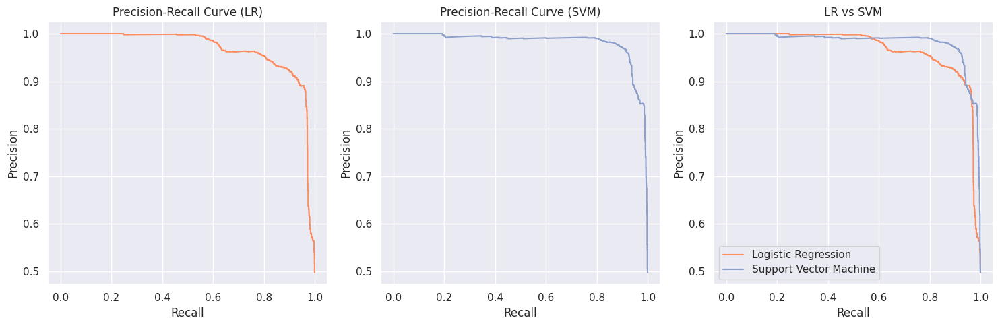

In [ ]:
precision1, recall1, threshold1 = precision_recall_curve(y_test_bc, y_prob_lr2)
precision2, recall2, threshold2 = precision_recall_curve(y_test_bc, y_prob_svm2)

fig, axs = plt.subplots(1, 3, figsize=(15, 5))

axs[0].plot(recall1, precision1, color = colors[1], label='Model 1')
axs[0].set_xlabel('Recall')
axs[0].set_ylabel('Precision')
axs[0].set_title('Precision-Recall Curve (LR)')

axs[1].plot(recall2, precision2, color = colors[2], label='Model 2')
axs[1].set_xlabel('Recall')
axs[1].set_ylabel('Precision')
axs[1].set_title('Precision-Recall Curve (SVM)')


axs[2].plot(recall1, precision1, color = colors[1], label='Logistic Regression')
axs[2].plot(recall2, precision2, color = colors[2], label='Support Vector Machine')
axs[2].set_xlabel('Recall')
axs[2].set_ylabel('Precision')
axs[2].set_title('LR vs SVM')
axs[2].legend(loc = 'lower left')

plt.tight_layout()
plt.show()


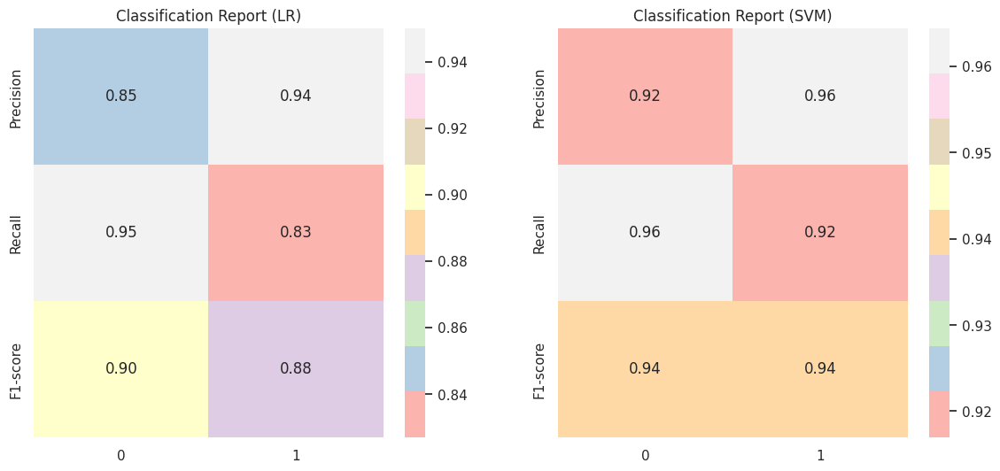

In [ ]:
target_names = svm2.classes_
metrics1 = classification_report(y_true=y_test_bc, y_pred=y_pred_lr2, target_names=target_names, output_dict=True)
precision1 = [metrics1[target_name]['precision'] for target_name in target_names]
recall1 = [metrics1[target_name]['recall'] for target_name in target_names]
f1_score1 = [metrics1[target_name]['f1-score'] for target_name in target_names]

metrics2 = classification_report(y_true=y_test_bc, y_pred=y_pred_svm2, target_names=target_names, output_dict=True)
precision2 = [metrics2[target_name]['precision'] for target_name in target_names]
recall2 = [metrics2[target_name]['recall'] for target_name in target_names]
f1_score2 = [metrics2[target_name]['f1-score'] for target_name in target_names]

# Create heatmap subplots
data1 = np.array([precision1, recall1, f1_score1])
data2 = np.array([precision2, recall2, f1_score2])
rows = ['Precision', 'Recall', 'F1-score']

fig, axs = plt.subplots(1, 2, figsize=(14, 6))
sns.heatmap(data1, cmap='Pastel1', annot=True, fmt='.2f', xticklabels=target_names, yticklabels=rows, ax=axs[0])
sns.heatmap(data2, cmap='Pastel1', annot=True, fmt='.2f', xticklabels=target_names, yticklabels=rows, ax=axs[1])
axs[0].set_title('Classification Report (LR)')
axs[1].set_title('Classification Report (SVM)')
plt.show()


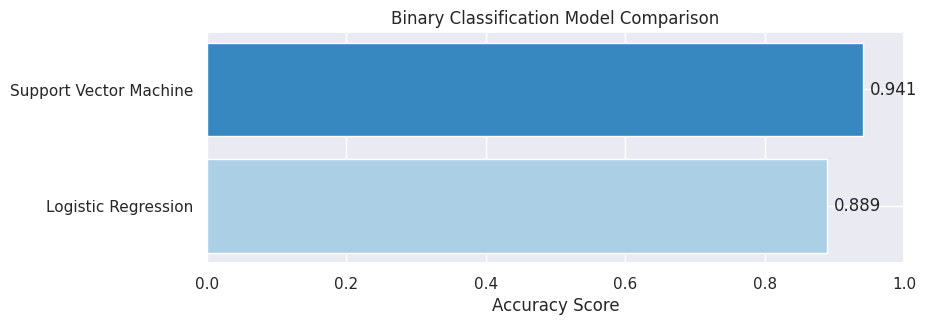

In [ ]:
palette = sns.color_palette('Blues', n_colors = 2)

acc1 = accuracy_score(y_pred_lr2, y_test_bc)
acc2 = accuracy_score(y_pred_svm2, y_test_bc)

labels = ['Logistic Regression', 'Support Vector Machine']
scores = [acc1, acc2]

fig, ax = plt.subplots(figsize=(9, 3))
ax.barh(labels, scores, color = palette)
ax.set_xlim([0, 1])
ax.set_xlabel('Accuracy Score')
ax.set_title('Binary Classification Model Comparison')

for i, v in enumerate(scores):
    ax.text(v + 0.01, i, str(round(v, 3)), ha='left', va='center')

plt.show()


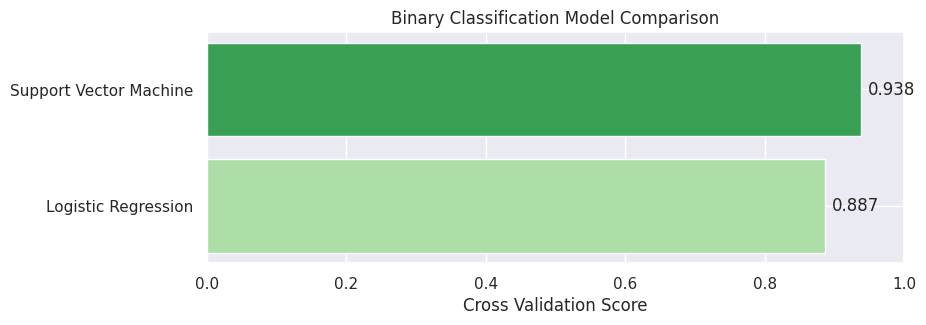

In [ ]:
palette = sns.color_palette('Greens', n_colors = 2)

labels = ['Logistic Regression', 'Support Vector Machine']
scores = [cv_lr2.mean(), cv_svm2.mean()]

fig, ax = plt.subplots(figsize=(9, 3))
ax.barh(labels, scores, color = palette)
ax.set_xlim([0, 1])
ax.set_xlabel('Cross Validation Score')
ax.set_title('Binary Classification Model Comparison')

for i, v in enumerate(scores):
    ax.text(v + 0.01, i, str(round(v, 3)), ha='left', va='center')

plt.show()


### Random Forest Models Comparison

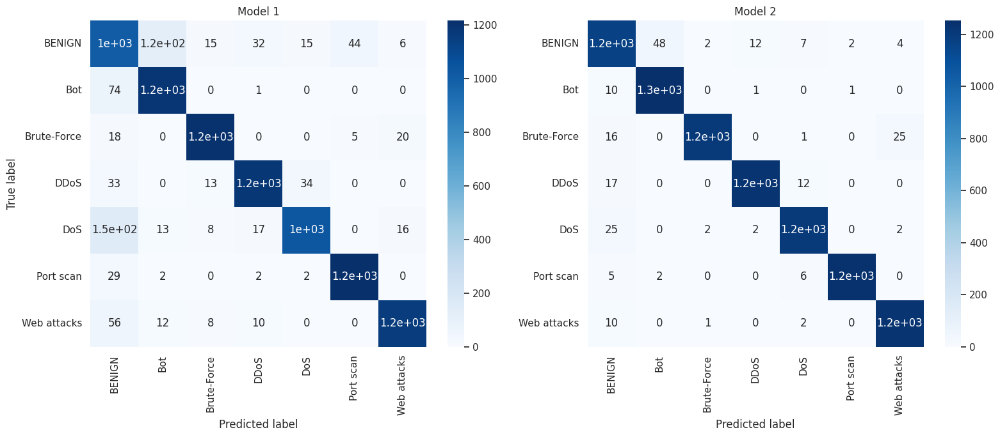

In [ ]:
y_pred_rf1 = rf1.predict(X_test)
y_pred_rf2 = rf2.predict(X_test)

conf_matrix_model1 = confusion_matrix(y_test, y_pred_rf1)
conf_matrix_model2 = confusion_matrix(y_test, y_pred_rf2)

fig, axs = plt.subplots(1, 2, figsize=(16, 7))

sns.heatmap(conf_matrix_model1, annot = True, cmap = 'Blues', ax = axs[0], xticklabels=rf1.classes_, yticklabels=rf1.classes_)
axs[0].set_title('Model 1')

sns.heatmap(conf_matrix_model2, annot = True, cmap = 'Blues', ax = axs[1], xticklabels=rf2.classes_, yticklabels=rf2.classes_)
axs[1].set_title('Model 2')

axs[0].set_xlabel('Predicted label')
axs[0].set_ylabel('True label')
axs[1].set_xlabel('Predicted label')

fig.tight_layout()
plt.show()


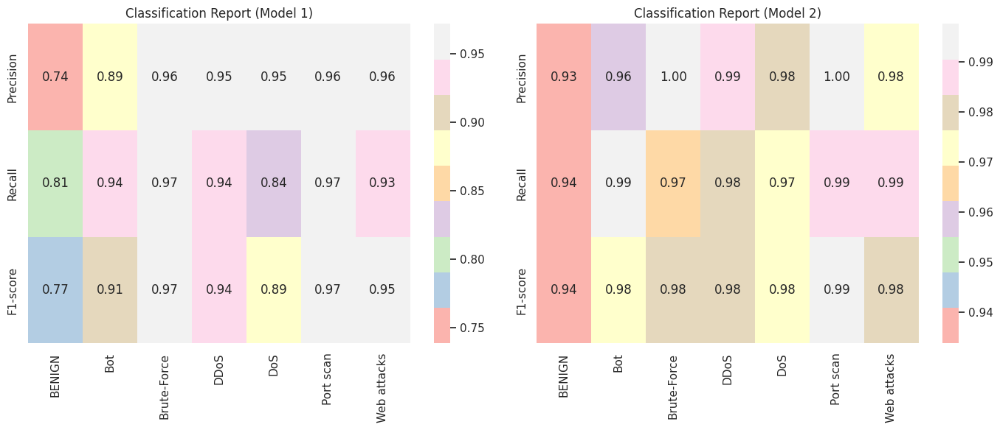

In [ ]:
target_names = rf1.classes_
metrics1 = classification_report(y_true=y_test, y_pred=y_pred_rf1, target_names=target_names, output_dict=True)
precision1 = [metrics1[target_name]['precision'] for target_name in target_names]
recall1 = [metrics1[target_name]['recall'] for target_name in target_names]
f1_score1 = [metrics1[target_name]['f1-score'] for target_name in target_names]

metrics2 = classification_report(y_true=y_test, y_pred=y_pred_rf2, target_names=target_names, output_dict=True)
precision2 = [metrics2[target_name]['precision'] for target_name in target_names]
recall2 = [metrics2[target_name]['recall'] for target_name in target_names]
f1_score2 = [metrics2[target_name]['f1-score'] for target_name in target_names]

# Create heatmap subplots
data1 = np.array([precision1, recall1, f1_score1])
data2 = np.array([precision2, recall2, f1_score2])
rows = ['Precision', 'Recall', 'F1-score']

fig, axs = plt.subplots(1, 2, figsize=(14, 6))
sns.heatmap(data1, cmap='Pastel1', annot=True, fmt='.2f', xticklabels=target_names, yticklabels=rows, ax=axs[0])
sns.heatmap(data2, cmap='Pastel1', annot=True, fmt='.2f', xticklabels=target_names, yticklabels=rows, ax=axs[1])
axs[0].set_title('Classification Report (Model 1)')
axs[1].set_title('Classification Report (Model 2)')
fig.tight_layout()
plt.show()


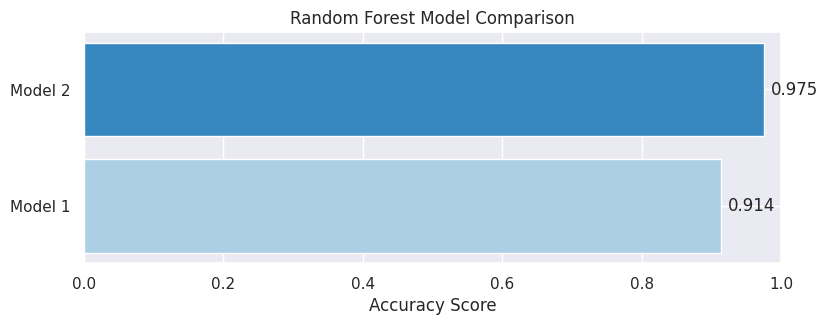

In [ ]:
palette = sns.color_palette('Blues', n_colors = 2)

acc1 = accuracy_score(y_pred_rf1, y_test)
acc2 = accuracy_score(y_pred_rf2, y_test)

labels = ['Model 1', 'Model 2']
scores = [acc1, acc2]

fig, ax = plt.subplots(figsize=(9, 3))
ax.barh(labels, scores, color = palette)
ax.set_xlim([0, 1])
ax.set_xlabel('Accuracy Score')
ax.set_title('Random Forest Model Comparison')

for i, v in enumerate(scores):
    ax.text(v + 0.01, i, str(round(v, 3)), ha='left', va='center')

plt.show()


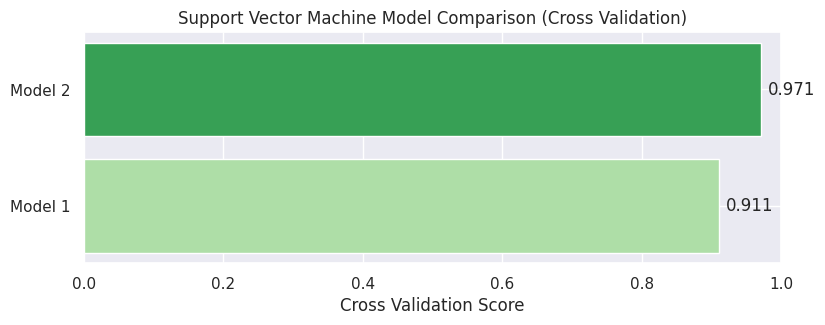

In [ ]:
palette = sns.color_palette('Greens', n_colors = 2)

labels = ['Model 1', 'Model 2']
scores = [cv_rf1.mean(), cv_rf2.mean()]

fig, ax = plt.subplots(figsize=(9, 3))
ax.barh(labels, scores, color = palette)
ax.set_xlim([0, 1])
ax.set_xlabel('Cross Validation Score')
ax.set_title('Support Vector Machine Model Comparison (Cross Validation)')

for i, v in enumerate(scores):
    ax.text(v + 0.01, i, str(round(v, 3)), ha='left', va='center')

plt.show()


### Decision Trees Models Comparison

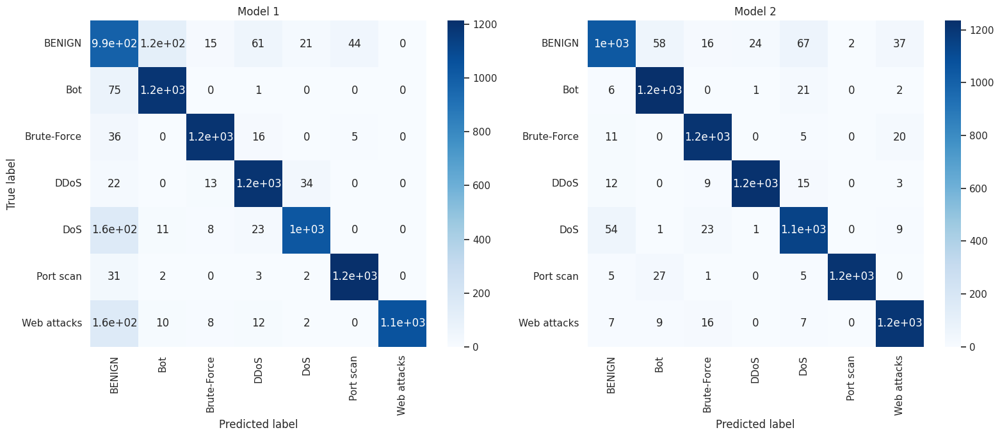

In [ ]:
y_pred_dt1 = dt1.predict(X_test)
y_pred_dt2 = dt2.predict(X_test)

conf_matrix_model1 = confusion_matrix(y_test, y_pred_dt1)
conf_matrix_model2 = confusion_matrix(y_test, y_pred_dt2)

fig, axs = plt.subplots(1, 2, figsize=(16, 7))

sns.heatmap(conf_matrix_model1, annot = True, cmap = 'Blues', ax = axs[0], xticklabels=dt1.classes_, yticklabels=dt1.classes_)
axs[0].set_title('Model 1')

sns.heatmap(conf_matrix_model2, annot = True, cmap = 'Blues', ax = axs[1], xticklabels=dt2.classes_, yticklabels=dt2.classes_)
axs[1].set_title('Model 2')

axs[0].set_xlabel('Predicted label')
axs[0].set_ylabel('True label')
axs[1].set_xlabel('Predicted label')

fig.tight_layout()
plt.show()


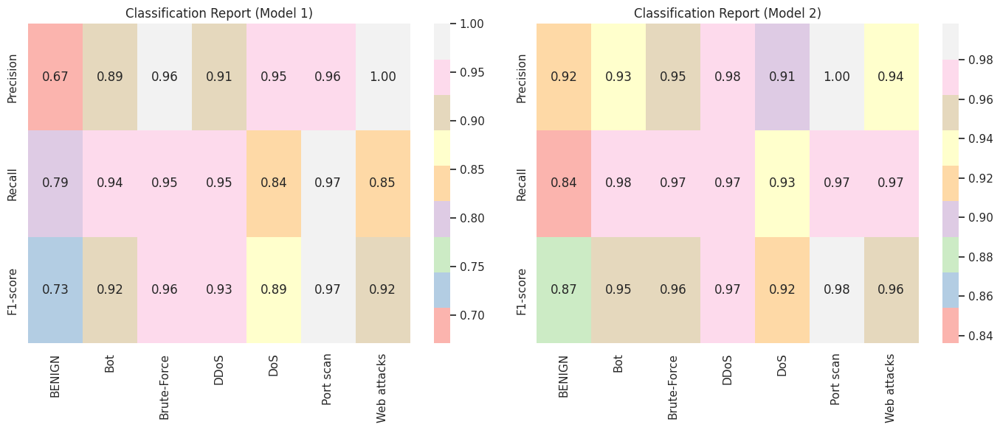

In [ ]:
target_names = dt1.classes_
metrics1 = classification_report(y_true=y_test, y_pred=y_pred_dt1, target_names=target_names, output_dict=True)
precision1 = [metrics1[target_name]['precision'] for target_name in target_names]
recall1 = [metrics1[target_name]['recall'] for target_name in target_names]
f1_score1 = [metrics1[target_name]['f1-score'] for target_name in target_names]

metrics2 = classification_report(y_true=y_test, y_pred=y_pred_dt2, target_names=target_names, output_dict=True)
precision2 = [metrics2[target_name]['precision'] for target_name in target_names]
recall2 = [metrics2[target_name]['recall'] for target_name in target_names]
f1_score2 = [metrics2[target_name]['f1-score'] for target_name in target_names]

# Create heatmap subplots
data1 = np.array([precision1, recall1, f1_score1])
data2 = np.array([precision2, recall2, f1_score2])
rows = ['Precision', 'Recall', 'F1-score']

fig, axs = plt.subplots(1, 2, figsize=(14, 6))
sns.heatmap(data1, cmap='Pastel1', annot=True, fmt='.2f', xticklabels=target_names, yticklabels=rows, ax=axs[0])
sns.heatmap(data2, cmap='Pastel1', annot=True, fmt='.2f', xticklabels=target_names, yticklabels=rows, ax=axs[1])
axs[0].set_title('Classification Report (Model 1)')
axs[1].set_title('Classification Report (Model 2)')
fig.tight_layout()
plt.show()


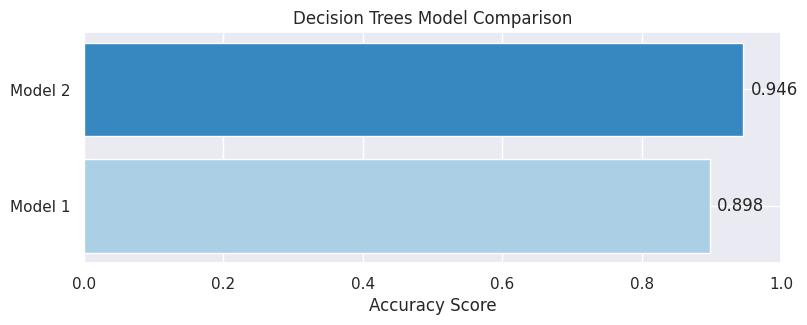

In [ ]:
palette = sns.color_palette('Blues', n_colors = 2)

acc1 = accuracy_score(y_pred_dt1, y_test)
acc2 = accuracy_score(y_pred_dt2, y_test)

labels = ['Model 1', 'Model 2']
scores = [acc1, acc2]

fig, ax = plt.subplots(figsize=(9, 3))
ax.barh(labels, scores, color = palette)
ax.set_xlim([0, 1])
ax.set_xlabel('Accuracy Score')
ax.set_title('Decision Trees Model Comparison')

for i, v in enumerate(scores):
    ax.text(v + 0.01, i, str(round(v, 3)), ha='left', va='center')

plt.show()


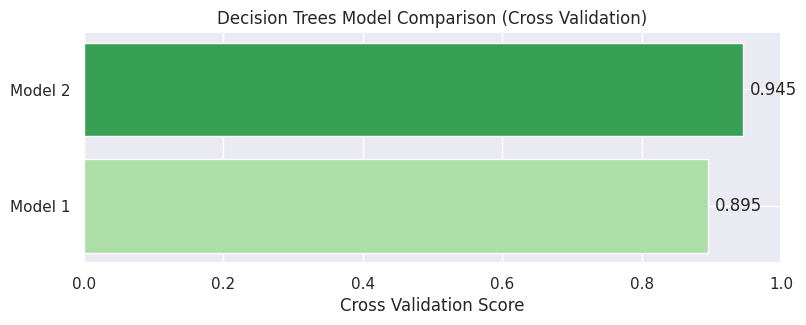

In [ ]:
palette = sns.color_palette('Greens', n_colors = 2)

labels = ['Model 1', 'Model 2']
scores = [cv_dt1.mean(), cv_dt2.mean()]

fig, ax = plt.subplots(figsize=(9, 3))
ax.barh(labels, scores, color = palette)
ax.set_xlim([0, 1])
ax.set_xlabel('Cross Validation Score')
ax.set_title('Decision Trees Model Comparison (Cross Validation)')

for i, v in enumerate(scores):
    ax.text(v + 0.01, i, str(round(v, 3)), ha='left', va='center')

plt.show()


### K Nearest Neighbours Models Comparison

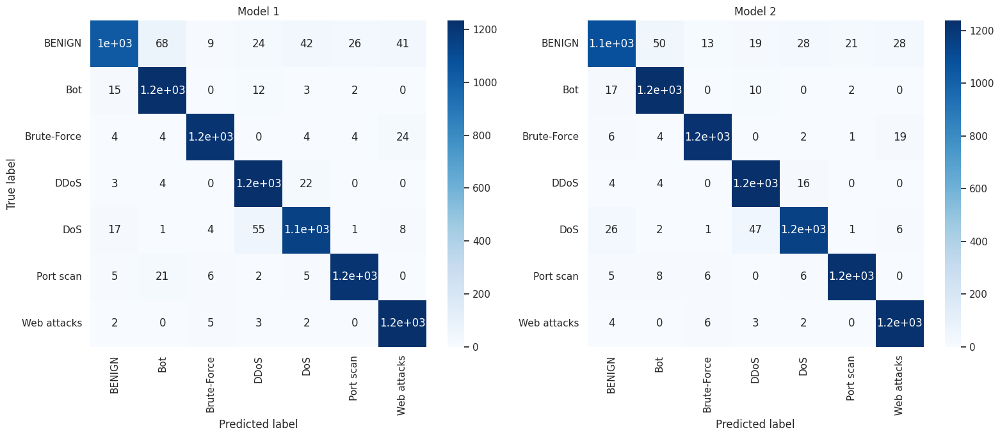

In [ ]:
y_pred_knn1 = knn1.predict(X_test)
y_pred_knn2 = knn2.predict(X_test)

conf_matrix_model1 = confusion_matrix(y_test, y_pred_knn1)
conf_matrix_model2 = confusion_matrix(y_test, y_pred_knn2)

fig, axs = plt.subplots(1, 2, figsize=(16, 7))

sns.heatmap(conf_matrix_model1, annot = True, cmap = 'Blues', ax = axs[0], xticklabels=knn1.classes_, yticklabels=knn1.classes_)
axs[0].set_title('Model 1')

sns.heatmap(conf_matrix_model2, annot = True, cmap = 'Blues', ax = axs[1], xticklabels=knn2.classes_, yticklabels=knn2.classes_)
axs[1].set_title('Model 2')

axs[0].set_xlabel('Predicted label')
axs[0].set_ylabel('True label')
axs[1].set_xlabel('Predicted label')

fig.tight_layout()
plt.show()


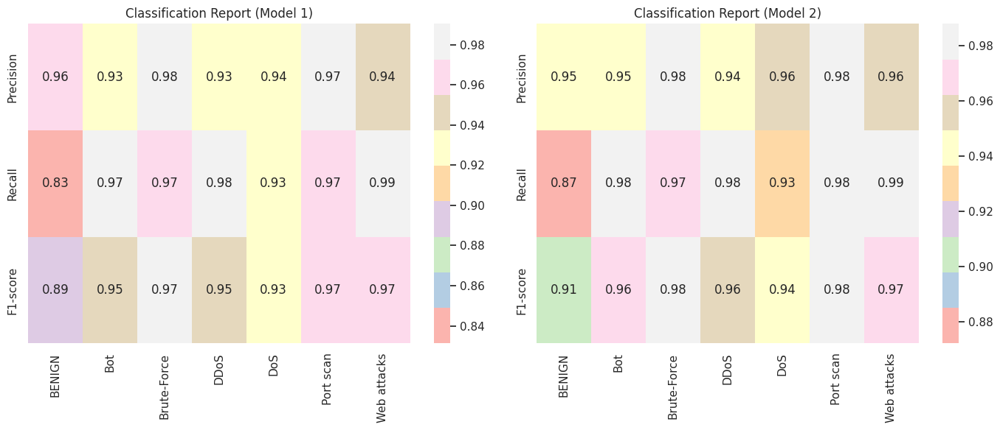

In [ ]:
target_names = knn1.classes_
metrics1 = classification_report(y_true=y_test, y_pred=y_pred_knn1, target_names=target_names, output_dict=True)
precision1 = [metrics1[target_name]['precision'] for target_name in target_names]
recall1 = [metrics1[target_name]['recall'] for target_name in target_names]
f1_score1 = [metrics1[target_name]['f1-score'] for target_name in target_names]

metrics2 = classification_report(y_true=y_test, y_pred=y_pred_knn2, target_names=target_names, output_dict=True)
precision2 = [metrics2[target_name]['precision'] for target_name in target_names]
recall2 = [metrics2[target_name]['recall'] for target_name in target_names]
f1_score2 = [metrics2[target_name]['f1-score'] for target_name in target_names]

# Create heatmap subplots
data1 = np.array([precision1, recall1, f1_score1])
data2 = np.array([precision2, recall2, f1_score2])
rows = ['Precision', 'Recall', 'F1-score']

fig, axs = plt.subplots(1, 2, figsize=(14, 6))
sns.heatmap(data1, cmap='Pastel1', annot=True, fmt='.2f', xticklabels=target_names, yticklabels=rows, ax=axs[0])
sns.heatmap(data2, cmap='Pastel1', annot=True, fmt='.2f', xticklabels=target_names, yticklabels=rows, ax=axs[1])
axs[0].set_title('Classification Report (Model 1)')
axs[1].set_title('Classification Report (Model 2)')
fig.tight_layout()
plt.show()


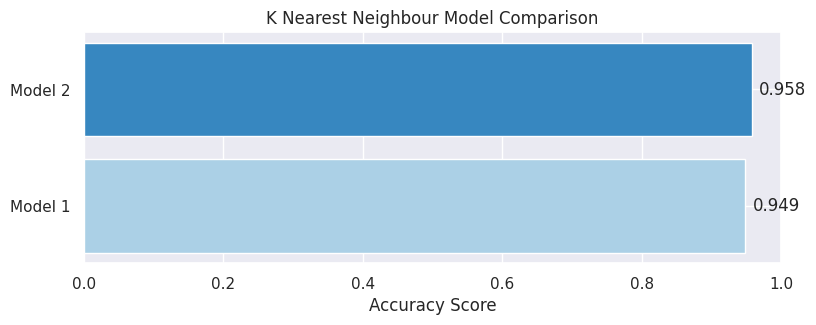

In [ ]:
palette = sns.color_palette('Blues', n_colors = 2)

acc1 = accuracy_score(y_pred_knn1, y_test)
acc2 = accuracy_score(y_pred_knn2, y_test)

labels = ['Model 1', 'Model 2']
scores = [acc1, acc2]

fig, ax = plt.subplots(figsize=(9, 3))
ax.barh(labels, scores, color = palette)
ax.set_xlim([0, 1])
ax.set_xlabel('Accuracy Score')
ax.set_title('K Nearest Neighbour Model Comparison')

for i, v in enumerate(scores):
    ax.text(v + 0.01, i, str(round(v, 3)), ha='left', va='center')

plt.show()


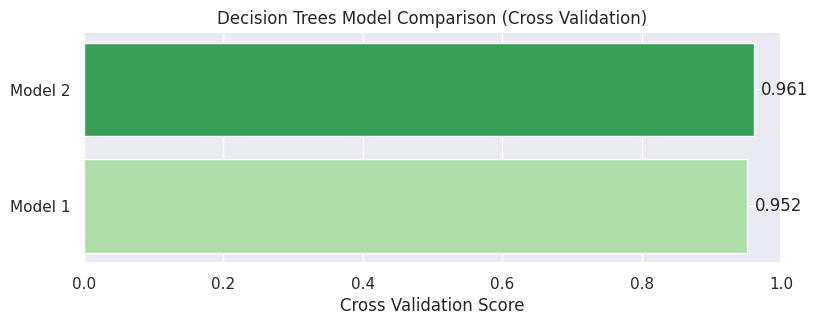

In [ ]:
palette = sns.color_palette('Greens', n_colors = 2)

labels = ['Model 1', 'Model 2']
scores = [cv_knn1.mean(), cv_knn2.mean()]

fig, ax = plt.subplots(figsize=(9, 3))
ax.barh(labels, scores, color = palette)
ax.set_xlim([0, 1])
ax.set_xlabel('Cross Validation Score')
ax.set_title('Decision Trees Model Comparison (Cross Validation)')

for i, v in enumerate(scores):
    ax.text(v + 0.01, i, str(round(v, 3)), ha='left', va='center')

plt.show()


### Comparison of the Multi-class Classification Algorithms

We trained two models for each different classification algorithm. For comparing different algorithms, we will take the best performing model from each class based on the model's precision, recall, accuracy, etc.

1. Random Forest: Model 2
1. Decision Trees: Model 2
1. KNN: Model 2

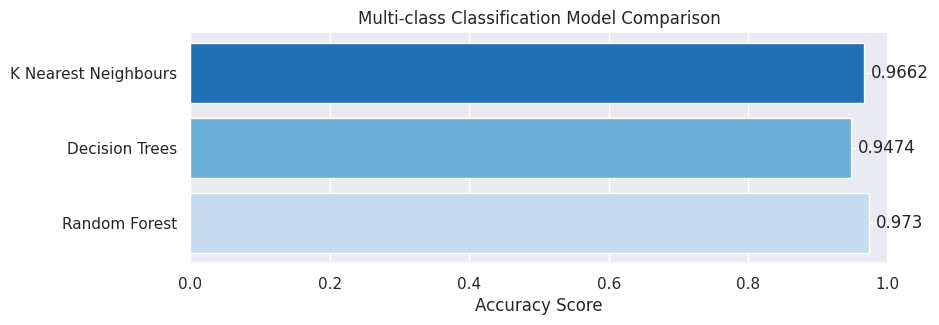

In [ ]:
palette = sns.color_palette('Blues', n_colors = 3)

rf_acc = accuracy_score(y_pred_rf2, y_test)
dt_acc = accuracy_score(y_pred_dt2, y_test)
knn_acc = accuracy_score(y_pred_knn2, y_test)

labels = ['Random Forest', 'Decision Trees', 'K Nearest Neighbours']
scores = [rf_acc, dt_acc, knn_acc]

fig, ax = plt.subplots(figsize=(9, 3))
ax.barh(labels, scores, color = palette)
ax.set_xlim([0, 1])
ax.set_xlabel('Accuracy Score')
ax.set_title('Multi-class Classification Model Comparison')

for i, v in enumerate(scores):
    ax.text(v + 0.01, i, str(round(v, 4)), ha='left', va='center')

plt.show()


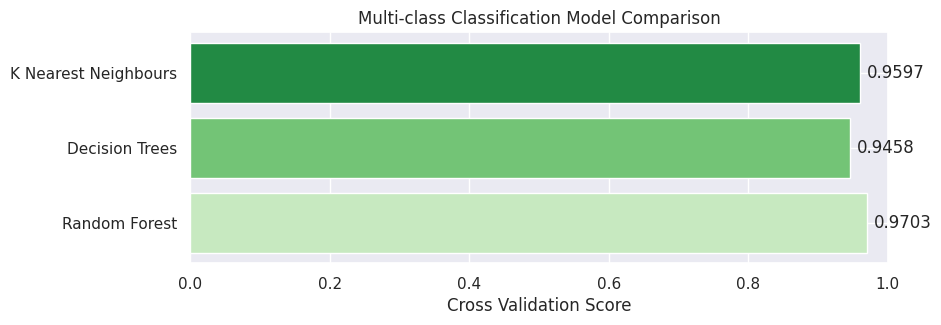

In [ ]:
palette = sns.color_palette('Greens', n_colors = 3)

labels = ['Random Forest', 'Decision Trees', 'K Nearest Neighbours']
scores = [cv_rf2.mean(), cv_dt2.mean(), cv_knn2.mean()]

fig, ax = plt.subplots(figsize=(9, 3))
ax.barh(labels, scores, color = palette)
ax.set_xlim([0, 1])
ax.set_xlabel('Cross Validation Score')
ax.set_title('Multi-class Classification Model Comparison')

for i, v in enumerate(scores):
    ax.text(v + 0.01, i, str(round(v, 4)), ha='left', va='center')

plt.show()


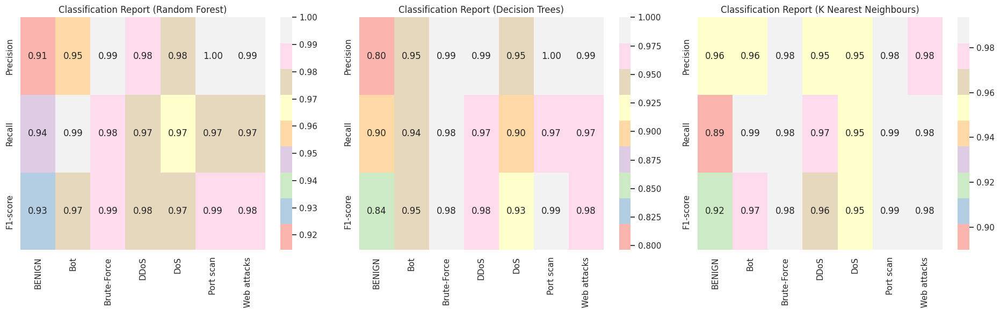

In [ ]:
target_names = rf2.classes_
preds = [y_pred_rf2, y_pred_dt2, y_pred_knn2]

datas = []
for pred in preds:
    metrics = classification_report(y_true=y_test, y_pred=pred, target_names=target_names, output_dict=True)
    precision = [metrics[target_name]['precision'] for target_name in target_names]
    recall = [metrics[target_name]['recall'] for target_name in target_names]
    f1_score = [metrics[target_name]['f1-score'] for target_name in target_names]

    datas.append(np.array([precision, recall, f1_score]))

rows = ['Precision', 'Recall', 'F1-score']

fig, axs = plt.subplots(1, 3, figsize=(19, 6))
sns.heatmap(datas[0], cmap='Pastel1', annot=True, fmt='.2f', xticklabels=target_names, yticklabels=rows, ax=axs[0])
sns.heatmap(datas[1], cmap='Pastel1', annot=True, fmt='.2f', xticklabels=target_names, yticklabels=rows, ax=axs[1])
sns.heatmap(datas[2], cmap='Pastel1', annot=True, fmt='.2f', xticklabels=target_names, yticklabels=rows, ax=axs[2])

axs[0].set_title('Classification Report (Random Forest)')
axs[1].set_title('Classification Report (Decision Trees)')
axs[2].set_title('Classification Report (K Nearest Neighbours)')
fig.tight_layout()

plt.show()


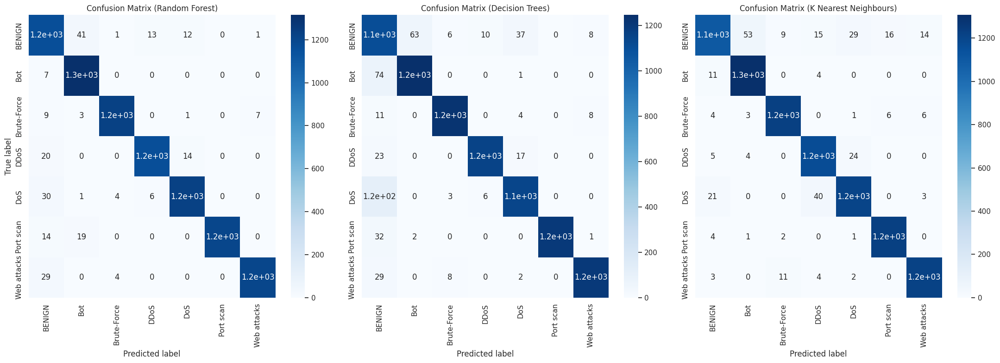

In [ ]:
preds = [y_pred_rf2, y_pred_dt2, y_pred_knn2]

conf_matrix = [confusion_matrix(y_test, y_pred) for y_pred in preds]

fig, axs = plt.subplots(1, 3, figsize = (22, 8))

sns.heatmap(conf_matrix[0], annot = True, cmap = 'Blues', ax = axs[0], xticklabels=dt1.classes_, yticklabels=dt1.classes_)
sns.heatmap(conf_matrix[1], annot = True, cmap = 'Blues', ax = axs[1], xticklabels=dt1.classes_, yticklabels=dt1.classes_)
sns.heatmap(conf_matrix[2], annot = True, cmap = 'Blues', ax = axs[2], xticklabels=dt1.classes_, yticklabels=dt1.classes_)

axs[0].set_title('Confusion Matrix (Random Forest)')
axs[1].set_title('Confusion Matrix (Decision Trees)')
axs[2].set_title('Confusion Matrix (K Nearest Neighbours)')

axs[0].set_xlabel('Predicted label')
axs[1].set_xlabel('Predicted label')
axs[2].set_xlabel('Predicted label')
axs[0].set_ylabel('True label')

fig.tight_layout()
plt.show()


### **Write Here**
\
During the training phase of various classification algorithms, we trained two models for each of the algorithm using different parameters.\
\
***Binary Classification Algorithms:***
1. Logistic Regression
2. Support Vector Machine


For comapring different classification algorithms, we took the best performing models from each algorithms.

Based on our various tests, we found out that logistic Regression can handle large-size data and can be trained in a very short amount of time. However, the drawback is less accurate models. On the other hand, SVM is quite computationally expensive and takes a hefty amount of time to train. but the good thing is the accuracy score is much higher than the logistic regression models. We tuned a few parameters here and there to improve the models' accuracy.
We also did cross-validation to make sure that our model was not overfitted and was trained just right.

One other thing to mention is that the accuracy of the models is dependent on the standardization of the dataset. We trained our model with and without the use of a standard scaler. During our testing, we found out that the accuracy and other performance measure scores went significantly high after standardizing the dataset.

\


***Multi-class Classification Algorithms:***
1. Random Forest
2. Decision Trees
3. K Nearest Neighbours


Again, for comapring different classification algorithms, we took the best performing models from each of the 3 algorithms.

The time taken to train the multi-class classification models is relatively lower than the binary classification models. This could be due to the fact that the train data size is smaller than the binary classification train data.
As shown above in the analysis section, the dataset is highly imbalanced. In order to keep the data balanced over all classes, we first took most number of samples from the minority classes and sufficient number pof sample from the majority clasees. Later we used SMOTE (Synthetic Minority Over-sampling Technique) to create an overall balanced dataset for training the multi-class classification models. 

By comparing the performance metrics of the models, we see that random forest is the best-performing model followed by KNN and decision trees. From the confusion matrix and the classification report, the dominance of random forest in terms of precision, recall, and f1-score is evident. The reason decision trees falling behind is that it is not always expressive enough to capture complex relationships between the input features and the target variable. Decision trees may struggle with problems where the target variable depends on a combination of input features rather than just one or two features. k-NN and RF can handle more complex relationships between the input features and the target variable by using more flexible models. Also, we used relatively fewer parameters to tune the Decision Tree models. Just like the binary classification algorithms, we also cross-validated the multi-class classification models to make sure they were not overfitted. 

For multi-class classification, the role of standard scaler was not that signifiacant. Even without the scaler, the models performed quite well. With the scaler, overall scores would increase very slightly. 
